# 데이터 로드 및 전처리

## Data 불러오기

In [ ]:
from google.colab import drive
import zipfile
import os

# 구글 드라이브를 마운트합니다.
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# zip 파일 경로
zip_file_path = '/content/drive/MyDrive/BUU-LSPINE_400.zip'

# 압축을 풀 폴더 경로
extract_folder = '/content/spine_data_400'

# 압축 파일 열기 및 추출
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_folder)

In [ ]:
# 추출된 BUU-LSPINE_400 폴더로 들어가기
buu_folder = os.path.join(extract_folder, 'BUU-LSPINE_400')

# BUU-LSPINE_400 폴더 안의 파일 및 폴더 확인
extracted_files = os.listdir(buu_folder)
print(f"BUU-LSPINE_400 폴더 안의 파일 및 폴더: {extracted_files}")

BUU-LSPINE_400 폴더 안의 파일 및 폴더: ['LA', 'BUU-LSPINE_400_report.xlsx', 'AP']


In [ ]:
import glob
from PIL import Image
import pandas as pd

# AP 폴더 경로와 LA 폴더 경로 설정
ap_folder = os.path.join(buu_folder, 'AP')
la_folder = os.path.join(buu_folder, 'LA')

# AP 폴더 안의 이미지 파일 경로만 가져오기 (예: jpg, png 파일)
ap_images = glob.glob(os.path.join(ap_folder, '*.jpg')) + glob.glob(os.path.join(ap_folder, '*.png'))
la_images = glob.glob(os.path.join(la_folder, '*.jpg')) + glob.glob(os.path.join(la_folder, '*.png'))

print(f"AP 이미지 개수: {len(ap_images)}")
print(f"LA 이미지 개수: {len(la_images)}")

AP 이미지 개수: 400
LA 이미지 개수: 400


In [ ]:
!pip install openpyxl

In [ ]:
excel_file_path = os.path.join(buu_folder, 'BUU-LSPINE_400_report.xlsx')

la_sheet = 'pos_LA_BUU-LSPINE_400'
la_df = pd.read_excel(excel_file_path, sheet_name=la_sheet)

print(f"Sheet '{la_sheet}'의 데이터:")
print(la_df.head())

Sheet 'pos_LA_BUU-LSPINE_400'의 데이터:
   Column1      filename gender  age type     L1a_1c    L1a_1r     L1a_2c  \
0        0  0001-F-037Y1      F   37   LA   608.5929  352.6718   826.9116   
1        1  0003-F-013Y1      F   13   LA   772.4448  207.5458   953.4622   
2        2  0004-F-010Y1      F   10   LA   617.4070  400.7533   782.6827   
3        3  0005-F-025Y1      F   25   LA  1083.8950  248.5624  1273.3730   
4        4  0006-F-031Y1      F   31   LA   853.2159  652.7126  1026.8300   

     L1a_2r     L1b_1c  ...    L5b_2r     S1a_1c    S1a_1r     S1a_2c  \
0  376.5861   580.5040  ...  1474.216   483.4817  1624.151   681.5828   
1  269.9656   717.8275  ...  1126.033   551.5165  1240.550   704.9568   
2  411.1787   594.9558  ...  1141.984   849.9302  1289.932   937.3315   
3  289.3103  1034.9970  ...  1265.159  1116.0610  1411.361  1255.0260   
4  674.8260   812.7203  ...  1552.956  1148.7650  1672.106  1234.4680   

     S1a_2r  L1b_d  L2b_d  L3b_d  L4b_d  L5b_d  
0  1508.435  

## 시각화

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

ima_path = '/content/spine_data_400/BUU-LSPINE_400/AP/0001-F-037Y0.jpg'
c_path = '/content/spine_data_400/BUU-LSPINE_400/AP/0001-F-037Y0.csv'

# 이미지 불러오기
image = Image.open(ima_path)

# CSV 파일에서 좌표 데이터 불러오기
# 해당 파일은 탭('\t')으로 구분된 데이터라고 가정
df1 = pd.read_csv(c_path, sep=',', header=None)
print(df1.head())

          0         1         2         3  4
0  876.2222  167.0618  1111.472  168.7665  0
1  865.9939  313.6671  1119.996  313.6671  0
2  870.8508  344.4474  1116.587  351.1707  0
3  847.6437  498.0999  1119.997  511.2078  0
4  842.3262  553.4754  1108.814  557.2025  0


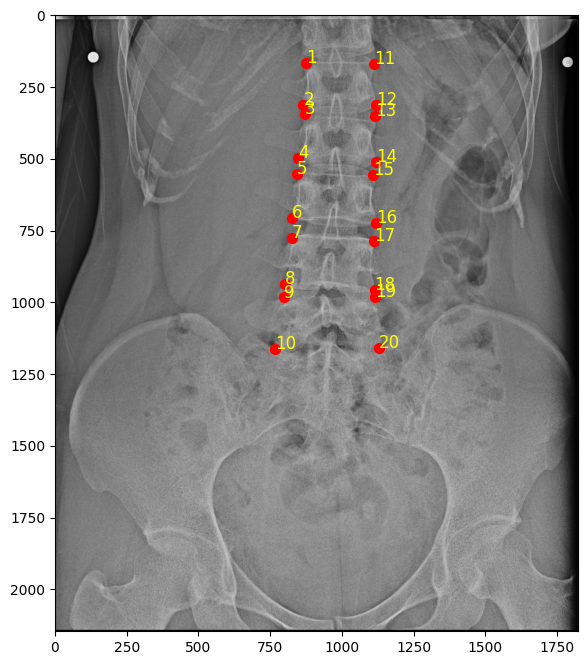

In [ ]:
# 첫 번째와 두 번째 열은 (A, B) 좌표, 세 번째와 네 번째 열은 (C, D) 좌표
x_coords = list(df1[0]) + list(df1[2])  # (A 좌표들 + C 좌표들)
y_coords = list(df1[1]) + list(df1[3])  # (B 좌표들 + D 좌표들)

# 이미지 시각화
plt.figure(figsize=(8, 8))
plt.imshow(image)

# 이미지 위에 좌표 찍기 (빨간색 점으로 시각화)
plt.scatter(x_coords, y_coords, c='red', s=50)  # s는 점 크기, c는 색상

# 좌표 확인을 위해 번호 표시
for i, (x, y) in enumerate(zip(x_coords, y_coords)):
    plt.text(x, y, str(i+1), color="yellow", fontsize=12)

# 시각화 결과 출력
plt.show()

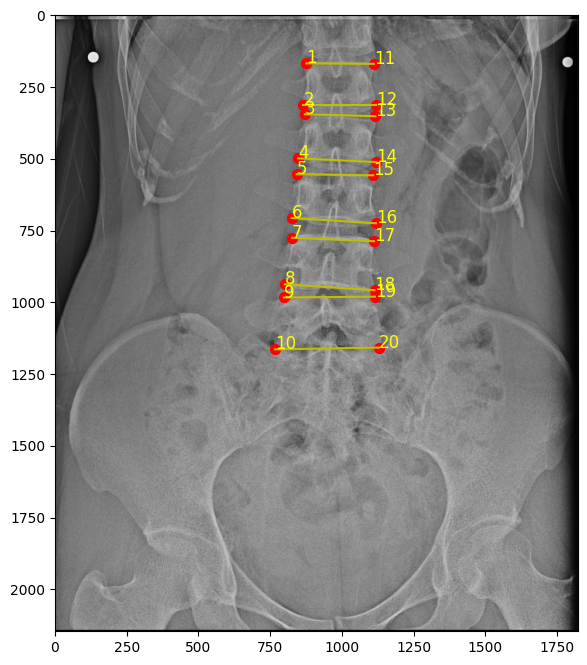

In [ ]:
# 이미지 시각화
plt.figure(figsize=(8, 8))
plt.imshow(image)

# 좌표를 번호로 표시
for i, (x, y) in enumerate(zip(x_coords, y_coords)):
    plt.text(x, y, str(i+1), color="yellow", fontsize=12)

for i in range(10):  # 앞의 10개의 좌표를 1-11, 2-12 형식으로 연결
    plt.plot([x_coords[i], x_coords[i+10]], [y_coords[i], y_coords[i+10]], 'y-')  # 'y-'는 노란색 선

# 이미지 위에 좌표 찍기 (빨간색 점으로 시각화)
plt.scatter(x_coords, y_coords, c='red', s=50)  # s는 점 크기, c는 색상

# 시각화 결과 출력
plt.show()

질병이 있는 환자의 사진으로 시각화 진행

In [ ]:
import matplotlib.pyplot as plt

image_path = '/content/spine_data_400/BUU-LSPINE_400/AP/0277-F-050Y0.jpg'
csv_path = '/content/spine_data_400/BUU-LSPINE_400/AP/0277-F-050Y0.csv'

# 이미지 불러오기
image = Image.open(image_path)

# CSV 파일에서 좌표 데이터 불러오기
# 해당 파일은 탭('\t')으로 구분된 데이터라고 가정
df = pd.read_csv(csv_path, sep=',', header=None)
print(df.head())

          0          1         2         3  4
0  852.0241   475.1850  1145.223  530.3322  0
1  795.9578   652.5751  1124.084  716.9135  0
2  782.1710   770.2225  1112.135  731.6194  0
3  795.0387   963.2377  1137.870  919.1199  0
4  845.5903  1050.5540  1181.069  935.6641  0


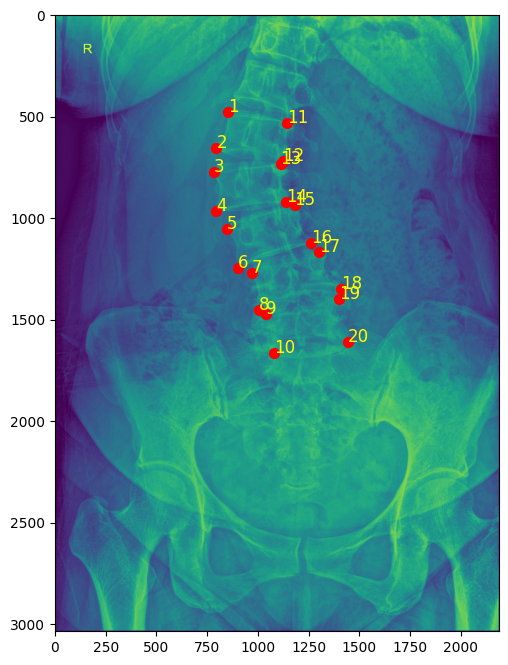

In [ ]:
# 첫 번째와 두 번째 열은 (A, B) 좌표, 세 번째와 네 번째 열은 (C, D) 좌표
x_coords = list(df[0]) + list(df[2])  # (A 좌표들 + C 좌표들)
y_coords = list(df[1]) + list(df[3])  # (B 좌표들 + D 좌표들)

# 이미지 시각화
plt.figure(figsize=(8, 8))
plt.imshow(image)

# 이미지 위에 좌표 찍기 (빨간색 점으로 시각화)
plt.scatter(x_coords, y_coords, c='red', s=50)  # s는 점 크기, c는 색상

# 좌표 확인을 위해 번호 표시
for i, (x, y) in enumerate(zip(x_coords, y_coords)):
    plt.text(x, y, str(i+1), color="yellow", fontsize=12)

# 시각화 결과 출력
plt.show()

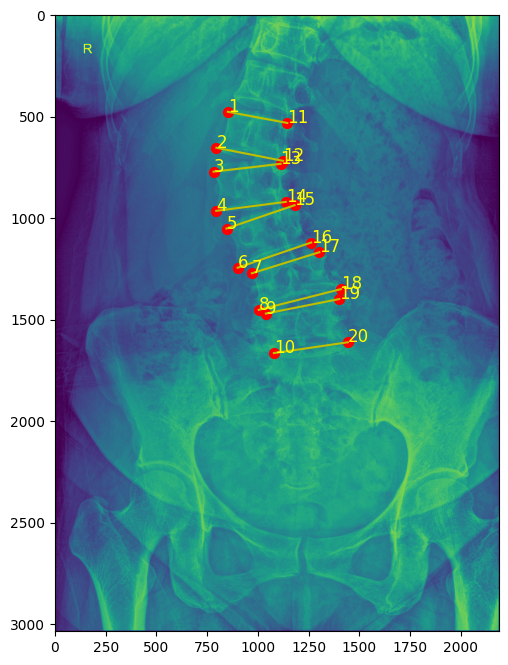

In [ ]:
# 이미지 시각화
plt.figure(figsize=(8, 8))
plt.imshow(image)

# 좌표를 번호로 표시
for i, (x, y) in enumerate(zip(x_coords, y_coords)):
    plt.text(x, y, str(i+1), color="yellow", fontsize=12)

for i in range(10):  # 앞의 10개의 좌표를 1-11, 2-12 형식으로 연결
    plt.plot([x_coords[i], x_coords[i+10]], [y_coords[i], y_coords[i+10]], 'y-')  # 'y-'는 노란색 선

# 이미지 위에 좌표 찍기 (빨간색 점으로 시각화)
plt.scatter(x_coords, y_coords, c='red', s=50)  # s는 점 크기, c는 색상

# 시각화 결과 출력
plt.show()

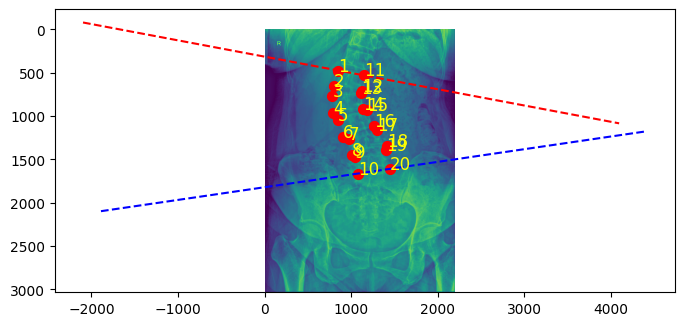

In [ ]:
import numpy as np
# 직선 연장 함수
def extend_line(x1, y1, x2, y2, length=3000):
    # 직선의 기울기 계산
    slope = (y2 - y1) / (x2 - x1)
    # 직선 연장
    new_x1 = x1 - length / np.sqrt(1 + slope**2)
    new_y1 = y1 - slope * (x1 - new_x1)
    new_x2 = x2 + length / np.sqrt(1 + slope**2)
    new_y2 = y2 + slope * (new_x2 - x2)
    return new_x1, new_y1, new_x2, new_y2

# 이미지 시각화
plt.figure(figsize=(8, 8))
plt.imshow(image)

# 좌표를 번호로 표시
for i, (x, y) in enumerate(zip(x_coords, y_coords)):
    plt.text(x, y, str(i+1), color="yellow", fontsize=12)

# 직선 연장 및 그리기
# 1-11 연결 (좌표는 0번째와 10번째)
x1_ext, y1_ext, x2_ext, y2_ext = extend_line(x_coords[0], y_coords[0], x_coords[10], y_coords[10])
plt.plot([x1_ext, x2_ext], [y1_ext, y2_ext], 'r--')  # 빨간색 점선으로 직선 연장

# 10-20 연결 (좌표는 9번째와 19번째)
x3_ext, y3_ext, x4_ext, y4_ext = extend_line(x_coords[9], y_coords[9], x_coords[19], y_coords[19])
plt.plot([x3_ext, x4_ext], [y3_ext, y4_ext], 'b--')  # 파란색 점선으로 직선 연장

# 좌표 찍기
plt.scatter(x_coords, y_coords, c='red', s=50)

# 시각화 결과 출력
plt.show()

In [ ]:
# 기울기 계산 함수
def calculate_slope(x1, y1, x2, y2):
    return (y2 - y1) / (x2 - x1)

# 직선 1 (1번과 11번)
slope1 = calculate_slope(x_coords[0], y_coords[0], x_coords[10], y_coords[10])

# 직선 2 (10번과 20번)
slope2 = calculate_slope(x_coords[9], y_coords[9], x_coords[19], y_coords[19])

# 두 직선 사이의 각도 계산
angle_radians = np.arctan(abs((slope1 - slope2) / (1 + slope1 * slope2)))
angle_degrees = np.degrees(angle_radians)

print(f"두 직선 사이의 각도: {angle_degrees:.2f}도")

두 직선 사이의 각도: 18.98도


In [ ]:
# 직선 1 (1번과 11번)
slope1 = calculate_slope(x_coords[0], y_coords[0], x_coords[10], y_coords[10])

# 직선 2 (5번과 15번)
slope2 = calculate_slope(x_coords[4], y_coords[4], x_coords[14], y_coords[14])

# 두 직선 사이의 각도 계산
angle_radians = np.arctan(abs((slope1 - slope2) / (1 + slope1 * slope2)))
angle_degrees = np.degrees(angle_radians)

print(f"두 직선 사이의 각도: {angle_degrees:.2f}도")

두 직선 사이의 각도: 29.56도


In [ ]:
# 모든 직선에 대해 수평선과의 각도를 계산
angles = []
for i in range(10):  # 1-11, 2-12, ... 10-20 형태로 직선을 연결
    slope = calculate_slope(x_coords[i], y_coords[i], x_coords[i + 10], y_coords[i + 10])
    angle_radians = np.arctan(slope)  # 기울기를 기반으로 수평선과의 각도 계산
    angle_degrees = np.degrees(angle_radians)  # 도(degree) 단위로 변환
    angles.append(angle_degrees)
    print(f"{i+1}-{i+11} 직선의 수평선 기준 각도: {angle_degrees:.2f}도")

1-11 직선의 수평선 기준 각도: 10.65도
2-12 직선의 수평선 기준 각도: 11.09도
3-13 직선의 수평선 기준 각도: -6.67도
4-14 직선의 수평선 기준 각도: -7.33도
5-15 직선의 수평선 기준 각도: -18.90도
6-16 직선의 수평선 기준 각도: -18.91도
7-17 직선의 수평선 기준 각도: -17.34도
8-18 직선의 수평선 기준 각도: -14.16도
9-19 직선의 수평선 기준 각도: -11.20도
10-20 직선의 수평선 기준 각도: -8.33도


In [ ]:
# 최대 및 최소 각도 계산
max_angle = max(angles)
min_angle = min(angles)

# 최대와 최소 각도의 차이 계산
angle_difference = max_angle - min_angle

# 결과 출력
print(f"\n최대 각도: {max_angle:.2f}도")
print(f"최소 각도: {min_angle:.2f}도")
print(f"최대 각도와 최소 각도의 차이: {angle_difference:.2f}도")


최대 각도: 11.09도
최소 각도: -18.91도
최대 각도와 최소 각도의 차이: 30.01도


In [ ]:
# 각도 차이 계산 (2개씩 차이 계산)
for i in range(0, 10, 2):
    angle_diff = abs(angles[i] - angles[i+1])
    print(f"요추 {i//2 + 1}번 각도차: {angle_diff:.2f}도")

요추 1번 각도차: 0.44도
요추 2번 각도차: 0.66도
요추 3번 각도차: 0.01도
요추 4번 각도차: 3.18도
요추 5번 각도차: 2.87도


요추마다 최대 각도 계산하면 좋을듯 하다

각 요추마다 각도차이를 계산하면 골절유무를 판단할 수 있지 않을까? - 확장성 논의 필요

## 각도 계산

In [ ]:
# 직선의 기울기 계산 함수
def calculate_slope(x1, y1, x2, y2):
    return (y2 - y1) / (x2 - x1)

# 모든 직선에 대해 수평선과의 각도를 계산하는 함수
def calculate_angles(x_coords, y_coords):
    angles = []
    for i in range(10):  # 1-11, 2-12, ... 10-20 형태로 직선을 연결
        slope = calculate_slope(x_coords[i], y_coords[i], x_coords[i + 10], y_coords[i + 10])
        angle_radians = np.arctan(slope)  # 기울기를 기반으로 수평선과의 각도 계산
        angle_degrees = np.degrees(angle_radians)  # 도(degree) 단위로 변환
        angles.append(angle_degrees)
    return angles

# CSV에서 좌표 데이터를 불러오는 함수
def read_csv_for_coordinates(c_path):
    df1 = pd.read_csv(c_path, sep=',', header=None)
    x_coords = list(df1[0]) + list(df1[2])  # (A 좌표들 + C 좌표들)
    y_coords = list(df1[1]) + list(df1[3])  # (B 좌표들 + D 좌표들)
    return x_coords, y_coords

# 모든 이미지 파일에 대해 각도를 계산하는 함수
def process_images_and_calculate_angles(image_folder, csv_folder):
    result = {}
    for filename in os.listdir(image_folder):
        if filename.endswith(".jpg"):
            img_path = os.path.join(image_folder, filename)
            csv_name = filename.replace('.jpg', '.csv')
            c_path = os.path.join(csv_folder, csv_name)

            if os.path.exists(c_path):  # CSV 파일이 존재할 때만 처리
                x_coords, y_coords = read_csv_for_coordinates(c_path)
                angles = calculate_angles(x_coords, y_coords)
                max_angle = max(angles)
                min_angle = min(angles)
                angle_difference = max_angle - min_angle

                # 결과 저장 (파일 이름: 각도)
                result[filename] = angle_difference
            else:
                print(f"CSV 파일이 존재하지 않습니다: {c_path}")

    return result

# 결과 출력 및 저장
image_folder = '/content/spine_data_400/BUU-LSPINE_400/AP/'  # 이미지 폴더 경로
csv_folder = '/content/spine_data_400/BUU-LSPINE_400/AP/'  # CSV 파일이 있는 폴더 경로

angles_dict = process_images_and_calculate_angles(image_folder, csv_folder)

# 각도 결과 출력
for filename, angle in angles_dict.items():
    print(f"{filename}: {angle:.2f}도")


0213-F-086Y0.jpg: 12.84도
0139-F-077Y0.jpg: 28.29도
0010-F-037Y0.jpg: 15.97도
0219-F-077Y0.jpg: 7.62도
0316-F-074Y0.jpg: 11.87도
0303-M-044Y0.jpg: 2.32도
0111-F-033Y0.jpg: 2.77도
0109-F-042Y0.jpg: 23.90도
0491-F-018Y0.jpg: 9.20도
0417-F-069Y0.jpg: 7.34도
0457-F-055Y0.jpg: 16.73도
0342-F-060Y0.jpg: 11.37도
0026-F-029Y0.jpg: 18.92도
0003-F-013Y0.jpg: 14.44도
0496-F-055Y0.jpg: 5.33도
0014-F-062Y0.jpg: 29.77도
0273-M-056Y0.jpg: 3.43도
0484-F-057Y0.jpg: 5.74도
0235-F-073Y0.jpg: 3.26도
0022-M-006Y0.jpg: 3.96도
0037-F-019Y0.jpg: 23.33도
0077-F-018Y0.jpg: 3.60도
0007-F-006Y0.jpg: 5.76도
0381-F-062Y0.jpg: 6.56도
0282-F-034Y0.jpg: 4.72도
0183-F-080Y0.jpg: 14.33도
0148-M-058Y0.jpg: 6.40도
0211-F-055Y0.jpg: 5.29도
0283-M-030Y0.jpg: 5.04도
0200-M-065Y0.jpg: 3.75도
0483-F-018Y0.jpg: 5.76도
0242-M-066Y0.jpg: 11.79도
0399-M-023Y0.jpg: 6.51도
0439-M-044Y0.jpg: 4.84도
0036-F-016Y0.jpg: 17.29도
0390-M-080Y0.jpg: 5.50도
0325-M-039Y0.jpg: 5.17도
0051-F-066Y0.jpg: 13.72도
0013-M-022Y0.jpg: 20.33도
0275-M-074Y0.jpg: 4.56도
0229-F-078Y0.jpg: 7.15도


In [ ]:
# ap_df에 각도 데이터를 추가하는 함수
def add_angles_to_ap_df(ap_df, angles_dict):
    # 각도를 저장할 열을 추가
    ap_df['angle_difference'] = None

    # 파일 이름에 맞춰 각도를 추가
    for index, row in ap_df.iterrows():
        filename = row['filename']  # 각 이미지의 파일명 (확장자 제외)
        filename_with_ext = filename + '.jpg'  # 확장자 추가
        if filename_with_ext in angles_dict:
            ap_df.at[index, 'angle_difference'] = angles_dict[filename_with_ext]

    return ap_df

# 각도를 추가한 ap_df 생성
ap_df_with_angles = add_angles_to_ap_df(ap_df, angles_dict)

# 결과 확인
print(ap_df_with_angles.head())

NameError: name 'ap_df' is not defined

## Data Split

iterstrat 패키지가 정상적으로 설치가 안돼서 대체로 scikit-multilearn 사용함

Image랑 dataset 연결

In [ ]:
!pip install scikit-multilearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.4/89.4 kB 7.4 MB/s eta 0:00:00


In [ ]:
from skmultilearn.model_selection import iterative_train_test_split
import numpy as np

In [ ]:
# 이미지 경로 설정
la_image_dir = '/content/spine_data_400/BUU-LSPINE_400/LA/'
la_image_files = sorted([os.path.join(la_image_dir, f) for f in os.listdir(la_image_dir) if f.endswith('.jpg')])
len(la_image_files)

400

In [ ]:
#LA
# Age를 그룹화 (10대, 20대, 30대, ...)
bins = [0, 19, 29, 39, 49, 59, 69, 79, 89, 100]
labels = ['10s', '20s', '30s', '40s', '50s', '60s', '70s', '80s', '90s']
la_df['age_group'] = pd.cut(la_df['age'], bins=bins, labels=labels)

# 데이터프레임에 이미지 파일 경로 추가
la_df['image_path'] = la_image_files[:len(la_df)]

print(la_df.head())


   Column1      filename gender  age type     L1a_1c    L1a_1r     L1a_2c  \
0        0  0001-F-037Y1      F   37   LA   608.5929  352.6718   826.9116   
1        1  0003-F-013Y1      F   13   LA   772.4448  207.5458   953.4622   
2        2  0004-F-010Y1      F   10   LA   617.4070  400.7533   782.6827   
3        3  0005-F-025Y1      F   25   LA  1083.8950  248.5624  1273.3730   
4        4  0006-F-031Y1      F   31   LA   853.2159  652.7126  1026.8300   

     L1a_2r     L1b_1c  ...    S1a_1r     S1a_2c    S1a_2r  L1b_d  L2b_d  \
0  376.5861   580.5040  ...  1624.151   681.5828  1508.435      0      0   
1  269.9656   717.8275  ...  1240.550   704.9568  1149.355      0      0   
2  411.1787   594.9558  ...  1289.932   937.3315  1150.672      0      0   
3  289.3103  1034.9970  ...  1411.361  1255.0260  1281.082      0      0   
4  674.8260   812.7203  ...  1672.106  1234.4680  1571.705      0      0   

   L3b_d  L4b_d  L5b_d  age_group  \
0      0      0      0        30s   
1     

In [ ]:
# Load the CSV file that contains the split information
split_csv_path = '/content/drive/MyDrive/spine_data_filtered1.csv'  # Update the path if needed
split_info_df = pd.read_csv(split_csv_path)

print(split_info_df.head())

       filename gender  age type age_group  split
0  0001-F-037Y0      F   37   AP       30s   Test
1  0003-F-013Y0      F   13   AP       10s  Train
2  0004-F-010Y0      F   10   AP       10s   Test
3  0005-F-025Y0      F   25   AP       20s  Train
4  0006-F-031Y0      F   31   AP       30s  Train


In [ ]:
# Create a new column in both DataFrames that removes the last character from the 'filename'
split_info_df['filename_adjusted'] = split_info_df['filename'].str[:-1]
la_df['filename_adjusted'] = la_df['filename'].str[:-1]

# Merge the DataFrames based on the adjusted filename column
merged_df = pd.merge(la_df, split_info_df[['filename_adjusted', 'split']], on='filename_adjusted', how='left')

# Check the merged DataFrame
print(merged_df.head())

# Now you can filter based on the 'split' column
train_df = merged_df[merged_df['split'] == 'Train']
val_df = merged_df[merged_df['split'] == 'Valid']
test_df = merged_df[merged_df['split'] == 'Test']

# Output the sizes of each split (optional)
print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

   Column1      filename gender  age type     L1a_1c    L1a_1r     L1a_2c  \
0        0  0001-F-037Y1      F   37   LA   608.5929  352.6718   826.9116   
1        1  0003-F-013Y1      F   13   LA   772.4448  207.5458   953.4622   
2        2  0004-F-010Y1      F   10   LA   617.4070  400.7533   782.6827   
3        3  0005-F-025Y1      F   25   LA  1083.8950  248.5624  1273.3730   
4        4  0006-F-031Y1      F   31   LA   853.2159  652.7126  1026.8300   

     L1a_2r     L1b_1c  ...    S1a_2r  L1b_d  L2b_d  L3b_d  L4b_d  L5b_d  \
0  376.5861   580.5040  ...  1508.435      0      0      0      0      0   
1  269.9656   717.8275  ...  1149.355      0      0      0      0      0   
2  411.1787   594.9558  ...  1150.672      0      0      0      0      0   
3  289.3103  1034.9970  ...  1281.082      0      0      0      0      0   
4  674.8260   812.7203  ...  1571.705      0      0      0      0      0   

   age_group                                         image_path  \
0        30s 

# YOLOv8 모델링

## 데이터 디렉토리 구성

In [ ]:
import shutil

# 디렉토리 설정
image_base_dir = "/content/spine_data_400/images"
label_base_dir = "/content/spine_data_400/labels"

# train, val, test 디렉토리 생성
for split in ['train', 'val', 'test']:
    os.makedirs(f"{image_base_dir}/{split}", exist_ok=True)
    os.makedirs(f"{label_base_dir}/{split}", exist_ok=True)

## Bounding Box

In [ ]:
import os
# 라벨을 저장할 경로 설정
label_dir = "/content/spine_data_400/labels"
os.makedirs(label_dir, exist_ok=True)

In [ ]:
from PIL import Image

# YOLO 라벨 변환
for index, row in la_df.iterrows():

    # 각 이미지마다 실제 이미지 크기 확인
    image_path = row['image_path']
    image = Image.open(image_path)
    image_width, image_height = image.size


    # Bounding Box 계산
    bounding_boxes = []

    # 요추 1 좌표
    x1, y1 = row['L1a_1c'], row['L1a_1r']
    x2, y2 = row['L1a_2c'], row['L1a_2r']
    x3, y3 = row['L1b_1c'], row['L1b_1r']
    x4, y4 = row['L1b_2c'], row['L1b_2r']

    # 바운딩 박스 계산 (1번 요추)
    x_min = min(x1, x2, x3, x4)
    y_min = min(y1, y2, y3, y4)
    x_max = max(x1, x2, x3, x4)
    y_max = max(y1, y2, y3, y4)

    x_center = ((x_min + x_max) / 2) / image_width
    y_center = ((y_min + y_max) / 2) / image_height
    width = (x_max - x_min) / image_width
    height = (y_max - y_min) / image_height

    bounding_boxes.append(f"0 {x_center} {y_center} {width} {height} \n")  # 요추 1번 (class_id = 1)

    # 요추 2 좌표
    x1, y1 = row['L2a_1c'], row['L2a_1r']
    x2, y2 = row['L2a_2c'], row['L2a_2r']
    x3, y3 = row['L2b_1c'], row['L2b_1r']
    x4, y4 = row['L2b_2c'], row['L2b_2r']

    # 바운딩 박스 계산 (2번 요추)
    x_min = min(x1, x2, x3, x4)
    y_min = min(y1, y2, y3, y4)
    x_max = max(x1, x2, x3, x4)
    y_max = max(y1, y2, y3, y4)

    x_center = ((x_min + x_max) / 2) / image_width
    y_center = ((y_min + y_max) / 2) / image_height
    width = (x_max - x_min) / image_width
    height = (y_max - y_min) / image_height

    bounding_boxes.append(f"1 {x_center} {y_center} {width} {height} \n")  # 요추 2번 (class_id = 2)

    # 요추 3 좌표
    x1, y1 = row['L3a_1c'], row['L3a_1r']
    x2, y2 = row['L3a_2c'], row['L3a_2r']
    x3, y3 = row['L3b_1c'], row['L3b_1r']
    x4, y4 = row['L3b_2c'], row['L3b_2r']

    # 바운딩 박스 계산 (3번 요추)
    x_min = min(x1, x2, x3, x4)
    y_min = min(y1, y2, y3, y4)
    x_max = max(x1, x2, x3, x4)
    y_max = max(y1, y2, y3, y4)

    x_center = ((x_min + x_max) / 2) / image_width
    y_center = ((y_min + y_max) / 2) / image_height
    width = (x_max - x_min) / image_width
    height = (y_max - y_min) / image_height

    bounding_boxes.append(f"2 {x_center} {y_center} {width} {height} \n")  # 요추 3번 (class_id = 3)

    # 요추 4 좌표
    x1, y1 = row['L4a_1c'], row['L4a_1r']
    x2, y2 = row['L4a_2c'], row['L4a_2r']
    x3, y3 = row['L4b_1c'], row['L4b_1r']
    x4, y4 = row['L4b_2c'], row['L4b_2r']

    # 바운딩 박스 계산 (4번 요추)
    x_min = min(x1, x2, x3, x4)
    y_min = min(y1, y2, y3, y4)
    x_max = max(x1, x2, x3, x4)
    y_max = max(y1, y2, y3, y4)

    x_center = ((x_min + x_max) / 2) / image_width
    y_center = ((y_min + y_max) / 2) / image_height
    width = (x_max - x_min) / image_width
    height = (y_max - y_min) / image_height

    bounding_boxes.append(f"3 {x_center} {y_center} {width} {height} \n")  # 요추 4번 (class_id = 4)

    # 요추 5 좌표
    x1, y1 = row['L5a_1c'], row['L5a_1r']
    x2, y2 = row['L5a_2c'], row['L5a_2r']
    x3, y3 = row['L5b_1c'], row['L5b_1r']
    x4, y4 = row['L5b_2c'], row['L5b_2r']

    # 바운딩 박스 계산 (5번 요추)
    x_min = min(x1, x2, x3, x4)
    y_min = min(y1, y2, y3, y4)
    x_max = max(x1, x2, x3, x4)
    y_max = max(y1, y2, y3, y4)

    x_center = ((x_min + x_max) / 2) / image_width
    y_center = ((y_min + y_max) / 2) / image_height
    width = (x_max - x_min) / image_width
    height = (y_max - y_min) / image_height

    bounding_boxes.append(f"4 {x_center} {y_center} {width} {height} \n")  # 요추 5번 (class_id = 5)

    # YOLO 형식의 라벨 파일 작성
    label_path = os.path.join(label_dir, f"{row['filename']}.txt")
    with open(label_path, 'w') as f:
        f.writelines(bounding_boxes)

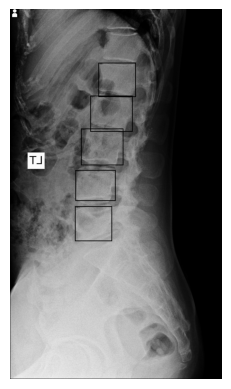

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

# 바운딩 박스를 그리는 함수 (정규화된 좌표 -> 실제 이미지 크기 변환)
def draw_bounding_boxes(image_path, bounding_boxes):
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)
    image_width, image_height = image.size

    for box in bounding_boxes:
        class_id, x_center, y_center, width, height = map(float, box.split()[:5])

        # 정규화된 YOLO 형식 좌표를 실제 이미지 크기로 변환
        x_min = (x_center - width / 2) * image_width
        y_min = (y_center - height / 2) * image_height
        x_max = (x_center + width / 2) * image_width
        y_max = (y_center + height / 2) * image_height
        # 바운딩 박스 그리기
        draw.rectangle([x_min, y_min, x_max, y_max], outline="black", width=5)
        draw.text((x_min, y_min), f"Class {int(class_id)}", fill="black")  # 클래스 ID 표시
    return image

# 한 이미지의 바운딩 박스를 시각화
index_to_visualize = 0  # 원하는 인덱스의 이미지를 선택
row = la_df.iloc[index_to_visualize]
image_path = row['image_path']

# YOLO 형식의 라벨 파일 읽기
label_path = os.path.join(label_dir, f"{row['filename']}.txt")
with open(label_path, 'r') as f:
    bounding_boxes = f.readlines()

# 바운딩 박스가 그려진 이미지 보여주기
image_with_boxes = draw_bounding_boxes(image_path, bounding_boxes)
plt.imshow(image_with_boxes,cmap="gray")
plt.axis('off')
plt.show()

In [ ]:
import shutil
import os

# 이미지와 라벨 파일을 train, val, test 디렉토리로 이동하는 함수
def move_files(row, image_base_dir, label_base_dir):
    # 이미지 경로 설정
    image_source = row['image_path']  # 원본 이미지 경로

    # 라벨 파일 경로 설정 (image_path에서 filename만 추출하여 label 디렉토리에서 찾음)
    label_source = os.path.join(label_base_dir, os.path.basename(image_source).replace('.jpg', '.txt'))

    # 이동할 경로 설정
    split = row['split'].lower()  # split 값을 소문자로 변환 ('Train', 'Val', 'Test' → 'train', 'val', 'test')

    # 'valid' 대신 'val'로 변경하도록 검사
    if split == 'valid':
        split = 'val'

    image_dest = f"{image_base_dir}/{split}/{os.path.basename(image_source)}"
    label_dest = f"{label_base_dir}/{split}/{os.path.basename(label_source)}"

    # 이미지와 라벨 파일을 해당 디렉토리로 복사 (라벨 파일이 있는 경우에만 복사)
    shutil.copy(image_source, image_dest)
    if os.path.exists(label_source):  # 라벨 파일이 있는지 확인
        shutil.copy(label_source, label_dest)
        print(f"Copied {image_source} and {label_source} to {split} folder")
    else:
        print(f"Label file not found for {image_source}")

# 각 row에 대해 파일 이동 실행
merged_df.apply(lambda row: move_files(row, image_base_dir, label_base_dir), axis=1)

Copied /content/spine_data_400/BUU-LSPINE_400/LA/0001-F-037Y1.jpg and /content/spine_data_400/labels/0001-F-037Y1.txt to test folder
Copied /content/spine_data_400/BUU-LSPINE_400/LA/0003-F-013Y1.jpg and /content/spine_data_400/labels/0003-F-013Y1.txt to train folder
Copied /content/spine_data_400/BUU-LSPINE_400/LA/0004-F-010Y1.jpg and /content/spine_data_400/labels/0004-F-010Y1.txt to test folder
Copied /content/spine_data_400/BUU-LSPINE_400/LA/0005-F-025Y1.jpg and /content/spine_data_400/labels/0005-F-025Y1.txt to train folder
Copied /content/spine_data_400/BUU-LSPINE_400/LA/0006-F-031Y1.jpg and /content/spine_data_400/labels/0006-F-031Y1.txt to train folder
Copied /content/spine_data_400/BUU-LSPINE_400/LA/0007-F-006Y1.jpg and /content/spine_data_400/labels/0007-F-006Y1.txt to val folder
Copied /content/spine_data_400/BUU-LSPINE_400/LA/0008-M-022Y1.jpg and /content/spine_data_400/labels/0008-M-022Y1.txt to test folder
Copied /content/spine_data_400/BUU-LSPINE_400/LA/0009-F-038Y1.jpg a

,0
0,None
1,None
2,None
3,None
4,None
...,...
395,None
396,None
397,None
398,None


## data.yaml 파일 생성

In [ ]:
import yaml

# data.yaml 파일을 저장할 경로
yaml_path = "/content/spine_data_400/data.yaml"

# YAML 파일의 내용을 구성
data = {
    'train': '/content/spine_data_400/images/train',  # 학습 이미지 경로
    'val': '/content/spine_data_400/images/val',      # 검증 이미지 경로
    'test': '/content/spine_data_400/images/test',    # 테스트 이미지 경로 (선택 사항)
    'nc': 5,  # 클래스 개수 (요추 1번 ~ 5번)
    'names': ['L1', 'L2', 'L3', 'L4', 'L5']  # 클래스 이름
}

# YAML 파일 저장
with open(yaml_path, 'w') as file:
    yaml.dump(data, file, default_flow_style=False)

## 데이터 학습

In [ ]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.5/882.5 kB 40.5 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

# YOLOv8 모델 로드
model = YOLO("yolov8s.pt")  # 'yolov8s.pt'는 small 모델. 더 큰 모델은 yolov8m, yolov8l, yolov8x도 사용 가능

# 모델 학습 시작
model.train(
    data="/content/spine_data_400/data.yaml",  # data.yaml 경로
    epochs= 1,
    imgsz=640,
    batch=16,
    name='spine_detection',  # 학습 결과 디렉토리 이름
    device='cpu'
)

Ultralytics 8.3.7 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/spine_data_400/data.yaml, epochs=1, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=spine_detection, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True,

100%|██████████| 755k/755k [00:00<00:00, 10.9MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

train: Scanning /content/spine_data_400/labels/train... 240 images, 0 backgrounds, 0 corrupt: 100%|██████████| 240/240 [00:00<00:00, 749.24it/s]

train: New cache created: /content/spine_data_400/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.17 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/spine_data_400/labels/val... 79 images, 0 backgrounds, 0 corrupt: 100%|██████████| 79/79 [00:00<00:00, 1492.24it/s]

val: New cache created: /content/spine_data_400/labels/val.cache


Plotting labels to runs/detect/spine_detection/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/spine_detection
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G      2.233      4.579      1.831        113        640:   7%|▋         | 1/15 [01:05<15:12, 65.19s/it]

In [ ]:
from ultralytics import YOLO

# model = YOLO('/content/drive/MyDrive/YOLO weight/best (1).pt')
# model = YOLO('/content/drive/MyDrive/YOLO weight/val/best.pt')
# model = YOLO('/content/drive/MyDrive/YOLO weight/9.23 val/best.pt')
model = YOLO('/content/drive/MyDrive/yolo v8 weight/yolo_la.pt')


# fine-tuning
model.train(
    data="/content/spine_data_400/data.yaml",
    epochs=2,
    imgsz=640,
    batch=16,
    name='spine_detection_finetuned',  # 추가 학습 결과 저장할 디렉토리 이름
    device='cpu'
)

Ultralytics 8.3.6 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/yolo v8 weight/yolo_la.pt, data=/content/spine_data_400/data.yaml, epochs=2, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=spine_detection_finetuned, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, sa

train: Scanning /content/spine_data_400/labels/train.cache... 240 images, 0 backgrounds, 0 corrupt: 100%|██████████| 240/240 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/spine_data_400/labels/val.cache... 79 images, 0 backgrounds, 0 corrupt: 100%|██████████| 79/79 [00:00<?, ?it/s]

Plotting labels to runs/detect/spine_detection_finetuned/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/spine_detection_finetuned
Starting training for 2 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/2         0G      0.444     0.2963     0.8429        141        640: 100%|██████████| 15/15 [01:38<00:00,  6.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.61s/it]

                   all         79        395      0.957      0.947      0.968      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/2         0G     0.4412     0.3001      0.836        170        640: 100%|██████████| 15/15 [01:28<00:00,  5.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.64s/it]

                   all         79        395      0.952      0.946      0.973       0.85



2 epochs completed in 0.060 hours.
Optimizer stripped from runs/detect/spine_detection_finetuned/weights/last.pt, 19.9MB
Optimizer stripped from runs/detect/spine_detection_finetuned/weights/best.pt, 19.9MB

Validating runs/detect/spine_detection_finetuned/weights/best.pt...
Ultralytics 8.3.6 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 186 layers, 9,829,599 parameters, 0 gradients, 23.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.46s/it]


                   all         79        395      0.952      0.946      0.973      0.849
                    L1         79         79      0.946      0.884      0.943      0.786
                    L2         79         79       0.95      0.969      0.974      0.859
                    L3         79         79      0.945      0.949      0.972      0.862
                    L4         79         79      0.962      0.966      0.984      0.884
                    L5         79         79      0.955      0.962       0.99      0.855
Speed: 0.5ms preprocess, 91.7ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/spine_detection_finetuned


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x781f53726b30>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

In [ ]:
from ultralytics import YOLO

# YOLO 모델 불러오기
model = YOLO('/content/drive/MyDrive/yolo v8 weight/yolo_la.pt')  # 사전 학습된 YOLOv8n 모델 불러오기

# 데이터셋 경로 및 설정
data_yaml = "/content/spine_data_400/data.yaml"  # 사용자 데이터셋 경로

# 모델 학습
model.train(
    data=data_yaml,  # 사용자 데이터 설정
    epochs=50,  # 학습 epoch 수
    imgsz=640,  # 이미지 크기
    batch=16,  # 배치 크기
    name='spine_corner_detection',  # 학습 결과 저장 디렉토리
    device='cuda'  # GPU 사용
)

# 학습 후 저장된 모델로 추론 수행
results = model.predict("/content/drive/MyDrive/LA/0001-F-037Y1.jpg")

# 결과 확인 (네 모서리 좌표를 예측하게 되어 있음)
for result in results:
    print(f"예측 결과: {result.boxes.xyxy}")  # 네 모서리 좌표 출력


Ultralytics 8.3.8 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/yolo v8 weight/yolo_la.pt, data=/content/spine_data_400/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=spine_corner_detection3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, sav

train: Scanning /content/spine_data_400/labels/train.cache... 240 images, 0 backgrounds, 0 corrupt: 100%|██████████| 240/240 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/spine_data_400/labels/val.cache... 79 images, 0 backgrounds, 0 corrupt: 100%|██████████| 79/79 [00:00<?, ?it/s]


Plotting labels to runs/detect/spine_corner_detection3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/spine_corner_detection3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.22G     0.4562      0.321     0.8466        134        640: 100%|██████████| 15/15 [00:02<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.38it/s]

                   all         79        395       0.95      0.938      0.978      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50       4.1G     0.4471     0.3131     0.8358        145        640: 100%|██████████| 15/15 [00:01<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.68it/s]

                   all         79        395       0.95      0.934      0.968      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.13G     0.4603     0.3301     0.8435        137        640: 100%|██████████| 15/15 [00:01<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.05it/s]

                   all         79        395      0.916      0.948      0.959      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.09G     0.4749     0.3407     0.8496        120        640: 100%|██████████| 15/15 [00:01<00:00,  8.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.07it/s]

                   all         79        395      0.939      0.944      0.965      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.27G     0.4759     0.3552     0.8511        150        640: 100%|██████████| 15/15 [00:01<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.07it/s]

                   all         79        395      0.933      0.949      0.974      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.27G      0.508     0.3707     0.8507        153        640: 100%|██████████| 15/15 [00:01<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.78it/s]

                   all         79        395      0.911       0.93      0.957      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.11G     0.5064     0.3876     0.8497        120        640: 100%|██████████| 15/15 [00:01<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.44it/s]

                   all         79        395      0.904      0.944      0.965      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.13G     0.5119     0.3739     0.8546        143        640: 100%|██████████| 15/15 [00:01<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.67it/s]

                   all         79        395      0.909      0.904      0.942       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.11G     0.5157     0.3963      0.867        126        640: 100%|██████████| 15/15 [00:01<00:00,  8.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.75it/s]

                   all         79        395      0.937      0.927      0.965      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.13G     0.5244     0.3897     0.8582        117        640: 100%|██████████| 15/15 [00:01<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.08it/s]

                   all         79        395      0.934      0.929      0.956      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.13G     0.5005     0.3801     0.8563        154        640: 100%|██████████| 15/15 [00:01<00:00,  8.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.93it/s]

                   all         79        395      0.924      0.906      0.931      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.13G     0.4931     0.3801     0.8536        147        640: 100%|██████████| 15/15 [00:01<00:00,  8.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.11it/s]

                   all         79        395      0.921      0.947      0.944      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.27G     0.5061     0.3862      0.855        134        640: 100%|██████████| 15/15 [00:01<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.52it/s]

                   all         79        395      0.939      0.917       0.96      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.15G     0.5187     0.3848      0.863        153        640: 100%|██████████| 15/15 [00:01<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.64it/s]

                   all         79        395      0.924      0.881      0.943      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.14G     0.5075     0.3814     0.8648        152        640: 100%|██████████| 15/15 [00:01<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.49it/s]

                   all         79        395      0.941       0.89      0.943      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.13G        0.5     0.3634     0.8668        143        640: 100%|██████████| 15/15 [00:01<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.99it/s]

                   all         79        395      0.931      0.959      0.956      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       4.1G     0.4884     0.3608     0.8613        141        640: 100%|██████████| 15/15 [00:01<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.10it/s]

                   all         79        395      0.935      0.948      0.956      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.17G     0.5084     0.3467     0.8581        154        640: 100%|██████████| 15/15 [00:01<00:00,  8.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.20it/s]

                   all         79        395      0.884      0.949      0.953      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.16G     0.4805     0.3509     0.8526        123        640: 100%|██████████| 15/15 [00:01<00:00,  8.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.76it/s]

                   all         79        395      0.944      0.957      0.954      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.16G     0.4855     0.3335     0.8473        168        640: 100%|██████████| 15/15 [00:01<00:00,  8.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.11it/s]

                   all         79        395      0.935      0.938      0.954      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.31G     0.4948      0.347     0.8595        107        640: 100%|██████████| 15/15 [00:01<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.96it/s]

                   all         79        395      0.957      0.947      0.955      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.16G     0.4684     0.3271     0.8487        129        640: 100%|██████████| 15/15 [00:01<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.77it/s]

                   all         79        395      0.944      0.962       0.97      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.12G     0.4633     0.3336     0.8605        123        640: 100%|██████████| 15/15 [00:01<00:00,  9.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.50it/s]

                   all         79        395      0.949      0.967      0.966      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.13G      0.474     0.3386     0.8551        142        640: 100%|██████████| 15/15 [00:01<00:00,  9.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.83it/s]

                   all         79        395      0.956      0.948      0.963      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.31G     0.4626      0.331      0.844        137        640: 100%|██████████| 15/15 [00:01<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.72it/s]

                   all         79        395      0.931      0.953      0.954      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.16G     0.4561     0.3239     0.8451        170        640: 100%|██████████| 15/15 [00:01<00:00,  8.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.21it/s]

                   all         79        395      0.936      0.943      0.959      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.13G     0.4604     0.3229     0.8515        119        640: 100%|██████████| 15/15 [00:01<00:00,  8.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.25it/s]

                   all         79        395      0.924       0.93       0.96      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.14G     0.4386     0.3019     0.8441        127        640: 100%|██████████| 15/15 [00:01<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.03it/s]

                   all         79        395      0.907      0.915      0.945      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.27G     0.4431     0.3042     0.8397        159        640: 100%|██████████| 15/15 [00:01<00:00,  9.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.19it/s]

                   all         79        395      0.919      0.919      0.956      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.14G     0.4493     0.3111     0.8445        132        640: 100%|██████████| 15/15 [00:01<00:00,  8.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.27it/s]

                   all         79        395       0.92      0.936      0.962      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.17G     0.4351     0.2955     0.8426         91        640: 100%|██████████| 15/15 [00:01<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.20it/s]

                   all         79        395      0.926      0.953      0.969      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.14G     0.4359     0.2996     0.8399        147        640: 100%|██████████| 15/15 [00:01<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.46it/s]

                   all         79        395      0.925      0.946      0.964      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.27G     0.4319      0.288     0.8404        143        640: 100%|██████████| 15/15 [00:01<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.34it/s]

                   all         79        395      0.915      0.938       0.96      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.13G     0.4186     0.2954     0.8356        131        640: 100%|██████████| 15/15 [00:01<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.23it/s]

                   all         79        395      0.923      0.936      0.958      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.12G     0.4362     0.3052     0.8411        134        640: 100%|██████████| 15/15 [00:01<00:00,  8.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.94it/s]

                   all         79        395      0.933      0.952      0.962      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.13G     0.4263     0.2956      0.845        150        640: 100%|██████████| 15/15 [00:01<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.18it/s]

                   all         79        395      0.905      0.924       0.96      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.31G     0.4241     0.2901     0.8294        141        640: 100%|██████████| 15/15 [00:01<00:00,  9.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.21it/s]

                   all         79        395      0.903      0.921      0.966      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.16G     0.4305     0.2929     0.8376        125        640: 100%|██████████| 15/15 [00:01<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.94it/s]

                   all         79        395      0.946      0.954      0.962      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.13G     0.4144     0.2878     0.8457        148        640: 100%|██████████| 15/15 [00:01<00:00,  9.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.49it/s]

                   all         79        395       0.95      0.956      0.957      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.12G     0.4192     0.2853     0.8378         92        640: 100%|██████████| 15/15 [00:01<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.05it/s]

                   all         79        395      0.953      0.953      0.958      0.839


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.26G      0.402     0.2587     0.8233         79        640: 100%|██████████| 15/15 [00:03<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.59it/s]

                   all         79        395      0.961      0.953       0.97      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.12G     0.3969     0.2591      0.825         80        640: 100%|██████████| 15/15 [00:01<00:00,  8.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.74it/s]

                   all         79        395      0.956      0.954       0.96      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.11G     0.3785     0.2447      0.821         80        640: 100%|██████████| 15/15 [00:01<00:00,  8.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.44it/s]

                   all         79        395      0.959       0.95      0.954      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.12G     0.3861     0.2499     0.8184         79        640: 100%|██████████| 15/15 [00:01<00:00,  8.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.11it/s]

                   all         79        395      0.951      0.949      0.956      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.26G     0.3679      0.234     0.8187         79        640: 100%|██████████| 15/15 [00:01<00:00,  9.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.17it/s]

                   all         79        395      0.959      0.943       0.96      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.12G     0.3713     0.2299     0.8197         80        640: 100%|██████████| 15/15 [00:01<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.39it/s]

                   all         79        395      0.959      0.947      0.964      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.12G     0.3697       0.23     0.8141         80        640: 100%|██████████| 15/15 [00:01<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.89it/s]

                   all         79        395      0.961       0.95      0.965      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.12G     0.3596     0.2246     0.8118         79        640: 100%|██████████| 15/15 [00:01<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.73it/s]

                   all         79        395      0.961      0.947      0.964      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       4.1G     0.3607     0.2248      0.813         79        640: 100%|██████████| 15/15 [00:01<00:00,  8.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.72it/s]

                   all         79        395       0.96      0.946      0.964      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      4.11G     0.3501     0.2213     0.8153         79        640: 100%|██████████| 15/15 [00:01<00:00,  8.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.48it/s]

                   all         79        395      0.955      0.952      0.964      0.847



50 epochs completed in 0.070 hours.
Optimizer stripped from runs/detect/spine_corner_detection3/weights/last.pt, 19.9MB
Optimizer stripped from runs/detect/spine_corner_detection3/weights/best.pt, 19.9MB

Validating runs/detect/spine_corner_detection3/weights/best.pt...
Ultralytics 8.3.8 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 186 layers, 9,829,599 parameters, 0 gradients, 23.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.65it/s]


                   all         79        395       0.95      0.938      0.977      0.853
                    L1         79         79      0.941      0.886      0.958      0.803
                    L2         79         79      0.932      0.949      0.981      0.869
                    L3         79         79      0.961      0.929       0.98      0.866
                    L4         79         79       0.96      0.962       0.98      0.871
                    L5         79         79      0.958      0.962      0.989      0.859
Speed: 0.1ms preprocess, 0.9ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/spine_corner_detection3

image 1/1 /content/drive/MyDrive/LA/0001-F-037Y1.jpg: 640x384 1 L1, 1 L2, 1 L3, 1 L4, 1 L5, 54.6ms
Speed: 2.4ms preprocess, 54.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 384)
예측 결과: tensor([[ 528.8029,  568.2106,  794.4282,  797.1730],
        [ 424.0073, 1297.8905,  680.6503, 1525.8956],
        [ 428.2783,

In [ ]:
from ultralytics import YOLO

# YOLO 모델 불러오기 (Corner Points 예측을 위한 가중치 파일 설정)
model = YOLO('/content/drive/MyDrive/yolo v8 weight/yolo_la.pt')

# Corner Point 데이터셋 설정 (각 좌표에 대해 4개 코너 포인트를 포함하도록 준비됨)
data_yaml = "/content/spine_data_400/data.yaml"

# 모델 학습 설정
model.train(
    data=data_yaml,  # 네 모서리 좌표를 포함한 데이터셋 설정
    epochs=50,  # 학습 epoch 수
    imgsz=640,  # 이미지 크기 설정
    batch=16,  # 배치 크기 설정
    name='spine_corner_detection',  # 학습 결과 저장 디렉토리 이름
    device='cuda'  # GPU 사용
)

# 학습 후 예측 수행
results = model.predict("/content/drive/MyDrive/LA/0001-F-037Y1.jpg")

# 결과 확인 (네 모서리 좌표 예측)
for result in results:
    print(f"예측된 네 모서리 좌표: {result.keypoints.xyxy}")  # 네 모서리 좌표 출력


Ultralytics 8.3.8 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/yolo v8 weight/yolo_la.pt, data=/content/spine_data_400/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=spine_corner_detection4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, sav

train: Scanning /content/spine_data_400/labels/train.cache... 240 images, 0 backgrounds, 0 corrupt: 100%|██████████| 240/240 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/spine_data_400/labels/val.cache... 79 images, 0 backgrounds, 0 corrupt: 100%|██████████| 79/79 [00:00<?, ?it/s]


Plotting labels to runs/detect/spine_corner_detection4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7d13e18cd090>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1441, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/usr/lib/python3.10/multiprocessing/process.py", line 149, in join
    res = self._popen.wait(timeout)
  File "/usr/lib/python3.10/multiprocessing/popen_fork.py", line 40, in wait
    if not wait([self.sentinel], timeout):
  File "/usr/lib/python3.10/multiprocessing/connection.py", line 931, in wait
    ready = selector.select(timeout)
  File "/usr/lib/python3.10/selectors.py", line 416, in select
    fd_event_list = self._selector.poll(timeout)
KeyboardInterrupt: 


TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/spine_corner_detection4
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.23G     0.4562      0.321     0.8466        134        640: 100%|██████████| 15/15 [00:02<00:00,  7.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.88it/s]

                   all         79        395       0.95      0.938      0.978      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.05G     0.4165     0.2984     0.8215        137        640:   7%|▋         | 1/15 [00:05<01:11,  5.13s/it]


RuntimeError: DataLoader worker (pid(s) 10860, 10861, 10862, 10863, 10864, 10865, 10866, 10871) exited unexpectedly

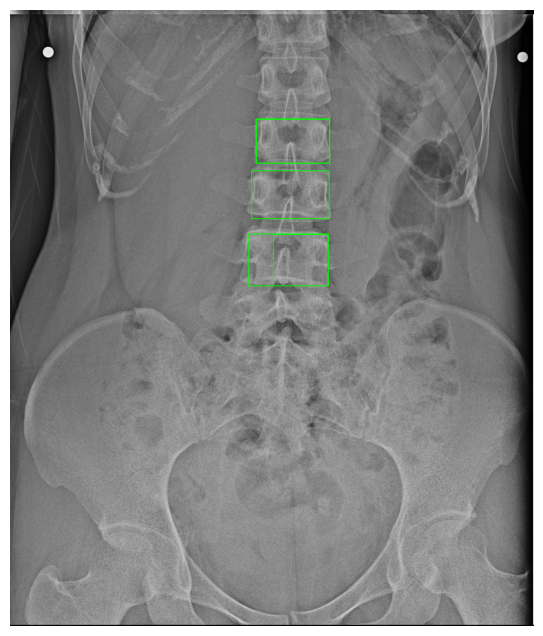

In [ ]:
import cv2
import matplotlib.pyplot as plt
import torch

# 주어진 좌표들 (Tensor 형태)
boxes = torch.tensor([[ 528.8029,  568.2106,  794.4282,  797.1730],
        [ 424.0073, 1297.8905,  680.6503, 1525.8956],
        [ 428.2783, 1054.1624,  686.0840, 1256.5944],
        [ 468.2718,  795.9849,  742.7100, 1027.9960],
        [ 581.0571,  356.4617,  831.6699,  571.9000]])

# 이미지 경로
image_path = "/content/drive/MyDrive/LA/0001-F-037Y1.jpg"

# 이미지 불러오기
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# 박스 좌표 그리기
for box in boxes:
    x_min, y_min, x_max, y_max = map(int, box.tolist())  # 좌표 정수형 변환
    # 직사각형 그리기 (좌측 상단 모서리부터 우측 하단 모서리까지)
    cv2.rectangle(image_rgb, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)

# 시각화
plt.figure(figsize=(8, 8))
plt.imshow(image_rgb)
plt.axis('off')
plt.show()


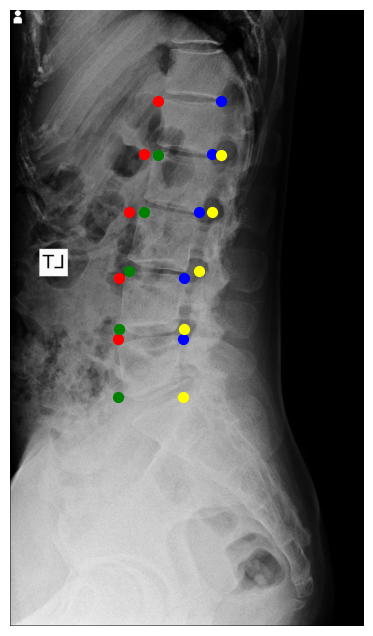

In [ ]:
import torch
import cv2
import matplotlib.pyplot as plt

# 주어진 좌표 (tensor 형식)
coordinates = torch.tensor([[ 528.8029,  568.2106,  794.4282,  797.1730],
        [ 424.0073, 1297.8905,  680.6503, 1525.8956],
        [ 428.2783, 1054.1624,  686.0840, 1256.5944],
        [ 468.2718,  795.9849,  742.7100, 1027.9960],
        [ 581.0571,  356.4617,  831.6699,  571.9000]])

# 이미지 경로 (사용할 이미지 설정)
image_path = "/content/drive/MyDrive/LA/0001-F-037Y1.jpg"

# 이미지 로드
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # OpenCV는 기본적으로 BGR로 로드하므로, RGB로 변환

# 점 찍기
plt.figure(figsize=(8, 8))
plt.imshow(image_rgb)

# 각 좌표에 대해 점을 찍음
for coord in coordinates:
    # 각 좌표에 대한 4개의 점 (x_min, y_min), (x_max, y_min), (x_min, y_max), (x_max, y_max)
    x_min, y_min, x_max, y_max = coord

    # 네 모서리 점들을 이미지에 표시
    plt.scatter(x_min, y_min, color='red', s=50)  # 좌측 상단
    plt.scatter(x_max, y_min, color='blue', s=50)  # 우측 상단
    plt.scatter(x_min, y_max, color='green', s=50)  # 좌측 하단
    plt.scatter(x_max, y_max, color='yellow', s=50)  # 우측 하단

# 이미지 출력
plt.axis('off')
plt.show()


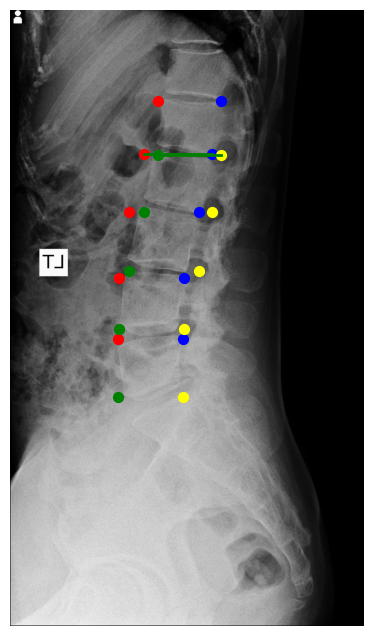

첫 번째 박스 상단과 마지막 박스 하단 사이의 각도: 0.00도


In [ ]:
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np

# 주어진 좌표 (tensor 형식)
coordinates = torch.tensor([[528.8029, 568.2106, 794.4282, 797.1730],
                            [424.0073, 1297.8905, 680.6503, 1525.8956],
                            [428.2783, 1054.1624, 686.0840, 1256.5944],
                            [468.2718, 795.9849, 742.7100, 1027.9960],
                            [581.0571, 356.4617, 831.6699, 571.9000]])

# 이미지 경로 (사용할 이미지 설정)
image_path = "/content/drive/MyDrive/LA/0001-F-037Y1.jpg"

# 이미지 로드
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # OpenCV는 기본적으로 BGR로 로드하므로, RGB로 변환

# 점 찍기
plt.figure(figsize=(8, 8))
plt.imshow(image_rgb)

# 각 좌표에 대해 점을 찍음
for coord in coordinates:
    # 각 좌표에 대한 4개의 점 (x_min, y_min), (x_max, y_min), (x_min, y_max), (x_max, y_max)
    x_min, y_min, x_max, y_max = coord

    # 네 모서리 점들을 이미지에 표시
    plt.scatter(x_min, y_min, color='red', s=50)  # 좌측 상단
    plt.scatter(x_max, y_min, color='blue', s=50)  # 우측 상단
    plt.scatter(x_min, y_max, color='green', s=50)  # 좌측 하단
    plt.scatter(x_max, y_max, color='yellow', s=50)  # 우측 하단

# 직선 그리기: 상단 두 점(좌측 상단, 우측 상단)과 하단 두 점(좌측 하단, 우측 하단)을 연결
def draw_line(x1, y1, x2, y2, color):
    plt.plot([x1, x2], [y1, y2], color=color, linewidth=2)

# 첫 번째 박스의 상단 직선
x_min1, y_min1, x_max1, y_max1 = coordinates[0]
draw_line(x_min1, y_min1, x_max1, y_min1, 'green')

# 마지막 박스의 하단 직선
x_min5, y_min5, x_max5, y_max5 = coordinates[-1]
draw_line(x_min5, y_max5, x_max5, y_max5, 'green')

# 이미지 출력
plt.axis('off')
plt.show()

# 두 직선의 각도를 계산하는 함수
def calculate_angle(x1, y1, x2, y2, x3, y3, x4, y4):
    # 두 직선의 기울기 계산
    slope1 = (y2 - y1) / (x2 - x1) if x2 != x1 else np.inf  # 첫 번째 직선 기울기
    slope2 = (y4 - y3) / (x4 - x3) if x4 != x3 else np.inf  # 두 번째 직선 기울기

    # 두 직선의 기울기를 이용해 각도 계산
    if np.isinf(slope1) or np.isinf(slope2):  # 수직선이 있으면 각도는 90도로 처리
        return 90.0

    angle_radians = np.arctan(abs((slope2 - slope1) / (1 + slope1 * slope2)))
    angle_degrees = np.degrees(angle_radians)
    return angle_degrees

# 첫 번째 박스와 마지막 박스의 상단, 하단 좌표를 이용한 각도 계산
angle = calculate_angle(x_min1, y_min1, x_max1, y_min1, x_min5, y_max5, x_max5, y_max5)
print(f"첫 번째 박스 상단과 마지막 박스 하단 사이의 각도: {angle:.2f}도")


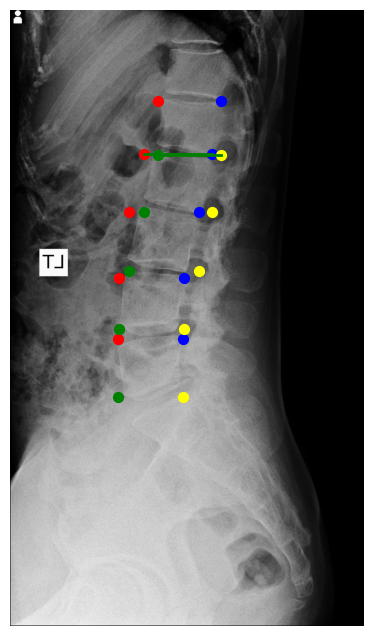

첫 번째 박스 상단과 마지막 박스 하단 사이의 각도: 0.00도


In [ ]:
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np

# 주어진 좌표 (tensor 형식)
coordinates = torch.tensor([[528.8029, 568.2106, 794.4282, 797.1730],
                            [424.0073, 1297.8905, 680.6503, 1525.8956],
                            [428.2783, 1054.1624, 686.0840, 1256.5944],
                            [468.2718, 795.9849, 742.7100, 1027.9960],
                            [581.0571, 356.4617, 831.6699, 571.9000]])

# 이미지 경로 (사용할 이미지 설정)
image_path = "/content/drive/MyDrive/LA/0001-F-037Y1.jpg"

# 이미지 로드
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # OpenCV는 기본적으로 BGR로 로드하므로, RGB로 변환

# 점 찍기
plt.figure(figsize=(8, 8))
plt.imshow(image_rgb)

# 각 좌표에 대해 점을 찍음
for coord in coordinates:
    # 각 좌표에 대한 4개의 점 (x_min, y_min), (x_max, y_min), (x_min, y_max), (x_max, y_max)
    x_min, y_min, x_max, y_max = coord

    # 네 모서리 점들을 이미지에 표시
    plt.scatter(x_min, y_min, color='red', s=50)  # 좌측 상단
    plt.scatter(x_max, y_min, color='blue', s=50)  # 우측 상단
    plt.scatter(x_min, y_max, color='green', s=50)  # 좌측 하단
    plt.scatter(x_max, y_max, color='yellow', s=50)  # 우측 하단

# 직선 그리기: 첫 번째 박스의 상단 두 점(좌측 상단, 우측 상단)과 마지막 박스의 하단 두 점(좌측 하단, 우측 하단)을 연결
def draw_line(x1, y1, x2, y2, color):
    plt.plot([x1, x2], [y1, y2], color=color, linewidth=2)

# 첫 번째 박스의 상단 직선 (좌측 상단, 우측 상단)
x_min1, y_min1, x_max1, y_max1 = coordinates[0]
draw_line(x_min1, y_min1, x_max1, y_min1, 'green')  # 첫 번째 박스 상단 직선

# 마지막 박스의 하단 직선 (좌측 하단, 우측 하단)
x_min5, y_min5, x_max5, y_max5 = coordinates[-1]
draw_line(x_min5, y_max5, x_max5, y_max5, 'green')  # 마지막 박스 하단 직선

# 이미지 출력
plt.axis('off')
plt.show()

# 두 직선의 각도를 계산하는 함수
def calculate_angle(x1, y1, x2, y2, x3, y3, x4, y4):
    # 두 직선의 기울기 계산
    slope1 = (y2 - y1) / (x2 - x1) if x2 != x1 else np.inf  # 첫 번째 직선 기울기
    slope2 = (y4 - y3) / (x4 - x3) if x4 != x3 else np.inf  # 두 번째 직선 기울기

    # 두 직선의 기울기를 이용해 각도 계산
    if np.isinf(slope1) or np.isinf(slope2):  # 수직선이 있으면 각도는 90도로 처리
        return 90.0

    angle_radians = np.arctan(abs((slope2 - slope1) / (1 + slope1 * slope2)))
    angle_degrees = np.degrees(angle_radians)
    return angle_degrees

# 첫 번째 박스 상단 직선과 마지막 박스 하단 직선 사이의 각도 계산
angle = calculate_angle(x_min1, y_min1, x_max1, y_min1, x_min5, y_max5, x_max5, y_max5)
print(f"첫 번째 박스 상단과 마지막 박스 하단 사이의 각도: {angle:.2f}도")


### Loss 확인

In [ ]:
# YOLOv8 학습 결과 파일 경로 설정
results_path = '/content/runs/detect/spine_detection_finetuned/results.csv'

# 결과 파일 불러오기
results_df = pd.read_csv(results_path)

# 파일의 컬럼 이름 확인
print(results_df.columns)

Index(['                  epoch', '         train/box_loss',
       '         train/cls_loss', '         train/dfl_loss',
       '   metrics/precision(B)', '      metrics/recall(B)',
       '       metrics/mAP50(B)', '    metrics/mAP50-95(B)',
       '           val/box_loss', '           val/cls_loss',
       '           val/dfl_loss', '                 lr/pg0',
       '                 lr/pg1', '                 lr/pg2'],
      dtype='object')


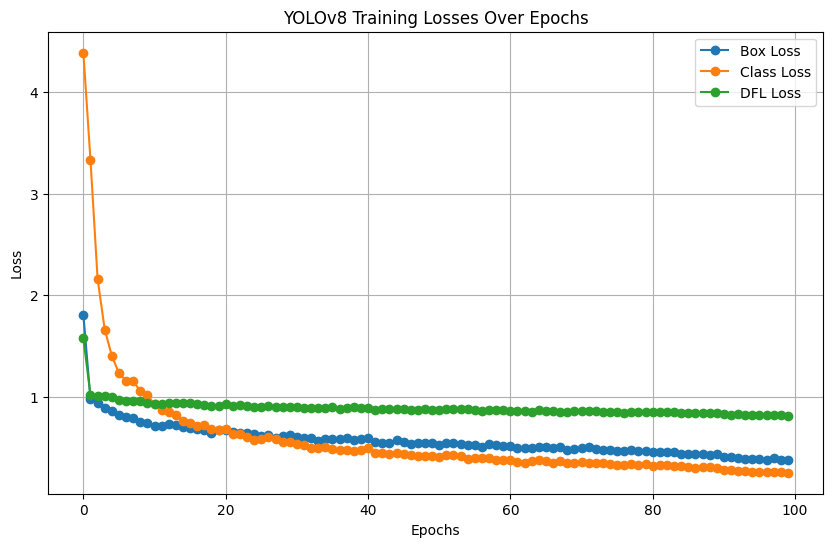

In [ ]:
# 필요한 손실 값 추출 (train/box_loss, train/cls_loss, train/dfl_loss)
epochs = results_df.index
box_loss = results_df['         train/box_loss']
cls_loss = results_df['         train/cls_loss']
dfl_loss = results_df['         train/dfl_loss']

# 손실 값 시각화
plt.figure(figsize=(10, 6))
plt.plot(epochs, box_loss, label="Box Loss", marker='o')
plt.plot(epochs, cls_loss, label="Class Loss", marker='o')
plt.plot(epochs, dfl_loss, label="DFL Loss", marker='o')

plt.title("YOLOv8 Training Losses Over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

# 모델 검증

In [ ]:
model = YOLO("/content/drive/MyDrive/yolo v8 weight/yolo_la.pt")

results = model.val(
    data="/content/spine_data_400/data.yaml",  # data.yaml 경로
    imgsz=640,  # 이미지 크기
    batch=16,
    split='val',
    save=True  # 결과를 저장
)

Ultralytics 8.3.6 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 186 layers, 9,829,599 parameters, 0 gradients, 23.4 GFLOPs


val: Scanning /content/spine_data_400/labels/val.cache... 79 images, 0 backgrounds, 0 corrupt: 100%|██████████| 79/79 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.67it/s]


                   all         79        395      0.952      0.953      0.977      0.857
                    L1         79         79      0.933      0.885      0.961      0.811
                    L2         79         79      0.955      0.962       0.98       0.87
                    L3         79         79       0.95      0.969      0.969      0.859
                    L4         79         79      0.957      0.962      0.983      0.883
                    L5         79         79      0.963      0.985      0.992      0.864
Speed: 0.1ms preprocess, 5.7ms inference, 0.0ms loss, 4.3ms postprocess per image
Results saved to runs/detect/val


### mAP 시각화

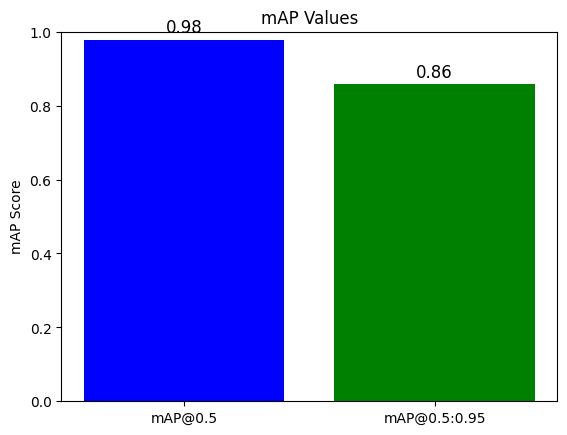

In [ ]:
import matplotlib.pyplot as plt

# 모델 검증 결과에서 mAP 값 추출
# YOLOv8에서는 일반적으로 mAP 값이 results['metrics']에서 제공됩니다.
mAP_50 = results.box.map50  # mAP@0.5
mAP_50_95 = results.box.map  # mAP@0.5:0.95

# mAP 값을 시각화
labels = ['mAP@0.5', 'mAP@0.5:0.95']
values = [mAP_50, mAP_50_95]

plt.bar(labels, values, color=['blue', 'green'])
plt.title('mAP Values')
plt.ylabel('mAP Score')
plt.ylim(0, 1)  # mAP 값은 0~1 사이의 값이므로 이 범위로 설정

for i, v in enumerate(values):
    plt.text(i, v + 0.02, f'{v:.2f}', ha='center', fontsize=12)

plt.show()

## 모델 예측

In [ ]:
# 예측된 결과 저장 디렉토리 확인
print("Predictions saved in: runs/detect/predict")

In [ ]:
from ultralytics import YOLO

# 학습된 모델 로드 (best.pt 파일 사용)
model = YOLO("/content/drive/MyDrive/yolo v8 weight/yolo_la.pt")

# 전체 테스트 데이터 예측 (80장)
results = model.predict(source="/content/spine_data_400/images/test", save=True)


image 1/81 /content/spine_data_400/images/test/0001-F-037Y1.jpg: 640x384 1 L1, 1 L2, 1 L3, 1 L4, 1 L5, 489.7ms
image 2/81 /content/spine_data_400/images/test/0004-F-010Y1.jpg: 640x512 1 L1, 1 L2, 1 L3, 1 L4, 1 L5, 633.2ms
image 3/81 /content/spine_data_400/images/test/0008-M-022Y1.jpg: 640x512 1 L1, 1 L2, 1 L3, 1 L4, 1 L5, 391.5ms
image 4/81 /content/spine_data_400/images/test/0009-F-038Y1.jpg: 640x384 1 L1, 1 L2, 1 L3, 1 L4, 1 L5, 309.9ms
image 5/81 /content/spine_data_400/images/test/0011-F-063Y1.jpg: 640x352 1 L1, 2 L2s, 2 L3s, 1 L4, 1 L5, 273.0ms
image 6/81 /content/spine_data_400/images/test/0012-F-013Y1.jpg: 640x512 1 L1, 1 L2, 1 L3, 1 L4, 1 L5, 404.8ms
image 7/81 /content/spine_data_400/images/test/0015-M-020Y1.jpg: 640x384 1 L1, 2 L2s, 1 L3, 1 L4, 1 L5, 301.4ms
image 8/81 /content/spine_data_400/images/test/0016-F-023Y1.jpg: 640x544 1 L1, 1 L2, 1 L3, 1 L4, 1 L5, 416.4ms
image 9/81 /content/spine_data_400/images/test/0020-M-030Y1.jpg: 640x544 1 L1, 1 L2, 1 L3, 1 L4, 1 L5, 432.8

In [ ]:
import shutil
import os

# YOLOv8 결과 저장 디렉토리 경로
source_dir = "/content/runs/detect/predict"

# Google Drive에 저장할 디렉토리 경로
destination_dir = "/content/drive/MyDrive/YOLOv8_predictions-la_10/5"
os.makedirs(destination_dir, exist_ok=True)

# 이미지 파일들을 Google Drive로 복사
for filename in os.listdir(source_dir):
    file_path = os.path.join(source_dir, filename)
    if os.path.isfile(file_path):  # 파일이 존재하는 경우에만 복사
        shutil.copy(file_path, destination_dir)

print(f"모든 예측 이미지가 Google Drive의 {destination_dir}에 저장되었습니다.")

모든 예측 이미지가 Google Drive의 /content/drive/MyDrive/YOLOv8_predictions-la_10/5에 저장되었습니다.


## center point Distance

In [ ]:
from pathlib import Path

# 저장할 디렉토리 경로 설정 (detect의 predict 폴더)
save_dir = Path("/content/runs/detect/pred_labels/")
save_dir.mkdir(parents=True, exist_ok=True)  # 폴더가 없으면 생성

# 예측된 결과를 바탕으로 바운딩 박스 정보를 텍스트 파일로 저장
for result in results:
    image_name = Path(result.path).stem  # 이미지 파일명 (확장자 제거)
    label_path = save_dir / f"{image_name}.txt"  # 저장할 텍스트 파일 경로

    # 클래스별로 가장 높은 confidence를 저장할 딕셔너리 (클래스: 바운딩 박스 정보)
    best_boxes = {}

    for box in result.boxes:
        cls = int(box.cls)  # 클래스 정보
        xywh = box.xywh[0].tolist()  # 바운딩 박스 좌표 (x, y, w, h)
        conf = box.conf[0].item()  # 예측 확률

        # 현재 클래스에 저장된 바운딩 박스가 없거나, 더 높은 confidence를 가진 경우 업데이트
        if cls not in best_boxes or conf > best_boxes[cls]['conf']:
            best_boxes[cls] = {
                'xywh': xywh,
                'conf': conf
            }

    # 텍스트 파일에 클래스별로 가장 높은 confidence의 바운딩 박스 정보 저장
    with open(label_path, 'w') as f:
        for cls, box_info in best_boxes.items():
            xywh = box_info['xywh']
            conf = box_info['conf']

            # YOLO 형식으로 (class, x_center, y_center, width, height) 저장
            f.write(f"{cls} {xywh[0]} {xywh[1]} {xywh[2]} {xywh[3]} {conf}\n")

print("Label files saved successfully!")

Label files saved successfully!


In [ ]:
import pandas as pd
from pathlib import Path

# 저장할 디렉토리 경로 설정 (detect의 predict 폴더)
save_dir = Path("/content/runs/detect/pred_labels/")
save_dir.mkdir(parents=True, exist_ok=True)  # 폴더가 없으면 생성

# 리스트에 결과를 저장 (image_name, class, x_center, y_center, width, height, conf)
label_data = []

# 예측된 결과를 바탕으로 바운딩 박스 정보를 리스트에 저장
for result in results:
    image_name = Path(result.path).stem  # 이미지 파일명 (확장자 제거)

    # 클래스별로 가장 높은 confidence를 저장할 딕셔너리 (클래스: 바운딩 박스 정보)
    best_boxes = {}

    for box in result.boxes:
        cls = int(box.cls)  # 클래스 정보
        xywh = box.xywh[0].tolist()  # 바운딩 박스 좌표 (x, y, w, h)
        conf = box.conf[0].item()  # 예측 확률

        # 현재 클래스에 저장된 바운딩 박스가 없거나, 더 높은 confidence를 가진 경우 업데이트
        if cls not in best_boxes or conf > best_boxes[cls]['conf']:
            best_boxes[cls] = {
                'xywh': xywh,
                'conf': conf
            }

    # 클래스별로 가장 높은 confidence의 바운딩 박스 정보 저장
    for cls, box_info in best_boxes.items():
        xywh = box_info['xywh']
        conf = box_info['conf']

        # 리스트에 저장 (image_name, class, x_center, y_center, width, height, conf)
        label_data.append([image_name, cls, xywh[0], xywh[1], xywh[2], xywh[3], conf])

# 데이터프레임으로 변환
columns = ['image_name', 'class', 'x_center', 'y_center', 'width', 'height', 'confidence']
df = pd.DataFrame(label_data, columns=columns)

# CSV 파일로 저장
csv_path = save_dir / 'predicted_labels.csv'
df.to_csv(csv_path, index=False)

print(f"Label data saved to {csv_path}")

Label data saved to /content/runs/detect/pred_labels/predicted_labels.csv


In [ ]:
import pandas as pd
from PIL import Image
import os

ap_df = merged_df

# YOLO 라벨 변환 및 클래스별 중심점 추출 (Test 데이터만)
class_center_points = {0: [], 1: [], 2: [], 3: [], 4: []}  # 클래스별 중심점 저장

# Test로 split된 데이터만 선택
test_df = ap_df[ap_df['split'] == 'Test']

# 각 이미지에 대해 클래스별 중심점을 계산
results = []

def calculate_center_point(x1, y1, x2, y2, x3, y3, x4, y4):
    x_min = min(x1, x2, x3, x4)
    y_min = min(y1, y2, y3, y4)
    x_max = max(x1, x2, x3, x4)
    y_max = max(y1, y2, y3, y4)

    x_center = (x_min + x_max) / 2
    y_center = (y_min + y_max) / 2
    return x_center, y_center

for index, row in test_df.iterrows():
    image_name = row['filename']
    image_path = row['image_path']

    # 이미지별 결과를 저장하기 위한 리스트
    image_results = []

    # 클래스별 중심점 계산
    for class_id, coords in enumerate([['L1a_1c', 'L1a_1r', 'L1a_2c', 'L1a_2r', 'L1b_1c', 'L1b_1r', 'L1b_2c', 'L1b_2r'],
                                        ['L2a_1c', 'L2a_1r', 'L2a_2c', 'L2a_2r', 'L2b_1c', 'L2b_1r', 'L2b_2c', 'L2b_2r'],
                                        ['L3a_1c', 'L3a_1r', 'L3a_2c', 'L3a_2r', 'L3b_1c', 'L3b_1r', 'L3b_2c', 'L3b_2r'],
                                        ['L4a_1c', 'L4a_1r', 'L4a_2c', 'L4a_2r', 'L4b_1c', 'L4b_1r', 'L4b_2c', 'L4b_2r'],
                                        ['L5a_1c', 'L5a_1r', 'L5a_2c', 'L5a_2r', 'L5b_1c', 'L5b_1r', 'L5b_2c', 'L5b_2r']]):

        x_center, y_center = calculate_center_point(row[coords[0]], row[coords[1]],
                                                    row[coords[2]], row[coords[3]],
                                                    row[coords[4]], row[coords[5]],
                                                    row[coords[6]], row[coords[7]])

        image_results.append(f"Class {class_id}: ({x_center}, {y_center})")

    # 이미지별 결과 저장
    results.append(f"Image: {image_name}\n" + "\n".join(image_results) + "\n")

# 이미지별 클래스 중심점 출력
for result in results:
    print(result)

Image: 0001-F-037Y1
Class 0: (703.7078, 465.02740000000006)
Class 1: (666.3312, 686.6176)
Class 2: (605.4719, 905.0869)
Class 3: (561.6428, 1157.9859999999999)
Class 4: (548.3881, 1409.0525)

Image: 0004-F-010Y1
Class 0: (688.81925, 468.4498)
Class 1: (670.2606000000001, 634.9678)
Class 2: (679.05925, 816.6610499999999)
Class 3: (735.9525, 989.4762499999999)
Class 4: (816.394, 1148.432)

Image: 0008-M-022Y1
Class 0: (953.7426, 378.42)
Class 1: (915.6394, 608.59285)
Class 2: (893.38295, 848.9091000000001)
Class 3: (891.7118, 1093.56185)
Class 4: (934.41425, 1311.1045)

Image: 0009-F-038Y1
Class 0: (582.46075, 178.180345)
Class 1: (503.6735, 396.0408)
Class 2: (419.83675000000005, 626.94875)
Class 3: (384.70755, 872.8132499999999)
Class 4: (422.5397, 1119.3497)

Image: 0011-F-063Y1
Class 0: (586.80365, 460.57620000000003)
Class 1: (522.76625, 644.6835)
Class 2: (478.47995000000003, 863.4619)
Class 3: (458.86830000000003, 1083.8500000000001)
Class 4: (468.73645, 1270.2485000000001)

Image

In [ ]:
import os
import math

# YOLO 예측 결과가 저장된 디렉토리
pred_labels_dir = "/content/runs/detect/pred_labels/"

# YOLO 예측 결과를 읽어서 클래스별 중심 좌표를 저장할 딕셔너리
yolo_predictions = {}

# YOLO 예측 결과 파일 읽기
for filename in os.listdir(pred_labels_dir):
    if filename.endswith(".txt"):
        image_name = filename.split(".")[0]  # 이미지 이름 (확장자 제거)
        with open(os.path.join(pred_labels_dir, filename), 'r') as f:
            class_centers = {}
            for line in f.readlines():
                # 클래스, 중심 좌표 읽기
                class_id, x_center, y_center, width, height, conf = map(float, line.strip().split())
                class_centers[int(class_id)] = (x_center, y_center)
            yolo_predictions[image_name] = class_centers

# 원본 중심 좌표와 YOLO 예측 결과 비교
for index, row in test_df.iterrows():
    image_name = row['filename']

    if image_name in yolo_predictions:
        print(f"Image: {image_name}")

        for class_id, coords in enumerate([['L1a_1c', 'L1a_1r', 'L1a_2c', 'L1a_2r', 'L1b_1c', 'L1b_1r', 'L1b_2c', 'L1b_2r'],
                                            ['L2a_1c', 'L2a_1r', 'L2a_2c', 'L2a_2r', 'L2b_1c', 'L2b_1r', 'L2b_2c', 'L2b_2r'],
                                            ['L3a_1c', 'L3a_1r', 'L3a_2c', 'L3a_2r', 'L3b_1c', 'L3b_1r', 'L3b_2c', 'L3b_2r'],
                                            ['L4a_1c', 'L4a_1r', 'L4a_2c', 'L4a_2r', 'L4b_1c', 'L4b_1r', 'L4b_2c', 'L4b_2r'],
                                            ['L5a_1c', 'L5a_1r', 'L5a_2c', 'L5a_2r', 'L5b_1c', 'L5b_1r', 'L5b_2c', 'L5b_2r']]):

            # 원본 좌표로부터 중심점 계산
            x_center_orig, y_center_orig = calculate_center_point(row[coords[0]], row[coords[1]],
                                                                  row[coords[2]], row[coords[3]],
                                                                  row[coords[4]], row[coords[5]],
                                                                  row[coords[6]], row[coords[7]])

            # YOLO 예측된 중심점
            x_center_pred, y_center_pred = yolo_predictions[image_name].get(class_id, (None, None))

            # 거리 계산 (유클리드 거리)
            if x_center_pred is not None and y_center_pred is not None:
                distance = math.sqrt((x_center_orig - x_center_pred) ** 2 + (y_center_orig - y_center_pred) ** 2)

                # 비교 출력
                print(f"  Class {class_id}:")
                print(f"    Original center: ({x_center_orig:.4f}, {y_center_orig:.4f})")
                print(f"    YOLO predicted center: ({x_center_pred:.4f}, {y_center_pred:.4f})")
                print(f"    Distance: {distance:.4f}")


Image: 0001-F-037Y1
  Class 0:
    Original center: (703.7078, 465.0274)
    YOLO predicted center: (705.9160, 463.1335)
    Distance: 2.9091
  Class 1:
    Original center: (666.3312, 686.6176)
    YOLO predicted center: (663.6924, 682.5222)
    Distance: 4.8719
  Class 2:
    Original center: (605.4719, 905.0869)
    YOLO predicted center: (605.4711, 908.1594)
    Distance: 3.0725
  Class 3:
    Original center: (561.6428, 1157.9860)
    YOLO predicted center: (559.7299, 1154.1433)
    Distance: 4.2925
  Class 4:
    Original center: (548.3881, 1409.0525)
    YOLO predicted center: (550.1907, 1411.9436)
    Distance: 3.4070
Image: 0004-F-010Y1
  Class 0:
    Original center: (688.8193, 468.4498)
    YOLO predicted center: (698.6456, 465.6633)
    Distance: 10.2138
  Class 1:
    Original center: (670.2606, 634.9678)
    YOLO predicted center: (661.3730, 638.4656)
    Distance: 9.5511
  Class 2:
    Original center: (679.0593, 816.6610)
    YOLO predicted center: (674.7676, 815.4969)


In [ ]:
import os
import math
import pandas as pd

# YOLO 예측 결과가 저장된 디렉토리
pred_labels_dir = "/content/runs/detect/pred_labels/"

# YOLO 예측 결과를 읽어서 클래스별 중심 좌표를 저장할 딕셔너리
yolo_predictions = {}

# YOLO 예측 결과 파일 읽기
for filename in os.listdir(pred_labels_dir):
    if filename.endswith(".txt"):
        image_name = filename.split(".")[0]  # 이미지 이름 (확장자 제거)
        with open(os.path.join(pred_labels_dir, filename), 'r') as f:
            class_centers = {}
            for line in f.readlines():
                # 클래스, 중심 좌표 읽기
                class_id, x_center, y_center, width, height, conf = map(float, line.strip().split())
                class_centers[int(class_id)] = (x_center, y_center)
            yolo_predictions[image_name] = class_centers

# 결과를 저장할 리스트
distance_data = []

# 원본 중심 좌표와 YOLO 예측 결과 비교
for index, row in test_df.iterrows():
    image_name = row['filename']

    if image_name in yolo_predictions:
        # 각 클래스별 거리 값을 저장할 리스트 (L1, L2, L3, L4, L5 순서)
        distances = [image_name]

        for class_id, coords in enumerate([['L1a_1c', 'L1a_1r', 'L1a_2c', 'L1a_2r', 'L1b_1c', 'L1b_1r', 'L1b_2c', 'L1b_2r'],
                                            ['L2a_1c', 'L2a_1r', 'L2a_2c', 'L2a_2r', 'L2b_1c', 'L2b_1r', 'L2b_2c', 'L2b_2r'],
                                            ['L3a_1c', 'L3a_1r', 'L3a_2c', 'L3a_2r', 'L3b_1c', 'L3b_1r', 'L3b_2c', 'L3b_2r'],
                                            ['L4a_1c', 'L4a_1r', 'L4a_2c', 'L4a_2r', 'L4b_1c', 'L4b_1r', 'L4b_2c', 'L4b_2r'],
                                            ['L5a_1c', 'L5a_1r', 'L5a_2c', 'L5a_2r', 'L5b_1c', 'L5b_1r', 'L5b_2c', 'L5b_2r']]):

            # 원본 좌표로부터 중심점 계산
            x_center_orig, y_center_orig = calculate_center_point(row[coords[0]], row[coords[1]],
                                                                  row[coords[2]], row[coords[3]],
                                                                  row[coords[4]], row[coords[5]],
                                                                  row[coords[6]], row[coords[7]])

            # YOLO 예측된 중심점
            x_center_pred, y_center_pred = yolo_predictions[image_name].get(class_id, (None, None))

            # 거리 계산 (유클리드 거리)
            if x_center_pred is not None and y_center_pred is not None:
                distance = math.sqrt((x_center_orig - x_center_pred) ** 2 + (y_center_orig - y_center_pred) ** 2)
            else:
                distance = None  # 예측 값이 없는 경우

            distances.append(distance)

        # 이미지 이름과 각 클래스별 거리를 distance_data 리스트에 추가
        distance_data.append(distances)

# 데이터를 DataFrame으로 변환
columns = ['image_name', 'L1', 'L2', 'L3', 'L4', 'L5']
distance_df = pd.DataFrame(distance_data, columns=columns)

# CSV 파일로 저장
csv_file_path = "/content/distance_comparison.csv"
distance_df.to_csv(csv_file_path, index=False)

print(f"CSV file saved successfully at: {csv_file_path}")

CSV file saved successfully at: /content/distance_comparison.csv


In [ ]:
# 각 클래스별 distance의 평균 계산
class_distance_means = distance_df[['L1', 'L2', 'L3', 'L4', 'L5']].mean()

# 결과 출력
print("Class-wise distance means:")
print(class_distance_means)

Class-wise distance means:
L1    24.867093
L2    18.866263
L3     8.586114
L4     8.502072
L5    10.931891
dtype: float64


## 예측 label 결과 저장

In [ ]:
from pathlib import Path

# 저장할 디렉토리 경로 설정 (detect의 predict 폴더)
save_dir = Path("/content/spine_data_400/images/test/predict/labels/")
save_dir.mkdir(parents=True, exist_ok=True)  # 폴더가 없으면 생성

# 예측된 결과를 바탕으로 바운딩 박스 정보를 텍스트 파일로 저장
for result in results:
    image_name = Path(result.path).stem  # 이미지 파일명 (확장자 제거)
    label_path = save_dir / f"{image_name}.txt"  # 저장할 텍스트 파일 경로

    with open(label_path, 'w') as f:
        for box in result.boxes:
            cls = int(box.cls)  # 클래스 정보
            xywh = box.xywh[0].tolist()  # 바운딩 박스 좌표 (x, y, w, h)
            conf = box.conf[0].item()  # 예측 확률

            # YOLO 형식으로 (class, x_center, y_center, width, height) 저장
            f.write(f"{cls} {xywh[0]} {xywh[1]} {xywh[2]} {xywh[3]} {conf}\n")

print("Label files saved successfully!")


Label files saved successfully!


In [ ]:
# 저장할 디렉토리 경로 설정 (detect의 predict 폴더)
save_dir = Path("/content/spine_data_400/images/test/predict/normalized_labels/")
save_dir.mkdir(parents=True, exist_ok=True)  # 폴더가 없으면 생성

# 예측된 결과를 바탕으로 바운딩 박스 좌표를 0-1로 정규화하여 텍스트 파일로 저장
for result in results:
    image_path = result.path  # 이미지 경로
    image_name = Path(image_path).stem  # 이미지 파일명 (확장자 제거)
    label_path = save_dir / f"{image_name}_normalized.txt"  # 저장할 텍스트 파일 경로

    # 이미지 크기 불러오기
    with Image.open(image_path) as img:
        img_width, img_height = img.size

    with open(label_path, 'w') as f:
        for box in result.boxes:
            cls = int(box.cls)  # 클래스 정보
            xywh = box.xywh[0].tolist()  # 바운딩 박스 좌표 (x_center, y_center, width, height)
            x_center, y_center, width, height = xywh

            # 좌표를 0-1 사이 값으로 정규화
            x_center /= img_width
            y_center /= img_height
            width /= img_width
            height /= img_height

            # YOLO 형식으로 (class, x_center, y_center, width, height) 저장
            f.write(f"{cls} {x_center} {y_center} {width} {height}\n")

print("Normalized label files saved successfully!")

Normalized label files saved successfully!


## IOU 계산

In [ ]:
import os
import pandas as pd
from ultralytics import YOLO
import numpy as np

# IOU 계산 함수
def calculate_iou(box1, box2):
    x1_inter = max(box1[0], box2[0])
    y1_inter = max(box1[1], box2[1])
    x2_inter = min(box1[2], box2[2])
    y2_inter = min(box1[3], box2[3])

    inter_area = max(0, x2_inter - x1_inter) * max(0, y2_inter - y1_inter)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    union_area = box1_area + box2_area - inter_area

    iou = inter_area / union_area if union_area > 0 else 0
    return iou


In [ ]:
# 각 이미지에 대한 IOU 계산
iou_values = []
image_names = []  # 이미지 이름을 저장
pred_classes = []  # 예측 클래스 정보를 저장

for result in results:
    preds = result.boxes.xyxy.cpu().numpy()
    pred_classes_batch = result.boxes.cls.cpu().numpy()
    image_path = result.path
    image_name = os.path.basename(image_path)
    image_name_no_ext = os.path.splitext(image_name)[0]

    gt_row = la_df[la_df['filename'] == image_name_no_ext]
    if not gt_row.empty:
        gt_boxes = {}
        for i in range(1, 6):
            x1, y1 = gt_row[f'L{i}a_1c'].values, gt_row[f'L{i}a_1r'].values
            x2, y2 = gt_row[f'L{i}a_2c'].values, gt_row[f'L{i}a_2r'].values
            x3, y3 = gt_row[f'L{i}b_1c'].values, gt_row[f'L{i}b_1r'].values
            x4, y4 = gt_row[f'L{i}b_2c'].values, gt_row[f'L{i}b_2r'].values
            # 바운딩 박스 계산 (1번 요추)
            x_min = min(x1, x2, x3, x4)
            y_min = min(y1, y2, y3, y4)
            x_max = max(x1, x2, x3, x4)
            y_max = max(y1, y2, y3, y4)
            gt_box = [
               x_min,
               y_min,
               x_max,
               y_max
            ]
            gt_boxes[i - 1] = gt_box


        for pred_box, pred_class in zip(preds, pred_classes_batch):
            if pred_class in gt_boxes:
                gt_box = gt_boxes[pred_class]
                iou_value = calculate_iou(gt_box, pred_box)
                iou_values.append(iou_value)
                image_names.append(image_name_no_ext)
                pred_classes.append(pred_class)

                print(f"{image_name_no_ext}의 클래스 {pred_class}에 대한 IOU: {iou_value}")


##  sw added for code testing
# import cv2
# import matplotlib.pyplot as plt
# image_path = result.path
# test_img = cv2.imread(image_path)
# cv2.rectangle(test_img, [int(n) for n in gt_box[:2]], [int(n) for n in gt_box[2:]], (255,0,0), 3)
# # cv2.rectangle(test_img, [int(n) for n in pred_box[:2]], [int(n) for n in pred_box[2:]], (0,255,0), 3)
# plt.imshow(test_img)
# break

0001-F-037Y1의 클래스 3.0에 대한 IOU: [    0.94188]
0001-F-037Y1의 클래스 1.0에 대한 IOU: [    0.92561]
0001-F-037Y1의 클래스 0.0에 대한 IOU: [    0.94057]
0001-F-037Y1의 클래스 4.0에 대한 IOU: [    0.94185]
0001-F-037Y1의 클래스 2.0에 대한 IOU: [    0.96266]
0004-F-010Y1의 클래스 3.0에 대한 IOU: [    0.92426]
0004-F-010Y1의 클래스 2.0에 대한 IOU: [    0.92498]
0004-F-010Y1의 클래스 0.0에 대한 IOU: [     0.8597]
0004-F-010Y1의 클래스 4.0에 대한 IOU: [    0.95345]
0004-F-010Y1의 클래스 1.0에 대한 IOU: [    0.83256]
0008-M-022Y1의 클래스 3.0에 대한 IOU: [    0.94778]
0008-M-022Y1의 클래스 0.0에 대한 IOU: [    0.93038]
0008-M-022Y1의 클래스 2.0에 대한 IOU: [    0.91557]
0008-M-022Y1의 클래스 1.0에 대한 IOU: [    0.93569]
0008-M-022Y1의 클래스 4.0에 대한 IOU: [    0.87855]
0009-F-038Y1의 클래스 3.0에 대한 IOU: [    0.88416]
0009-F-038Y1의 클래스 0.0에 대한 IOU: [    0.84622]
0009-F-038Y1의 클래스 4.0에 대한 IOU: [    0.96042]
0009-F-038Y1의 클래스 2.0에 대한 IOU: [    0.94992]
0009-F-038Y1의 클래스 1.0에 대한 IOU: [    0.93395]
0011-F-063Y1의 클래스 4.0에 대한 IOU: [    0.89892]
0011-F-063Y1의 클래스 3.0에 대한 IOU: [    0.75303]
0011-F-063

In [ ]:
import pandas as pd

# Dictionary to store IOU values for each image
iou_data = {
    'image_name': [],
    'L1': [],
    'L2': [],
    'L3': [],
    'L4': [],
    'L5': []
}

# Iterate over the results and store IOU values for each lumbar vertebra (L1 to L5)
for result in results:
    preds = result.boxes.xyxy.cpu().numpy()
    pred_classes_batch = result.boxes.cls.cpu().numpy()
    image_path = result.path
    image_name = os.path.basename(image_path)
    image_name_no_ext = os.path.splitext(image_name)[0]

    gt_row = la_df[la_df['filename'] == image_name_no_ext]
    if not gt_row.empty:
        gt_boxes = {}
        for i in range(1, 6):
            x1, y1 = gt_row[f'L{i}a_1c'].values.item(), gt_row[f'L{i}a_1r'].values.item()
            x2, y2 = gt_row[f'L{i}a_2c'].values.item(), gt_row[f'L{i}a_2r'].values.item()
            x3, y3 = gt_row[f'L{i}b_1c'].values.item(), gt_row[f'L{i}b_1r'].values.item()
            x4, y4 = gt_row[f'L{i}b_2c'].values.item(), gt_row[f'L{i}b_2r'].values.item()
            x_min = min(x1, x2, x3, x4)
            y_min = min(y1, y2, y3, y4)
            x_max = max(x1, x2, x3, x4)
            y_max = max(y1, y2, y3, y4)
            gt_box = [x_min, y_min, x_max, y_max]
            gt_boxes[i - 1] = gt_box

        # Initialize IOU values for each lumbar vertebra as NaN (for cases with no matching prediction)
        iou_row = [float('nan')] * 5

        # Calculate IOU for each predicted box
        for pred_box, pred_class in zip(preds, pred_classes_batch):
            if int(pred_class) in gt_boxes:
                gt_box = gt_boxes[int(pred_class)]
                iou_value = calculate_iou(gt_box, pred_box)
                iou_row[int(pred_class)] = iou_value  # Store IOU for the corresponding lumbar vertebra

        # Append the IOU row and image name to the dictionary
        iou_data['image_name'].append(image_name_no_ext)
        iou_data['L1'].append(iou_row[0])
        iou_data['L2'].append(iou_row[1])
        iou_data['L3'].append(iou_row[2])
        iou_data['L4'].append(iou_row[3])
        iou_data['L5'].append(iou_row[4])

# Create a DataFrame from the IOU data
iou_df = pd.DataFrame(iou_data)

# Save to CSV file with numeric values
iou_df.to_csv('iou_results.csv', index=False)

print("IOU values saved to iou_results.csv as numeric values.")

IOU values saved to iou_results.csv as numeric values.


In [ ]:
import os
from PIL import Image, ImageDraw

true_label_dir = '/content/spine_data_400/labels/test'
#pred_label_dir = ''

# 바운딩 박스 그리는 함수 (정규화된 좌표 -> 실제 이미지 크기로 변환)
def draw_bounding_boxes(image, bounding_boxes, color="black"):
    draw = ImageDraw.Draw(image)
    image_width, image_height = image.size

    for box in bounding_boxes:
        class_id, x_center, y_center, width, height = map(float, box.split()[:5])

        # 정규화된 YOLO 형식 좌표를 실제 이미지 크기로 변환
        x_min = (x_center - width / 2) * image_width
        y_min = (y_center - height / 2) * image_height
        x_max = (x_center + width / 2) * image_width
        y_max = (y_center + height / 2) * image_height

        # 바운딩 박스 그리기
        draw.rectangle([x_min, y_min, x_max, y_max], outline=color, width=5)
        draw.text((x_min, y_min), f"Class {int(class_id)}", fill=color)  # 클래스 ID 표시
    return image

# 실제 라벨과 예측된 바운딩 박스 비교 및 시각화
def visualize_comparison(image_path, true_label_path, pred_label_path):
    image = Image.open(image_path)

    # 실제 라벨 파일 읽기
    with open(true_label_path, 'r') as f:
        true_bounding_boxes = f.readlines()

    # 모델 예측 라벨 파일 읽기
    with open(pred_label_path, 'r') as f:
        pred_bounding_boxes = f.readlines()

    # 원본 이미지에 실제 라벨 바운딩 박스 그리기
    image_with_true_boxes = image.copy()
    image_with_true_boxes = draw_bounding_boxes(image_with_true_boxes, true_bounding_boxes, color="blue")

    # 원본 이미지에 예측된 바운딩 박스 그리기
    image_with_pred_boxes = image.copy()
    image_with_pred_boxes = draw_bounding_boxes(image_with_pred_boxes, pred_bounding_boxes, color="red")

    # 시각적으로 비교할 수 있도록 두 이미지를 결합하여 보여줌
    combined_image = Image.new('RGB', (image.width * 2, image.height))
    combined_image.paste(image_with_true_boxes, (0, 0))
    combined_image.paste(image_with_pred_boxes, (image.width, 0))

    return combined_image

# 예시 코드: 테스트 데이터의 실제 라벨과 모델 예측 비교
index_to_visualize = 0  # 원하는 인덱스의 이미지를 선택
row = la_df.iloc[index_to_visualize]
image_path = row['image_path']

# YOLO 형식의 라벨 파일 경로
true_label_path = os.path.join(true_label_dir, f"{row['filename']}.txt")
pred_label_path = os.path.join(pred_label_dir, f"{row['filename']}.txt")

# 비교 결과 시각화
comparison_image = visualize_comparison(image_path, true_label_path, pred_label_path)
comparison_image.show()

from IPython.display import display

# 비교 결과 시각화 및 표시
comparison_image = visualize_comparison(image_path, true_label_path, pred_label_path)
display(comparison_image)


NameError: name 'pred_label_dir' is not defined

In [ ]:
import os
from PIL import Image, ImageDraw

predict_image_dir = '/content/runs/detect/predict'
# 바운딩 박스 그리는 함수 (정규화된 좌표 -> 실제 이미지 크기로 변환)
def draw_bounding_boxes(image, bounding_boxes, color="blue"):
    draw = ImageDraw.Draw(image)
    image_width, image_height = image.size

    for box in bounding_boxes:
        class_id, x_center, y_center, width, height = map(float, box.split()[:5])

        # YOLO 형식 좌표를 실제 이미지 크기로 변환
        x_min = (x_center - width / 2) * image_width
        y_min = (y_center - height / 2) * image_height
        x_max = (x_center + width / 2) * image_width
        y_max = (y_center + height / 2) * image_height

        # 바운딩 박스 그리기 (테두리 색상은 파란색)
        draw.rectangle([x_min, y_min, x_max, y_max], outline=color, width=3)
        draw.text((x_min, y_min), f"Class {int(class_id)}", fill=color)  # 클래스 ID 표시
    return image

# 예측된 이미지 위에 실제 라벨 바운딩 박스 덧그리기
def overlay_true_labels_on_prediction(predict_image_path, true_label_path):
    # 예측된 바운딩 박스가 그려진 이미지를 불러옴
    image = Image.open(predict_image_path)

    # 실제 라벨 파일 읽기
    with open(true_label_path, 'r') as f:
        true_bounding_boxes = f.readlines()

    # 이미지 위에 실제 라벨 바운딩 박스 덧그리기
    image_with_true_boxes = draw_bounding_boxes(image, true_bounding_boxes, color="blue")

    return image_with_true_boxes

# 예시 코드: 예측 이미지와 실제 라벨 바운딩 박스 비교 시각화
index_to_visualize = 18
row = la_df.iloc[index_to_visualize]
predict_image_path = os.path.join(predict_image_dir, f"{row['filename']}.jpg")  # 예측 이미지 경로
true_label_path = os.path.join(true_label_dir, f"{row['filename']}.txt")  # 실제 라벨 파일 경로

# 실제 라벨을 예측 이미지 위에 덧그려 시각화
result_image = overlay_true_labels_on_prediction(predict_image_path, true_label_path)
result_image.show()

from IPython.display import display

# 실제 라벨을 예측 이미지 위에 덧그려 시각화
result_image = overlay_true_labels_on_prediction(predict_image_path, true_label_path)

# 이미지 바로 표시
display(result_image)


0001-F-037Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0001-F-037Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.95)
0001-F-037Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.95)
0001-F-037Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)
0001-F-037Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.93)


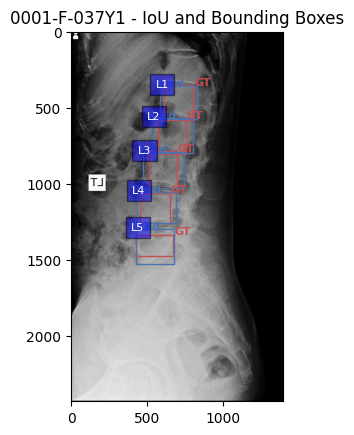

0004-F-010Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.99)
0004-F-010Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.94)
0004-F-010Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.89)
0004-F-010Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.89)
0004-F-010Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.89)


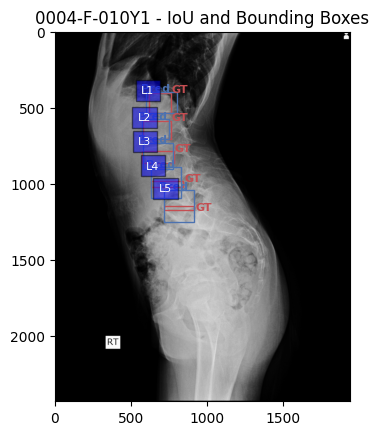

0008-M-022Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.95)
0008-M-022Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.95)
0008-M-022Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.94)
0008-M-022Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.91)
0008-M-022Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.88)


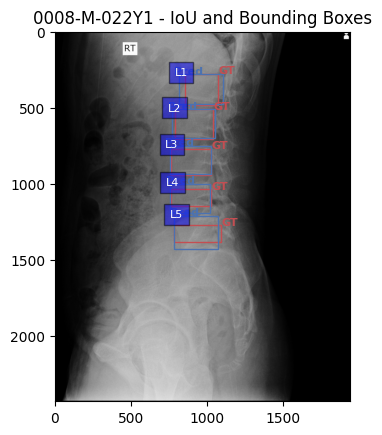

0009-F-038Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.95)
0009-F-038Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.95)
0009-F-038Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.95)
0009-F-038Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.94)
0009-F-038Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.93)


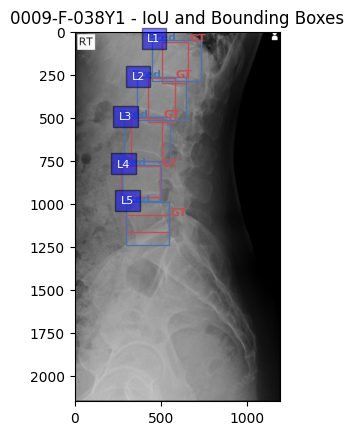

0011-F-063Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.97)
0011-F-063Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.95)
0011-F-063Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.84)
0011-F-063Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.81)


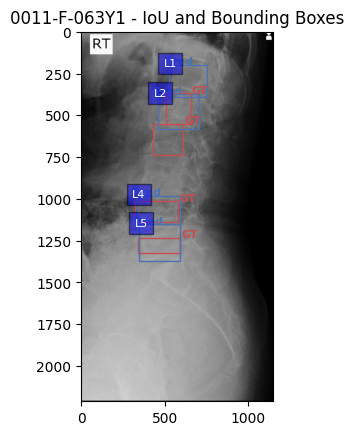

0012-F-013Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.95)
0012-F-013Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.95)
0012-F-013Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.94)
0012-F-013Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)
0012-F-013Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.93)


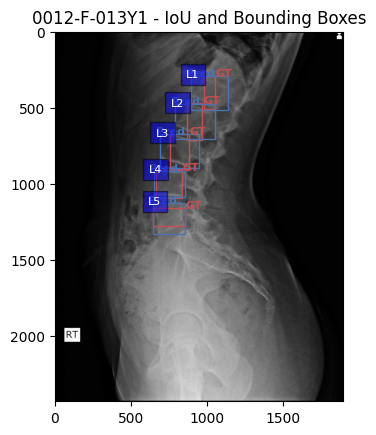

0015-M-020Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.95)
0015-M-020Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.93)
0015-M-020Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.90)
0015-M-020Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.79)
0015-M-020Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.77)
0015-M-020Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.67)


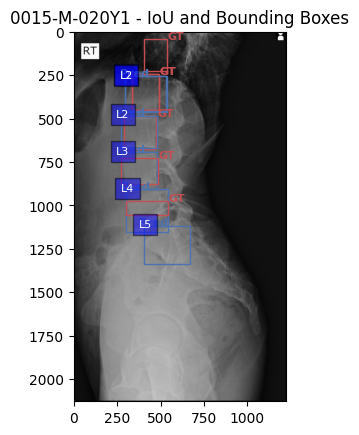

0016-F-023Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.97)
0016-F-023Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.97)
0016-F-023Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0016-F-023Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)
0016-F-023Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.93)


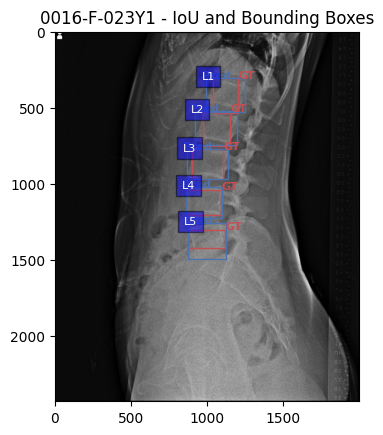

0020-M-030Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.96)
0020-M-030Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0020-M-030Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.94)
0020-M-030Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)
0020-M-030Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.91)


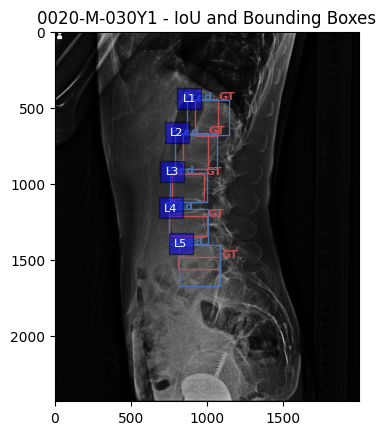

0022-M-006Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.97)
0022-M-006Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.94)
0022-M-006Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)
0022-M-006Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.93)
0022-M-006Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.92)


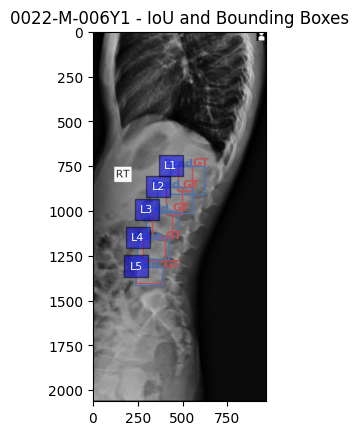

0023-F-014Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.98)
0023-F-014Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.97)
0023-F-014Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.96)
0023-F-014Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.95)
0023-F-014Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.93)


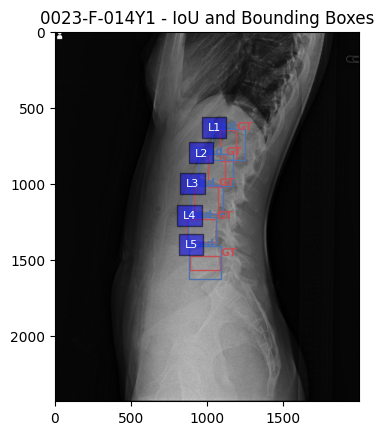

0025-F-015Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.96)
0025-F-015Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.95)
0025-F-015Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.94)
0025-F-015Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.93)
0025-F-015Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.93)


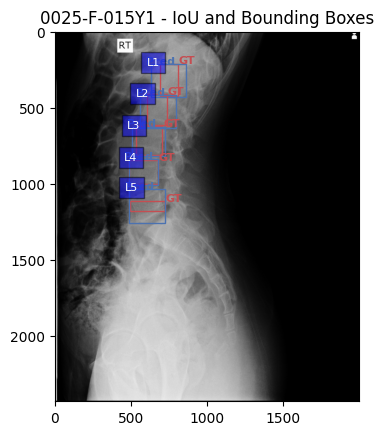

0026-F-029Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0026-F-029Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.96)
0026-F-029Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.93)
0026-F-029Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.92)
0026-F-029Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.92)


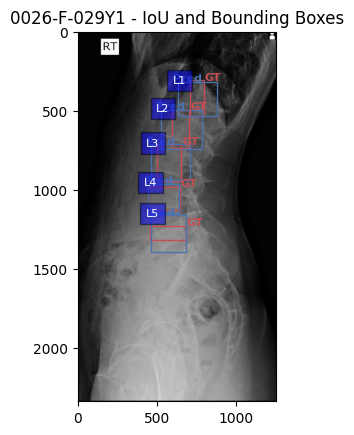

0028-F-041Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.97)
0028-F-041Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0028-F-041Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.96)
0028-F-041Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.94)
0028-F-041Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.90)


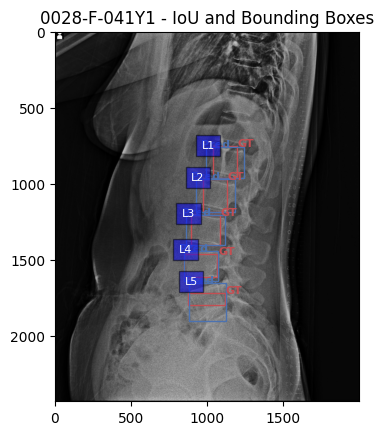

0032-F-007Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.96)
0032-F-007Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0032-F-007Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.95)
0032-F-007Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.94)
0032-F-007Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)


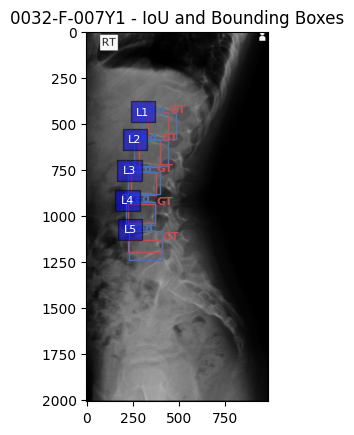

0034-F-067Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.97)
0034-F-067Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.96)
0034-F-067Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.96)
0034-F-067Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.95)
0034-F-067Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)


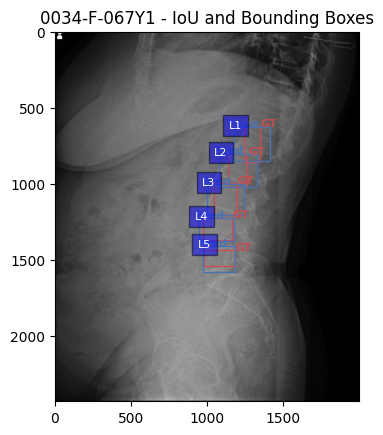

0037-F-019Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0037-F-019Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.96)
0037-F-019Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.94)
0037-F-019Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.83)
0037-F-019Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.76)


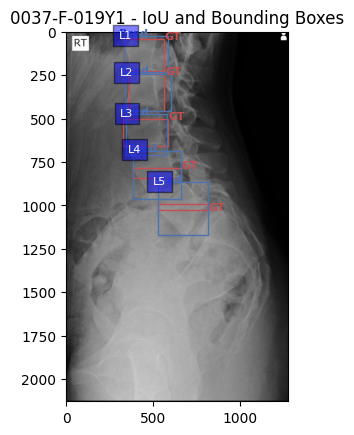

0038-F-020Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0038-F-020Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.95)
0038-F-020Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)
0038-F-020Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.94)
0038-F-020Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.94)


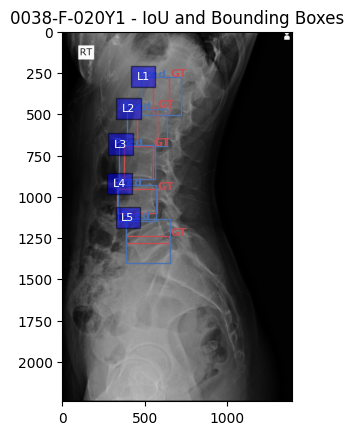

0040-M-023Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.97)
0040-M-023Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0040-M-023Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.94)
0040-M-023Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)
0040-M-023Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.92)


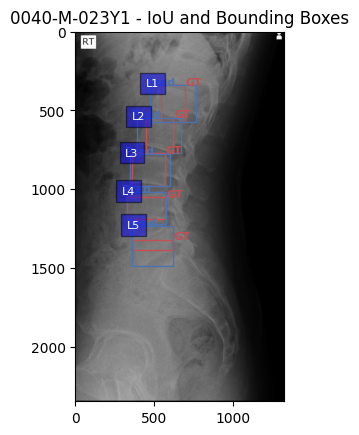

0042-F-019Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.94)
0042-F-019Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.91)
0042-F-019Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.83)


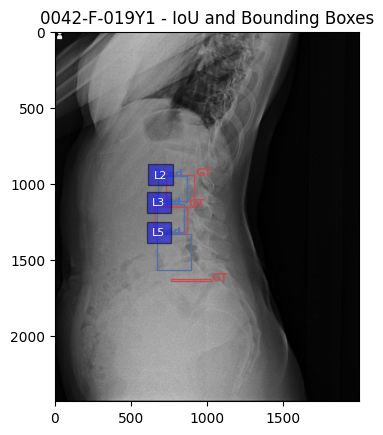

0043-F-039Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.95)
0043-F-039Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.93)
0043-F-039Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.93)
0043-F-039Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.93)
0043-F-039Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.90)


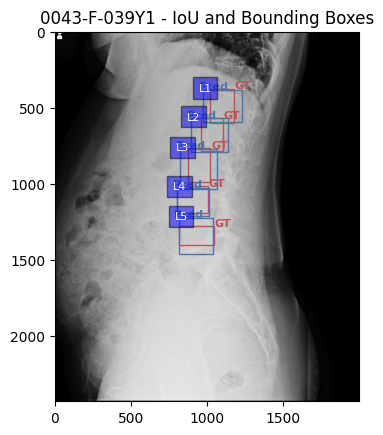

0046-F-021Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0046-F-021Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.95)
0046-F-021Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.95)
0046-F-021Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.94)
0046-F-021Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.93)


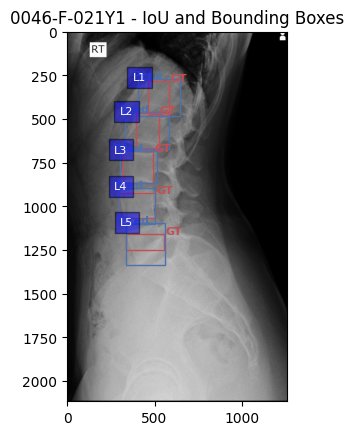

0048-F-020Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.96)
0048-F-020Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.95)
0048-F-020Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.95)
0048-F-020Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.95)
0048-F-020Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.94)


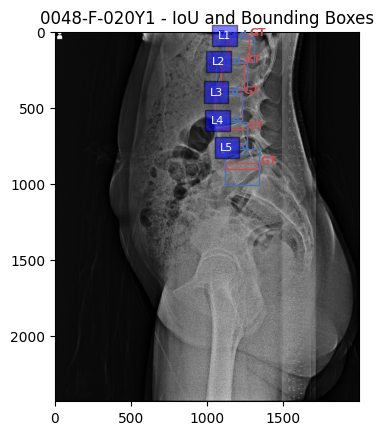

0054-F-079Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.97)
0054-F-079Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0054-F-079Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.95)
0054-F-079Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.93)
0054-F-079Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.86)


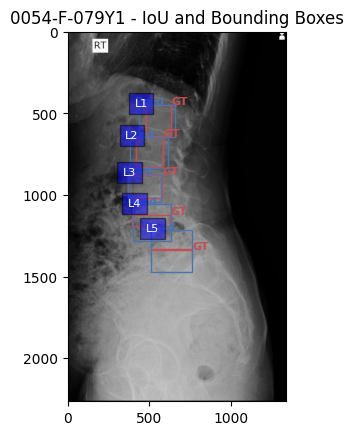

0056-F-069Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.96)
0056-F-069Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.95)
0056-F-069Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.95)
0056-F-069Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)
0056-F-069Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.92)


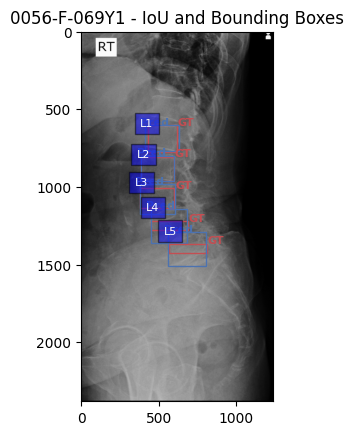

0057-F-030Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.95)
0057-F-030Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.94)
0057-F-030Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.92)
0057-F-030Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.91)
0057-F-030Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.91)


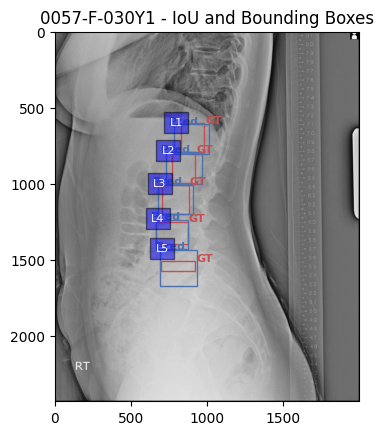

0059-F-028Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0059-F-028Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.95)
0059-F-028Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.95)
0059-F-028Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.95)
0059-F-028Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.95)


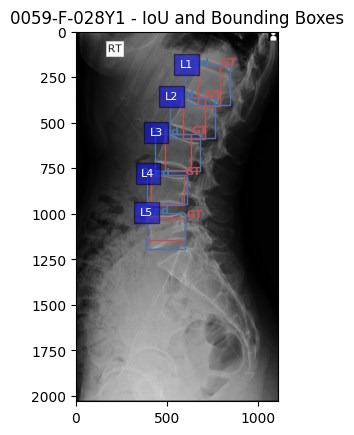

0062-F-041Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.97)
0062-F-041Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0062-F-041Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.96)
0062-F-041Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.96)
0062-F-041Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.94)


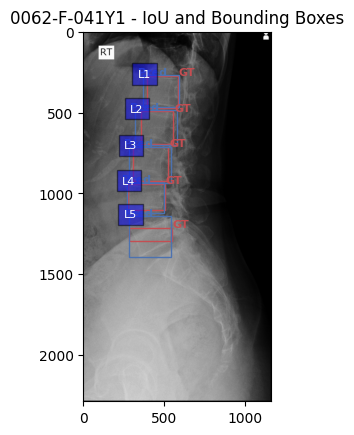

0065-F-032Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.96)
0065-F-032Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.94)
0065-F-032Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)
0065-F-032Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.93)
0065-F-032Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.92)


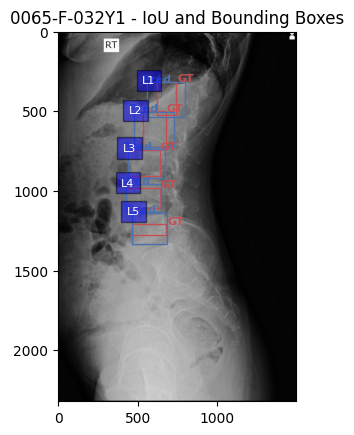

0067-F-028Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.98)
0067-F-028Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.97)
0067-F-028Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.96)
0067-F-028Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0067-F-028Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.91)


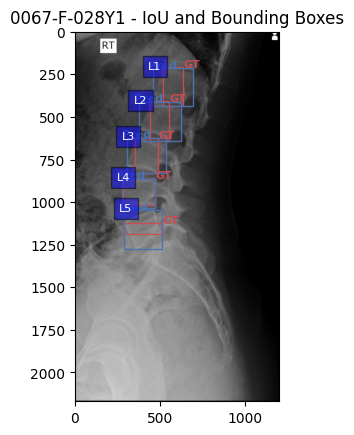

0073-F-036Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.98)
0073-F-036Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.96)
0073-F-036Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.95)
0073-F-036Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.95)
0073-F-036Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.93)


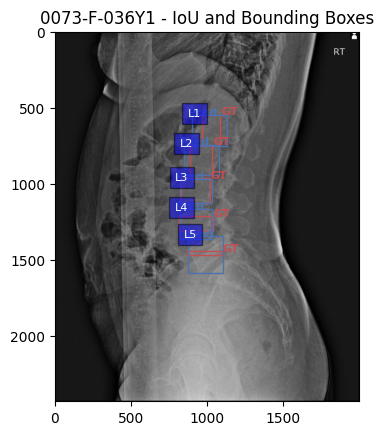

0109-F-042Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.99)
0109-F-042Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.96)
0109-F-042Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0109-F-042Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.96)
0109-F-042Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.94)


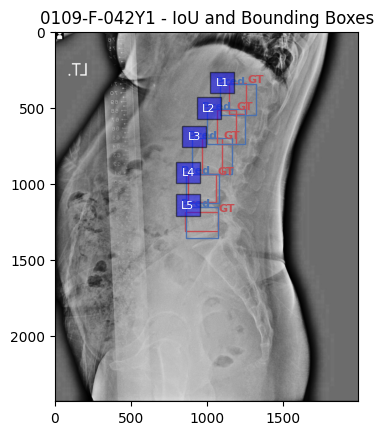

0112-F-064Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.97)
0112-F-064Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.96)
0112-F-064Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.94)
0112-F-064Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.93)
0112-F-064Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.93)


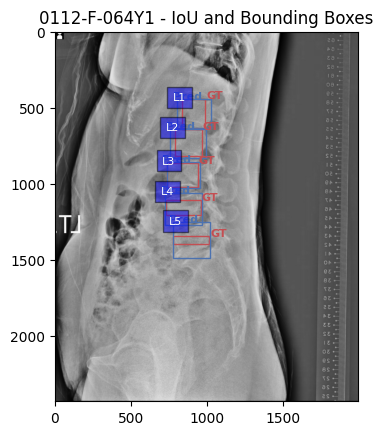

0113-F-082Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.97)
0113-F-082Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.96)
0113-F-082Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.96)
0113-F-082Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.95)
0113-F-082Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.95)


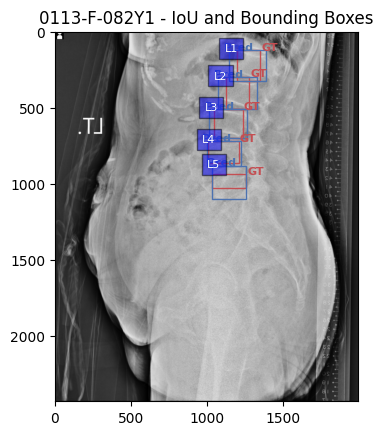

0134-M-038Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)
0134-M-038Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.93)
0134-M-038Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.93)
0134-M-038Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.91)
0134-M-038Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.90)


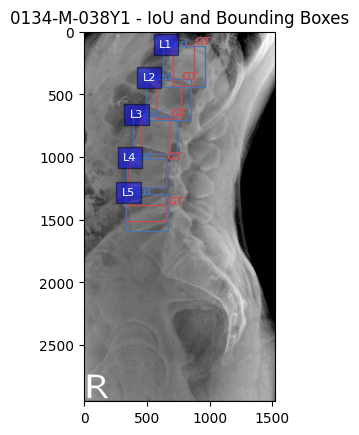

0138-M-064Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.97)
0138-M-064Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.95)
0138-M-064Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.94)
0138-M-064Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)
0138-M-064Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.93)


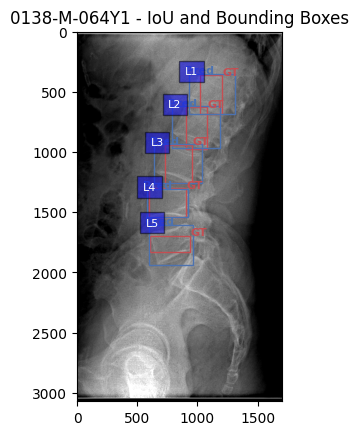

0139-F-077Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.94)
0139-F-077Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.94)
0139-F-077Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.94)
0139-F-077Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.92)
0139-F-077Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.92)


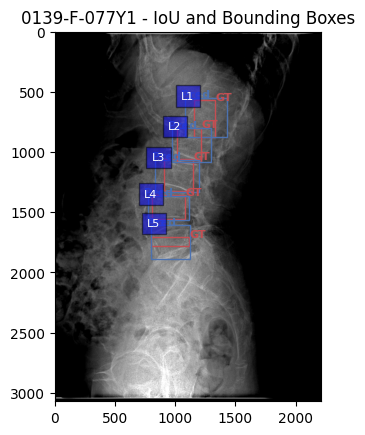

0140-M-024Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.97)
0140-M-024Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.96)
0140-M-024Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.95)
0140-M-024Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.95)
0140-M-024Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.93)


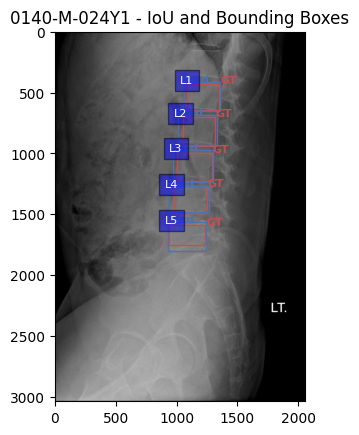

0141-M-055Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.95)
0141-M-055Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)
0141-M-055Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.93)
0141-M-055Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.93)
0141-M-055Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.93)


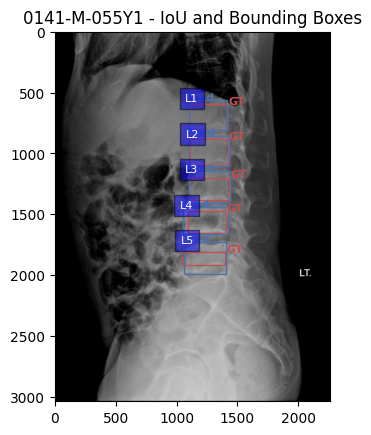

0142-F-051Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.97)
0142-F-051Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.96)
0142-F-051Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.96)
0142-F-051Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.95)
0142-F-051Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.94)


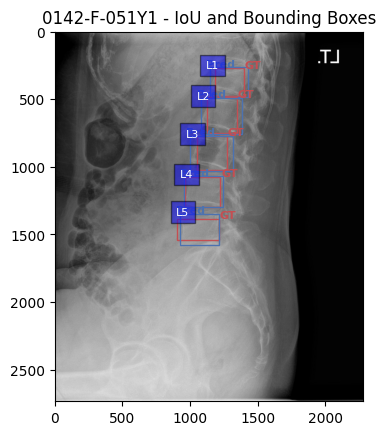

0147-F-086Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.97)
0147-F-086Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.96)
0147-F-086Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.95)
0147-F-086Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.94)
0147-F-086Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.93)


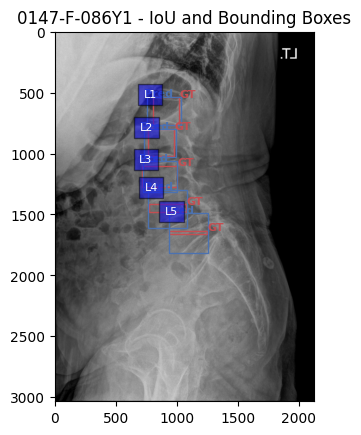

0148-M-058Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.96)
0148-M-058Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.95)
0148-M-058Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.95)
0148-M-058Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.95)
0148-M-058Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.89)
0148-M-058Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.82)
0148-M-058Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.80)


KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# 클래스 이름 정의
class_labels = {0: 'L1', 1: 'L2', 2: 'L3', 3: 'L4', 4: 'L5'}

confidence_threshold = 0.6  # 신뢰도 임계값

for result in results:
    preds = result.boxes.xyxy.cpu().numpy()  # 예측된 바운딩 박스 좌표
    pred_classes_batch = result.boxes.cls.cpu().numpy()  # 예측된 클래스
    confidences_batch = result.boxes.conf.cpu().numpy()  # 예측된 confidence score
    image_path = result.path
    image_name = os.path.basename(image_path)
    image_name_no_ext = os.path.splitext(image_name)[0]

    # 이미지를 로드
    img = Image.open(image_path)

    gt_row = la_df[la_df['filename'] == image_name_no_ext]
    if not gt_row.empty:
        gt_boxes = {}
        for i in range(1, 6):  # 각 클래스의 실제 바운딩 박스 정보 가져오기
            gt_box = [
                gt_row[f'L{i}a_1c'].values[0],
                gt_row[f'L{i}a_1r'].values[0],
                gt_row[f'L{i}b_2c'].values[0],
                gt_row[f'L{i}b_2r'].values[0]
            ]
            gt_boxes[i - 1] = gt_box

        # 이미지 시각화 준비
        fig, ax = plt.subplots(1)
        ax.imshow(img, cmap='gray')  # 이미지를 흑백으로 표시

        # 예측된 바운딩 박스와 ground truth 바운딩 박스를 그려줌
        for pred_box, pred_class, conf in zip(preds, pred_classes_batch, confidences_batch):
            if conf >= confidence_threshold:  # 신뢰도 임계값 0.6 이상인 경우만 처리
                if pred_class in gt_boxes:
                    gt_box = gt_boxes[pred_class]
                    iou_value = calculate_iou(gt_box, pred_box)

                    # IoU 값이 None일 경우 0으로 처리
                    if iou_value is None:
                        iou_value = 0.0

                    # Ground truth 박스 그리기 (빨간색) 및 'GT' 레이블 추가
                    gt_rect = patches.Rectangle((gt_box[0], gt_box[1]), gt_box[2] - gt_box[0], gt_box[3] - gt_box[1],
                                                linewidth=1, edgecolor='r', facecolor='none')  # 선 굵기를 1로 줄임
                    ax.add_patch(gt_rect)
                    ax.text(gt_box[2] + 5, gt_box[1], 'GT', color='r', fontsize=8, fontweight='bold')  # GT 글씨를 박스 우측으로 이동

                    # 예측 박스 그리기 (파란색) 및 'Pred' 레이블 추가
                    pred_rect = patches.Rectangle((pred_box[0], pred_box[1]), pred_box[2] - pred_box[0], pred_box[3] - pred_box[1],
                                                  linewidth=1, edgecolor='b', facecolor='none')  # 선 굵기를 1로 줄임
                    ax.add_patch(pred_rect)
                    ax.text(pred_box[0] - 30, pred_box[1], 'Pred', color='b', fontsize=8, fontweight='bold')  # Pred 글씨를 박스 좌측으로 이동

                    # 클래스 이름 추가 (예: L1, L2 등)
                    class_label = class_labels.get(int(pred_class), 'Unknown')
                    ax.text(pred_box[0] - 30, pred_box[1] + 10, class_label, color='white', fontsize=8, bbox=dict(facecolor='blue', alpha=0.5))

                    # IoU 값을 출력
                    print(f"{image_name_no_ext}의 클래스 {class_label}에 대한 IOU: {iou_value:.2f} (Confidence: {conf:.2f})")

        # 이미지 출력
        plt.title(f"{image_name_no_ext} - IoU and Bounding Boxes")
        plt.show()


### GT 코드

0001-F-037Y1의 클래스 L4에 대한 IOU: 0.74 (Confidence: 0.96)
0001-F-037Y1의 클래스 L2에 대한 IOU: 0.67 (Confidence: 0.95)
0001-F-037Y1의 클래스 L1에 대한 IOU: 0.76 (Confidence: 0.95)
0001-F-037Y1의 클래스 L5에 대한 IOU: 0.59 (Confidence: 0.94)
0001-F-037Y1의 클래스 L3에 대한 IOU: 0.65 (Confidence: 0.93)


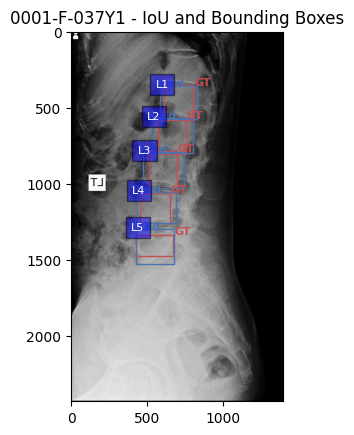

0004-F-010Y1의 클래스 L4에 대한 IOU: 0.19 (Confidence: 0.99)
0004-F-010Y1의 클래스 L3에 대한 IOU: 0.44 (Confidence: 0.94)
0004-F-010Y1의 클래스 L1에 대한 IOU: 0.69 (Confidence: 0.89)
0004-F-010Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.89)
0004-F-010Y1의 클래스 L2에 대한 IOU: 0.84 (Confidence: 0.89)


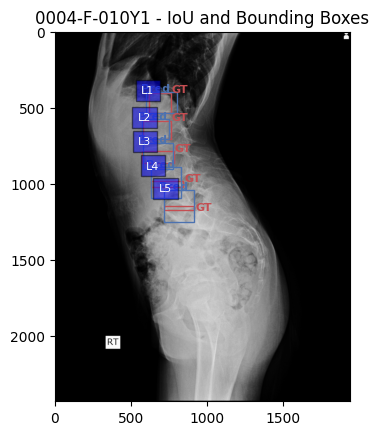

0008-M-022Y1의 클래스 L4에 대한 IOU: 0.57 (Confidence: 0.95)
0008-M-022Y1의 클래스 L1에 대한 IOU: 0.73 (Confidence: 0.95)
0008-M-022Y1의 클래스 L3에 대한 IOU: 0.84 (Confidence: 0.94)
0008-M-022Y1의 클래스 L2에 대한 IOU: 0.84 (Confidence: 0.91)
0008-M-022Y1의 클래스 L5에 대한 IOU: 0.49 (Confidence: 0.88)


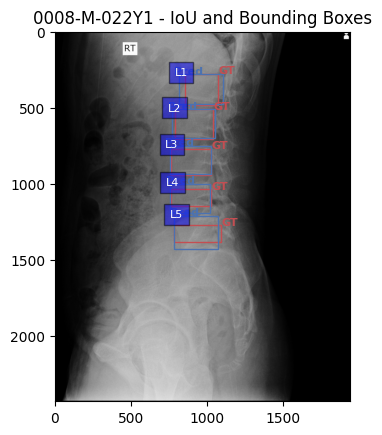

0009-F-038Y1의 클래스 L4에 대한 IOU: 0.82 (Confidence: 0.95)
0009-F-038Y1의 클래스 L1에 대한 IOU: 0.50 (Confidence: 0.95)
0009-F-038Y1의 클래스 L5에 대한 IOU: 0.40 (Confidence: 0.95)
0009-F-038Y1의 클래스 L3에 대한 IOU: 0.67 (Confidence: 0.94)
0009-F-038Y1의 클래스 L2에 대한 IOU: 0.52 (Confidence: 0.93)


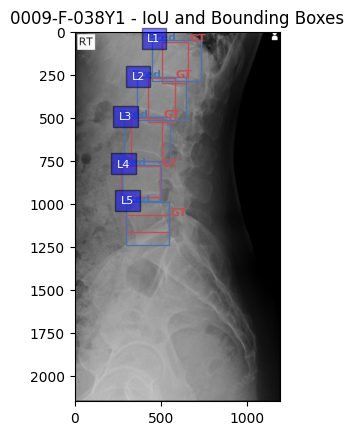

0011-F-063Y1의 클래스 L5에 대한 IOU: 0.42 (Confidence: 0.97)
0011-F-063Y1의 클래스 L4에 대한 IOU: 0.69 (Confidence: 0.95)
0011-F-063Y1의 클래스 L2에 대한 IOU: 0.06 (Confidence: 0.84)
0011-F-063Y1의 클래스 L1에 대한 IOU: 0.04 (Confidence: 0.81)


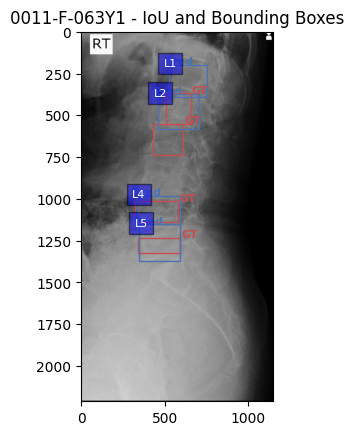

0012-F-013Y1의 클래스 L4에 대한 IOU: 0.77 (Confidence: 0.95)
0012-F-013Y1의 클래스 L1에 대한 IOU: 0.30 (Confidence: 0.95)
0012-F-013Y1의 클래스 L3에 대한 IOU: 0.50 (Confidence: 0.94)
0012-F-013Y1의 클래스 L5에 대한 IOU: 0.56 (Confidence: 0.94)
0012-F-013Y1의 클래스 L2에 대한 IOU: 0.37 (Confidence: 0.93)


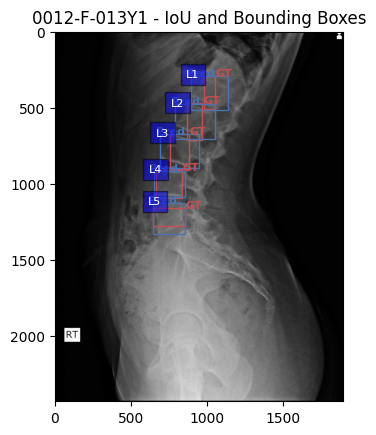

0015-M-020Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.95)
0015-M-020Y1의 클래스 L4에 대한 IOU: 0.00 (Confidence: 0.93)
0015-M-020Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.90)
0015-M-020Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.79)
0015-M-020Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.77)
0015-M-020Y1의 클래스 L2에 대한 IOU: 0.59 (Confidence: 0.67)


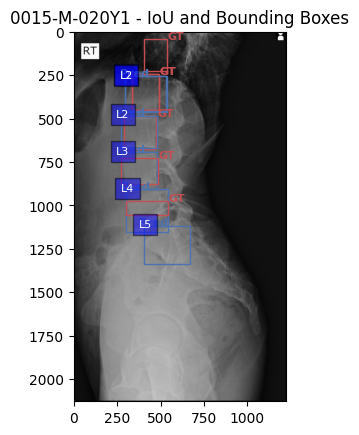

0016-F-023Y1의 클래스 L2에 대한 IOU: 0.61 (Confidence: 0.97)
0016-F-023Y1의 클래스 L1에 대한 IOU: 0.64 (Confidence: 0.97)
0016-F-023Y1의 클래스 L4에 대한 IOU: 0.80 (Confidence: 0.96)
0016-F-023Y1의 클래스 L5에 대한 IOU: 0.52 (Confidence: 0.94)
0016-F-023Y1의 클래스 L3에 대한 IOU: 0.73 (Confidence: 0.93)


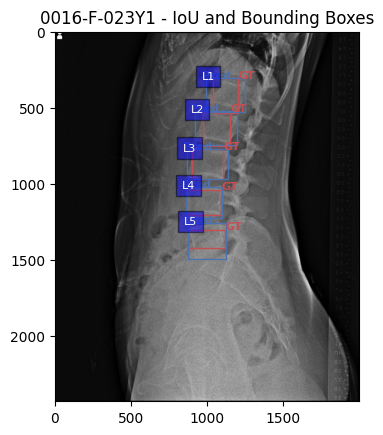

0020-M-030Y1의 클래스 L1에 대한 IOU: 0.54 (Confidence: 0.96)
0020-M-030Y1의 클래스 L4에 대한 IOU: 0.58 (Confidence: 0.96)
0020-M-030Y1의 클래스 L2에 대한 IOU: 0.58 (Confidence: 0.94)
0020-M-030Y1의 클래스 L5에 대한 IOU: 0.30 (Confidence: 0.94)
0020-M-030Y1의 클래스 L3에 대한 IOU: 0.85 (Confidence: 0.91)


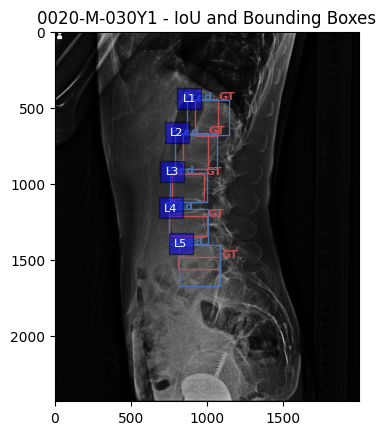

0022-M-006Y1의 클래스 L4에 대한 IOU: 0.63 (Confidence: 0.97)
0022-M-006Y1의 클래스 L3에 대한 IOU: 0.58 (Confidence: 0.94)
0022-M-006Y1의 클래스 L5에 대한 IOU: 0.85 (Confidence: 0.94)
0022-M-006Y1의 클래스 L1에 대한 IOU: 0.36 (Confidence: 0.93)
0022-M-006Y1의 클래스 L2에 대한 IOU: 0.43 (Confidence: 0.92)


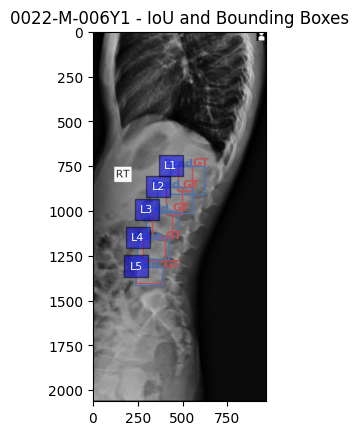

0023-F-014Y1의 클래스 L1에 대한 IOU: 0.45 (Confidence: 0.98)
0023-F-014Y1의 클래스 L2에 대한 IOU: 0.51 (Confidence: 0.97)
0023-F-014Y1의 클래스 L5에 대한 IOU: 0.39 (Confidence: 0.96)
0023-F-014Y1의 클래스 L4에 대한 IOU: 0.86 (Confidence: 0.95)
0023-F-014Y1의 클래스 L3에 대한 IOU: 0.71 (Confidence: 0.93)


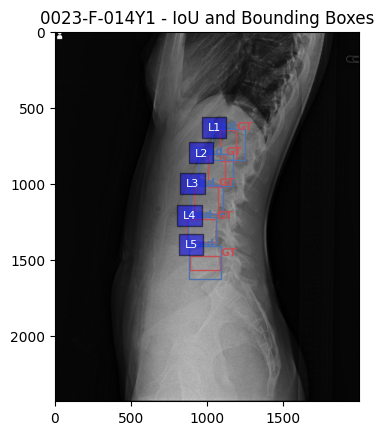

0025-F-015Y1의 클래스 L1에 대한 IOU: 0.50 (Confidence: 0.96)
0025-F-015Y1의 클래스 L3에 대한 IOU: 0.74 (Confidence: 0.95)
0025-F-015Y1의 클래스 L4에 대한 IOU: 0.90 (Confidence: 0.94)
0025-F-015Y1의 클래스 L2에 대한 IOU: 0.48 (Confidence: 0.93)
0025-F-015Y1의 클래스 L5에 대한 IOU: 0.29 (Confidence: 0.93)


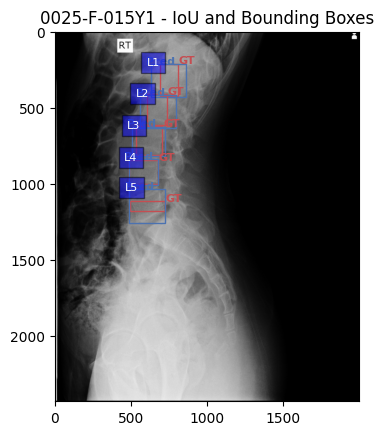

0026-F-029Y1의 클래스 L4에 대한 IOU: 0.79 (Confidence: 0.96)
0026-F-029Y1의 클래스 L5에 대한 IOU: 0.38 (Confidence: 0.96)
0026-F-029Y1의 클래스 L2에 대한 IOU: 0.41 (Confidence: 0.93)
0026-F-029Y1의 클래스 L1에 대한 IOU: 0.36 (Confidence: 0.92)
0026-F-029Y1의 클래스 L3에 대한 IOU: 0.62 (Confidence: 0.92)


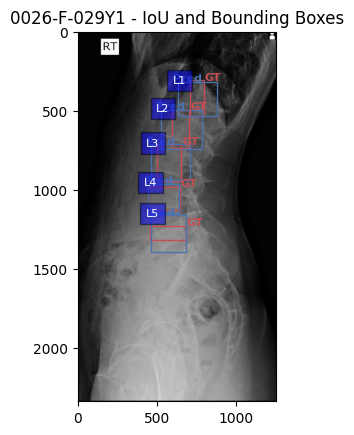

0028-F-041Y1의 클래스 L3에 대한 IOU: 0.72 (Confidence: 0.97)
0028-F-041Y1의 클래스 L4에 대한 IOU: 0.72 (Confidence: 0.96)
0028-F-041Y1의 클래스 L1에 대한 IOU: 0.61 (Confidence: 0.96)
0028-F-041Y1의 클래스 L2에 대한 IOU: 0.61 (Confidence: 0.94)
0028-F-041Y1의 클래스 L5에 대한 IOU: 0.29 (Confidence: 0.90)


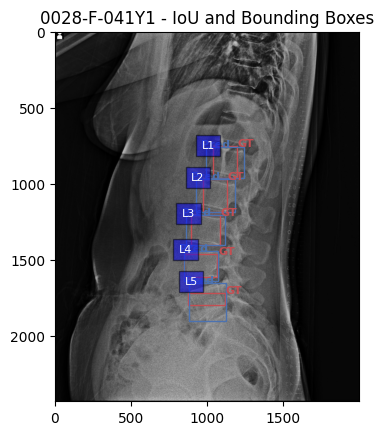

0032-F-007Y1의 클래스 L1에 대한 IOU: 0.57 (Confidence: 0.96)
0032-F-007Y1의 클래스 L4에 대한 IOU: 0.78 (Confidence: 0.96)
0032-F-007Y1의 클래스 L3에 대한 IOU: 0.79 (Confidence: 0.95)
0032-F-007Y1의 클래스 L2에 대한 IOU: 0.60 (Confidence: 0.94)
0032-F-007Y1의 클래스 L5에 대한 IOU: 0.42 (Confidence: 0.94)


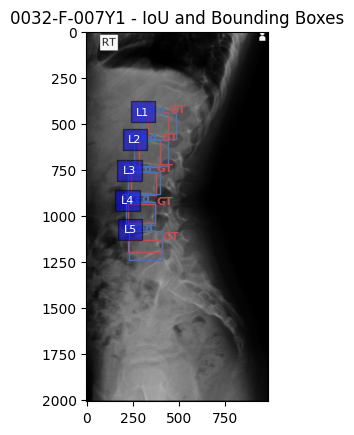

0034-F-067Y1의 클래스 L1에 대한 IOU: 0.43 (Confidence: 0.97)
0034-F-067Y1의 클래스 L2에 대한 IOU: 0.50 (Confidence: 0.96)
0034-F-067Y1의 클래스 L3에 대한 IOU: 0.59 (Confidence: 0.96)
0034-F-067Y1의 클래스 L4에 대한 IOU: 0.81 (Confidence: 0.95)
0034-F-067Y1의 클래스 L5에 대한 IOU: 0.56 (Confidence: 0.94)


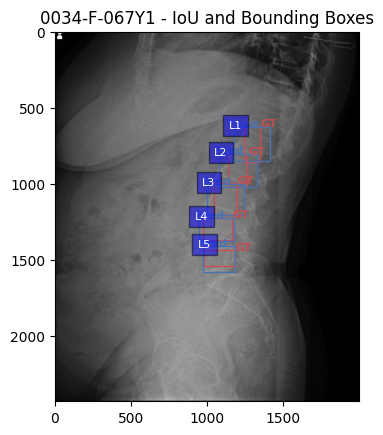

0037-F-019Y1의 클래스 L4에 대한 IOU: 0.20 (Confidence: 0.96)
0037-F-019Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.96)
0037-F-019Y1의 클래스 L3에 대한 IOU: 0.63 (Confidence: 0.94)
0037-F-019Y1의 클래스 L2에 대한 IOU: 0.76 (Confidence: 0.83)
0037-F-019Y1의 클래스 L1에 대한 IOU: 0.80 (Confidence: 0.76)


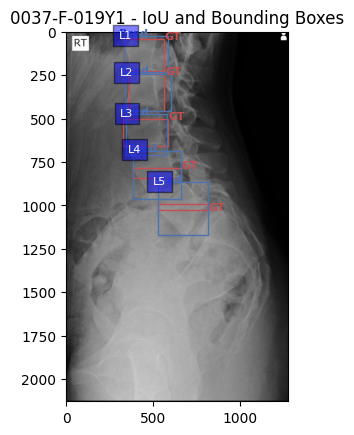

0038-F-020Y1의 클래스 L4에 대한 IOU: 0.64 (Confidence: 0.96)
0038-F-020Y1의 클래스 L1에 대한 IOU: 0.41 (Confidence: 0.95)
0038-F-020Y1의 클래스 L5에 대한 IOU: 0.17 (Confidence: 0.94)
0038-F-020Y1의 클래스 L2에 대한 IOU: 0.48 (Confidence: 0.94)
0038-F-020Y1의 클래스 L3에 대한 IOU: 0.79 (Confidence: 0.94)


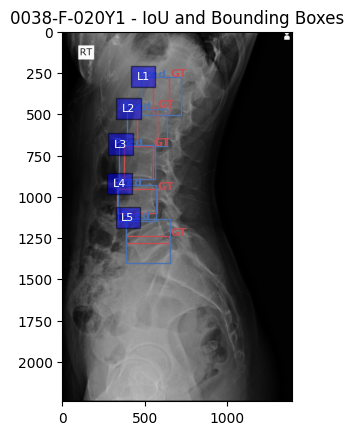

0040-M-023Y1의 클래스 L2에 대한 IOU: 0.60 (Confidence: 0.97)
0040-M-023Y1의 클래스 L4에 대한 IOU: 0.70 (Confidence: 0.96)
0040-M-023Y1의 클래스 L1에 대한 IOU: 0.52 (Confidence: 0.94)
0040-M-023Y1의 클래스 L5에 대한 IOU: 0.27 (Confidence: 0.94)
0040-M-023Y1의 클래스 L3에 대한 IOU: 0.81 (Confidence: 0.92)


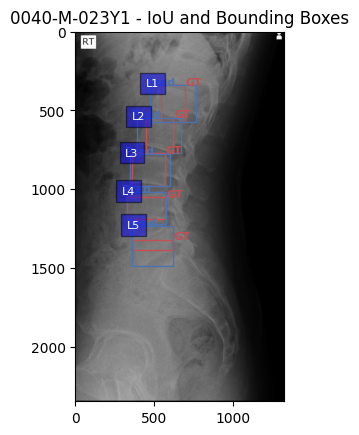

0042-F-019Y1의 클래스 L2에 대한 IOU: 0.48 (Confidence: 0.94)
0042-F-019Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.91)
0042-F-019Y1의 클래스 L3에 대한 IOU: 0.75 (Confidence: 0.83)


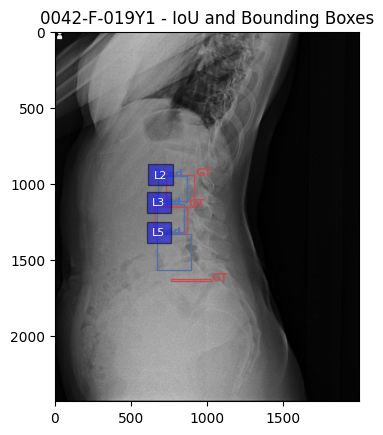

0043-F-039Y1의 클래스 L4에 대한 IOU: 0.81 (Confidence: 0.95)
0043-F-039Y1의 클래스 L5에 대한 IOU: 0.52 (Confidence: 0.93)
0043-F-039Y1의 클래스 L2에 대한 IOU: 0.57 (Confidence: 0.93)
0043-F-039Y1의 클래스 L1에 대한 IOU: 0.58 (Confidence: 0.93)
0043-F-039Y1의 클래스 L3에 대한 IOU: 0.50 (Confidence: 0.90)


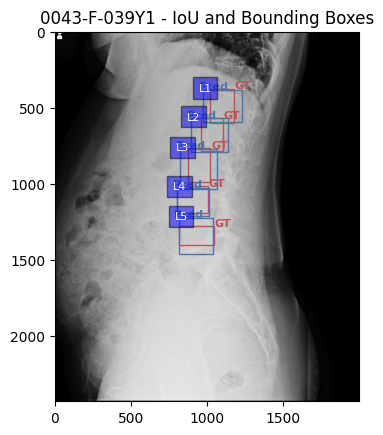

0046-F-021Y1의 클래스 L4에 대한 IOU: 0.69 (Confidence: 0.96)
0046-F-021Y1의 클래스 L5에 대한 IOU: 0.38 (Confidence: 0.95)
0046-F-021Y1의 클래스 L2에 대한 IOU: 0.49 (Confidence: 0.95)
0046-F-021Y1의 클래스 L3에 대한 IOU: 0.80 (Confidence: 0.94)
0046-F-021Y1의 클래스 L1에 대한 IOU: 0.45 (Confidence: 0.93)


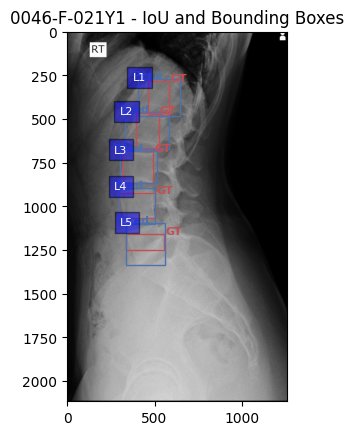

0048-F-020Y1의 클래스 L1에 대한 IOU: 0.63 (Confidence: 0.96)
0048-F-020Y1의 클래스 L2에 대한 IOU: 0.72 (Confidence: 0.95)
0048-F-020Y1의 클래스 L4에 대한 IOU: 0.47 (Confidence: 0.95)
0048-F-020Y1의 클래스 L5에 대한 IOU: 0.15 (Confidence: 0.95)
0048-F-020Y1의 클래스 L3에 대한 IOU: 0.89 (Confidence: 0.94)


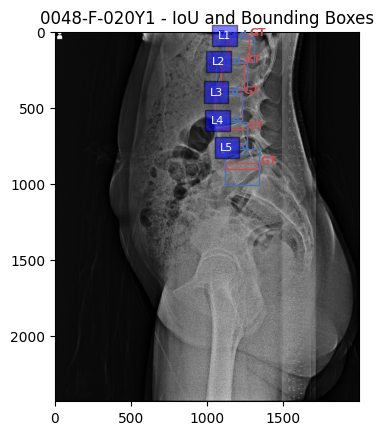

0054-F-079Y1의 클래스 L2에 대한 IOU: 0.68 (Confidence: 0.97)
0054-F-079Y1의 클래스 L4에 대한 IOU: 0.29 (Confidence: 0.96)
0054-F-079Y1의 클래스 L3에 대한 IOU: 0.80 (Confidence: 0.95)
0054-F-079Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.93)
0054-F-079Y1의 클래스 L1에 대한 IOU: 0.67 (Confidence: 0.86)


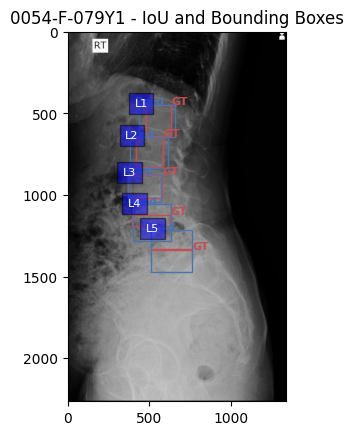

0056-F-069Y1의 클래스 L1에 대한 IOU: 0.81 (Confidence: 0.96)
0056-F-069Y1의 클래스 L4에 대한 IOU: 0.26 (Confidence: 0.95)
0056-F-069Y1의 클래스 L2에 대한 IOU: 0.93 (Confidence: 0.95)
0056-F-069Y1의 클래스 L5에 대한 IOU: 0.26 (Confidence: 0.94)
0056-F-069Y1의 클래스 L3에 대한 IOU: 0.64 (Confidence: 0.92)


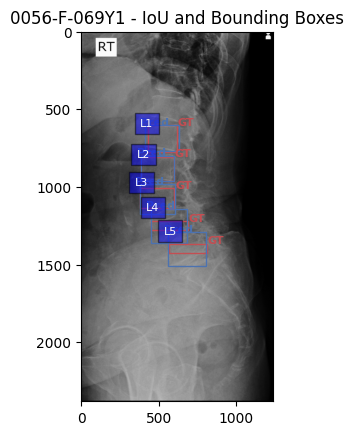

0057-F-030Y1의 클래스 L5에 대한 IOU: 0.25 (Confidence: 0.95)
0057-F-030Y1의 클래스 L4에 대한 IOU: 0.75 (Confidence: 0.94)
0057-F-030Y1의 클래스 L3에 대한 IOU: 0.75 (Confidence: 0.92)
0057-F-030Y1의 클래스 L1에 대한 IOU: 0.65 (Confidence: 0.91)
0057-F-030Y1의 클래스 L2에 대한 IOU: 0.63 (Confidence: 0.91)


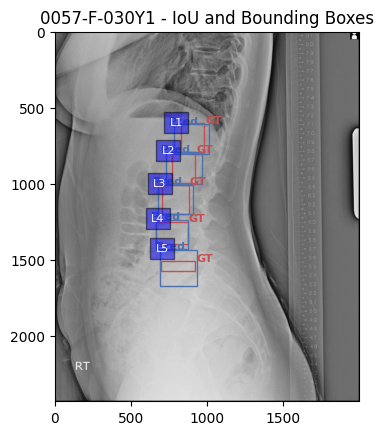

0059-F-028Y1의 클래스 L4에 대한 IOU: 0.76 (Confidence: 0.96)
0059-F-028Y1의 클래스 L3에 대한 IOU: 0.57 (Confidence: 0.95)
0059-F-028Y1의 클래스 L5에 대한 IOU: 0.62 (Confidence: 0.95)
0059-F-028Y1의 클래스 L1에 대한 IOU: 0.49 (Confidence: 0.95)
0059-F-028Y1의 클래스 L2에 대한 IOU: 0.48 (Confidence: 0.95)


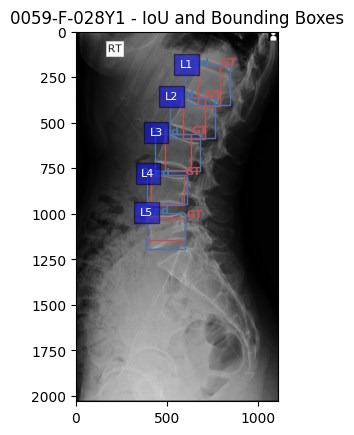

0062-F-041Y1의 클래스 L1에 대한 IOU: 0.83 (Confidence: 0.97)
0062-F-041Y1의 클래스 L4에 대한 IOU: 0.82 (Confidence: 0.96)
0062-F-041Y1의 클래스 L3에 대한 IOU: 0.82 (Confidence: 0.96)
0062-F-041Y1의 클래스 L5에 대한 IOU: 0.33 (Confidence: 0.96)
0062-F-041Y1의 클래스 L2에 대한 IOU: 0.73 (Confidence: 0.94)


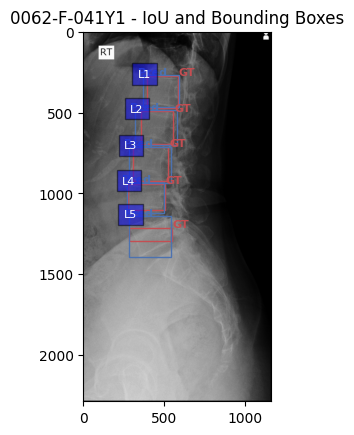

0065-F-032Y1의 클래스 L2에 대한 IOU: 0.55 (Confidence: 0.96)
0065-F-032Y1의 클래스 L1에 대한 IOU: 0.47 (Confidence: 0.94)
0065-F-032Y1의 클래스 L5에 대한 IOU: 0.33 (Confidence: 0.94)
0065-F-032Y1의 클래스 L4에 대한 IOU: 0.70 (Confidence: 0.93)
0065-F-032Y1의 클래스 L3에 대한 IOU: 0.79 (Confidence: 0.92)


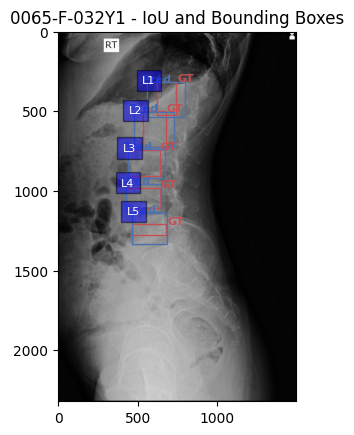

0067-F-028Y1의 클래스 L3에 대한 IOU: 0.60 (Confidence: 0.98)
0067-F-028Y1의 클래스 L5에 대한 IOU: 0.28 (Confidence: 0.97)
0067-F-028Y1의 클래스 L1에 대한 IOU: 0.49 (Confidence: 0.96)
0067-F-028Y1의 클래스 L4에 대한 IOU: 0.84 (Confidence: 0.96)
0067-F-028Y1의 클래스 L2에 대한 IOU: 0.43 (Confidence: 0.91)


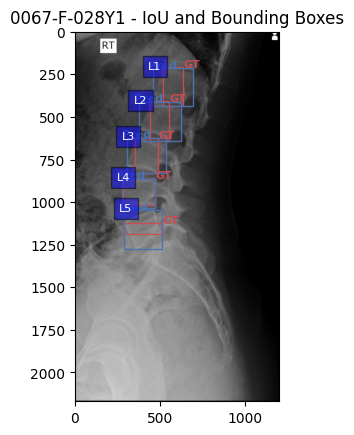

0073-F-036Y1의 클래스 L1에 대한 IOU: 0.53 (Confidence: 0.98)
0073-F-036Y1의 클래스 L2에 대한 IOU: 0.63 (Confidence: 0.96)
0073-F-036Y1의 클래스 L3에 대한 IOU: 0.85 (Confidence: 0.95)
0073-F-036Y1의 클래스 L4에 대한 IOU: 0.47 (Confidence: 0.95)
0073-F-036Y1의 클래스 L5에 대한 IOU: 0.10 (Confidence: 0.93)


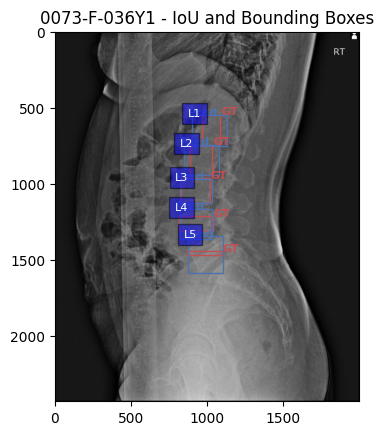

0109-F-042Y1의 클래스 L5에 대한 IOU: 0.61 (Confidence: 0.99)
0109-F-042Y1의 클래스 L3에 대한 IOU: 0.52 (Confidence: 0.96)
0109-F-042Y1의 클래스 L4에 대한 IOU: 0.82 (Confidence: 0.96)
0109-F-042Y1의 클래스 L1에 대한 IOU: 0.44 (Confidence: 0.96)
0109-F-042Y1의 클래스 L2에 대한 IOU: 0.48 (Confidence: 0.94)


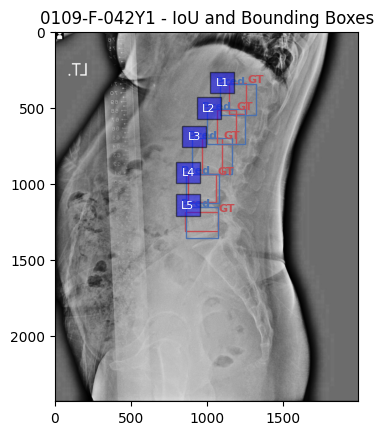

0112-F-064Y1의 클래스 L4에 대한 IOU: 0.46 (Confidence: 0.97)
0112-F-064Y1의 클래스 L3에 대한 IOU: 0.86 (Confidence: 0.96)
0112-F-064Y1의 클래스 L1에 대한 IOU: 0.66 (Confidence: 0.94)
0112-F-064Y1의 클래스 L2에 대한 IOU: 0.71 (Confidence: 0.93)
0112-F-064Y1의 클래스 L5에 대한 IOU: 0.22 (Confidence: 0.93)


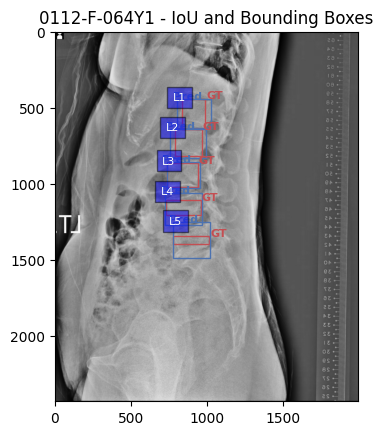

0113-F-082Y1의 클래스 L2에 대한 IOU: 0.59 (Confidence: 0.97)
0113-F-082Y1의 클래스 L3에 대한 IOU: 0.76 (Confidence: 0.96)
0113-F-082Y1의 클래스 L5에 대한 IOU: 0.39 (Confidence: 0.96)
0113-F-082Y1의 클래스 L4에 대한 IOU: 0.77 (Confidence: 0.95)
0113-F-082Y1의 클래스 L1에 대한 IOU: 0.64 (Confidence: 0.95)


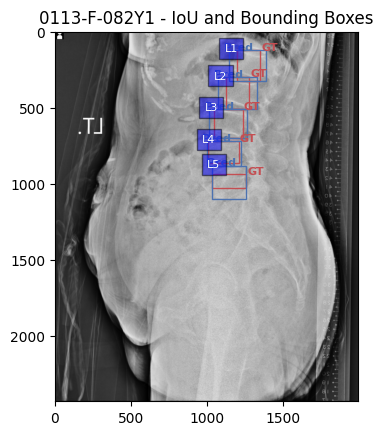

0134-M-038Y1의 클래스 L5에 대한 IOU: 0.44 (Confidence: 0.94)
0134-M-038Y1의 클래스 L3에 대한 IOU: 0.66 (Confidence: 0.93)
0134-M-038Y1의 클래스 L4에 대한 IOU: 0.92 (Confidence: 0.93)
0134-M-038Y1의 클래스 L2에 대한 IOU: 0.53 (Confidence: 0.91)
0134-M-038Y1의 클래스 L1에 대한 IOU: 0.49 (Confidence: 0.90)


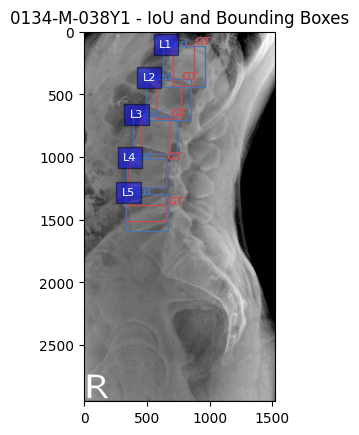

0138-M-064Y1의 클래스 L4에 대한 IOU: 0.87 (Confidence: 0.97)
0138-M-064Y1의 클래스 L2에 대한 IOU: 0.43 (Confidence: 0.95)
0138-M-064Y1의 클래스 L1에 대한 IOU: 0.46 (Confidence: 0.94)
0138-M-064Y1의 클래스 L5에 대한 IOU: 0.37 (Confidence: 0.94)
0138-M-064Y1의 클래스 L3에 대한 IOU: 0.54 (Confidence: 0.93)


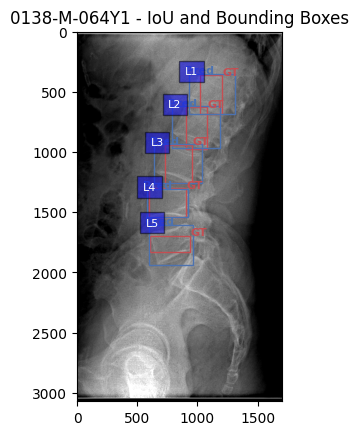

0139-F-077Y1의 클래스 L3에 대한 IOU: 0.64 (Confidence: 0.94)
0139-F-077Y1의 클래스 L4에 대한 IOU: 0.77 (Confidence: 0.94)
0139-F-077Y1의 클래스 L1에 대한 IOU: 0.45 (Confidence: 0.94)
0139-F-077Y1의 클래스 L5에 대한 IOU: 0.25 (Confidence: 0.92)
0139-F-077Y1의 클래스 L2에 대한 IOU: 0.59 (Confidence: 0.92)


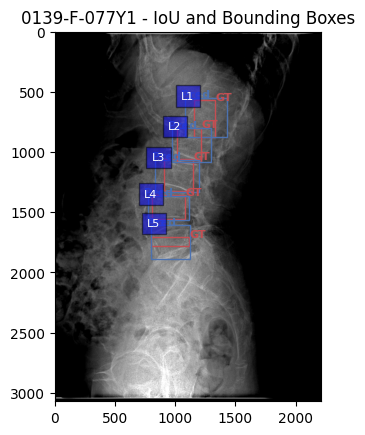

0140-M-024Y1의 클래스 L4에 대한 IOU: 0.82 (Confidence: 0.97)
0140-M-024Y1의 클래스 L1에 대한 IOU: 0.83 (Confidence: 0.96)
0140-M-024Y1의 클래스 L5에 대한 IOU: 0.68 (Confidence: 0.95)
0140-M-024Y1의 클래스 L2에 대한 IOU: 0.75 (Confidence: 0.95)
0140-M-024Y1의 클래스 L3에 대한 IOU: 0.80 (Confidence: 0.93)


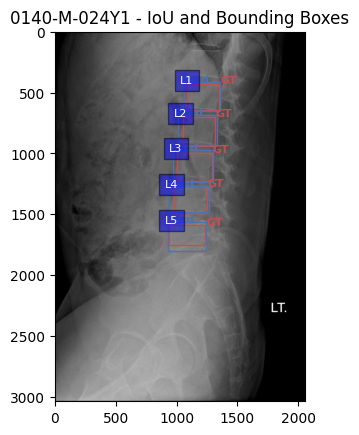

0141-M-055Y1의 클래스 L4에 대한 IOU: 0.69 (Confidence: 0.95)
0141-M-055Y1의 클래스 L5에 대한 IOU: 0.39 (Confidence: 0.94)
0141-M-055Y1의 클래스 L3에 대한 IOU: 0.69 (Confidence: 0.93)
0141-M-055Y1의 클래스 L1에 대한 IOU: 0.84 (Confidence: 0.93)
0141-M-055Y1의 클래스 L2에 대한 IOU: 0.82 (Confidence: 0.93)


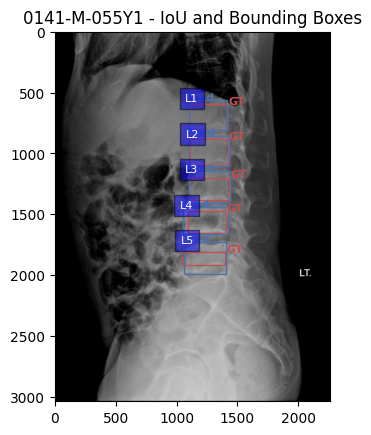

0142-F-051Y1의 클래스 L4에 대한 IOU: 0.87 (Confidence: 0.97)
0142-F-051Y1의 클래스 L1에 대한 IOU: 0.72 (Confidence: 0.96)
0142-F-051Y1의 클래스 L5에 대한 IOU: 0.62 (Confidence: 0.96)
0142-F-051Y1의 클래스 L2에 대한 IOU: 0.71 (Confidence: 0.95)
0142-F-051Y1의 클래스 L3에 대한 IOU: 0.69 (Confidence: 0.94)


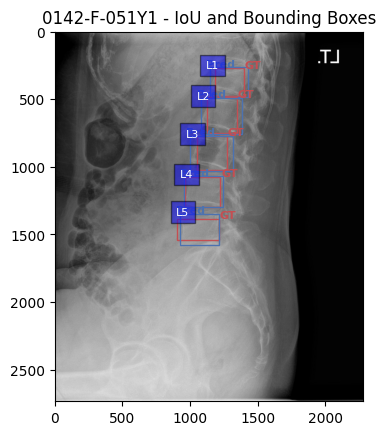

0147-F-086Y1의 클래스 L5에 대한 IOU: 0.09 (Confidence: 0.97)
0147-F-086Y1의 클래스 L4에 대한 IOU: 0.20 (Confidence: 0.96)
0147-F-086Y1의 클래스 L2에 대한 IOU: 0.77 (Confidence: 0.95)
0147-F-086Y1의 클래스 L3에 대한 IOU: 0.67 (Confidence: 0.94)
0147-F-086Y1의 클래스 L1에 대한 IOU: 0.76 (Confidence: 0.93)


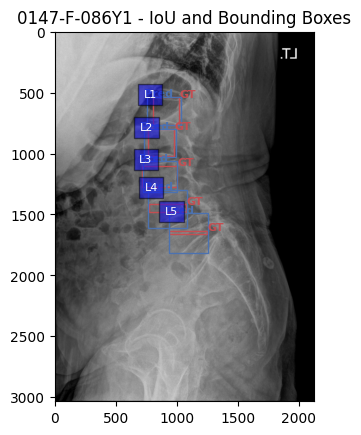

0148-M-058Y1의 클래스 L5에 대한 IOU: 0.33 (Confidence: 0.96)
0148-M-058Y1의 클래스 L2에 대한 IOU: 0.50 (Confidence: 0.95)
0148-M-058Y1의 클래스 L3에 대한 IOU: 0.66 (Confidence: 0.95)
0148-M-058Y1의 클래스 L4에 대한 IOU: 0.84 (Confidence: 0.95)
0148-M-058Y1의 클래스 L1에 대한 IOU: 0.04 (Confidence: 0.89)
0148-M-058Y1의 클래스 L1에 대한 IOU: 0.55 (Confidence: 0.82)
0148-M-058Y1의 클래스 L2에 대한 IOU: 0.04 (Confidence: 0.80)


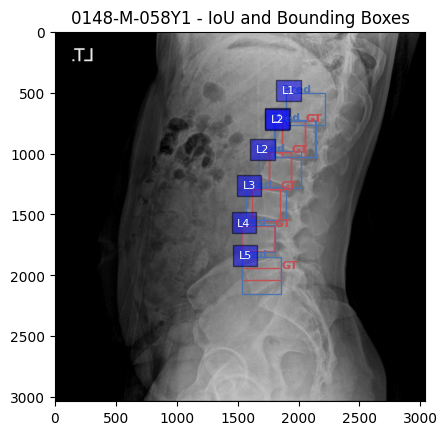

0151-M-079Y1의 클래스 L5에 대한 IOU: 0.42 (Confidence: 0.95)
0151-M-079Y1의 클래스 L4에 대한 IOU: 0.77 (Confidence: 0.94)
0151-M-079Y1의 클래스 L1에 대한 IOU: 0.75 (Confidence: 0.94)
0151-M-079Y1의 클래스 L3에 대한 IOU: 0.58 (Confidence: 0.94)
0151-M-079Y1의 클래스 L2에 대한 IOU: 0.58 (Confidence: 0.92)


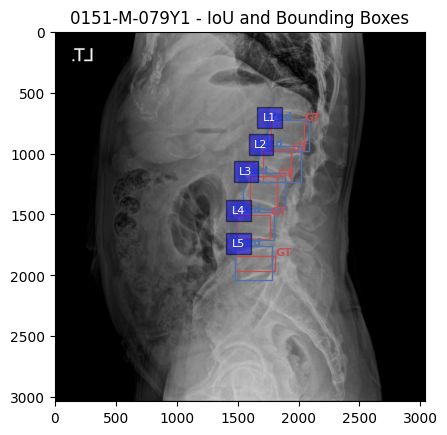

0157-M-060Y1의 클래스 L4에 대한 IOU: 0.76 (Confidence: 0.96)
0157-M-060Y1의 클래스 L1에 대한 IOU: 0.62 (Confidence: 0.95)
0157-M-060Y1의 클래스 L5에 대한 IOU: 0.20 (Confidence: 0.94)
0157-M-060Y1의 클래스 L2에 대한 IOU: 0.70 (Confidence: 0.94)
0157-M-060Y1의 클래스 L3에 대한 IOU: 0.82 (Confidence: 0.92)


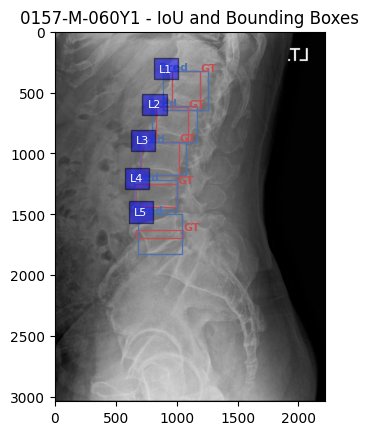

0163-F-053Y1의 클래스 L3에 대한 IOU: 0.80 (Confidence: 0.97)
0163-F-053Y1의 클래스 L4에 대한 IOU: 0.54 (Confidence: 0.97)
0163-F-053Y1의 클래스 L5에 대한 IOU: 0.27 (Confidence: 0.96)
0163-F-053Y1의 클래스 L2에 대한 IOU: 0.74 (Confidence: 0.90)
0163-F-053Y1의 클래스 L1에 대한 IOU: 0.71 (Confidence: 0.86)


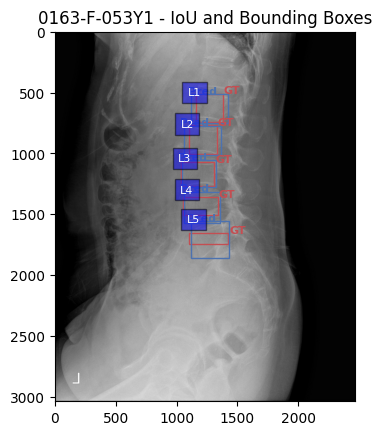

0164-F-064Y1의 클래스 L2에 대한 IOU: 0.72 (Confidence: 0.96)
0164-F-064Y1의 클래스 L3에 대한 IOU: 0.78 (Confidence: 0.96)
0164-F-064Y1의 클래스 L4에 대한 IOU: 0.59 (Confidence: 0.95)
0164-F-064Y1의 클래스 L1에 대한 IOU: 0.67 (Confidence: 0.94)
0164-F-064Y1의 클래스 L5에 대한 IOU: 0.27 (Confidence: 0.94)


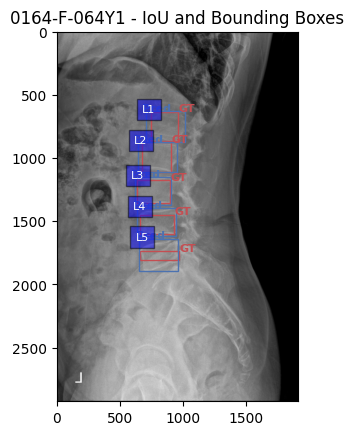

0165-M-078Y1의 클래스 L1에 대한 IOU: 0.81 (Confidence: 0.97)
0165-M-078Y1의 클래스 L3에 대한 IOU: 0.82 (Confidence: 0.96)
0165-M-078Y1의 클래스 L2에 대한 IOU: 0.69 (Confidence: 0.96)
0165-M-078Y1의 클래스 L5에 대한 IOU: 0.39 (Confidence: 0.96)
0165-M-078Y1의 클래스 L4에 대한 IOU: 0.81 (Confidence: 0.94)


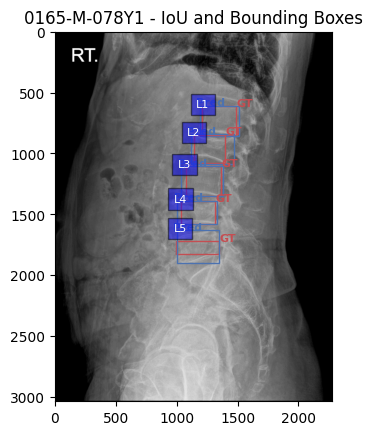

0166-F-071Y1의 클래스 L2에 대한 IOU: 0.66 (Confidence: 0.94)
0166-F-071Y1의 클래스 L1에 대한 IOU: 0.83 (Confidence: 0.93)
0166-F-071Y1의 클래스 L5에 대한 IOU: 0.77 (Confidence: 0.90)
0166-F-071Y1의 클래스 L4에 대한 IOU: 0.73 (Confidence: 0.90)
0166-F-071Y1의 클래스 L3에 대한 IOU: 0.65 (Confidence: 0.89)


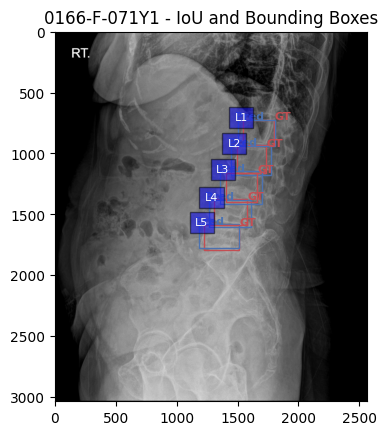

0167-F-049Y1의 클래스 L1에 대한 IOU: 0.72 (Confidence: 0.96)
0167-F-049Y1의 클래스 L5에 대한 IOU: 0.53 (Confidence: 0.95)
0167-F-049Y1의 클래스 L2에 대한 IOU: 0.77 (Confidence: 0.94)
0167-F-049Y1의 클래스 L4에 대한 IOU: 0.60 (Confidence: 0.94)
0167-F-049Y1의 클래스 L3에 대한 IOU: 0.88 (Confidence: 0.93)


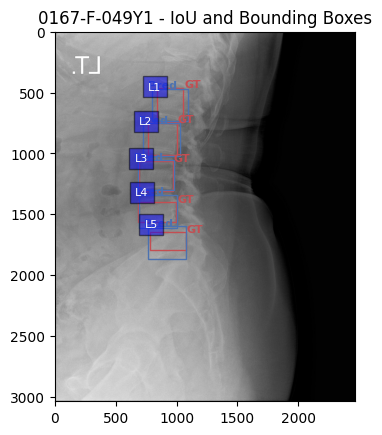

0168-M-055Y1의 클래스 L4에 대한 IOU: 0.83 (Confidence: 0.97)
0168-M-055Y1의 클래스 L1에 대한 IOU: 0.55 (Confidence: 0.96)
0168-M-055Y1의 클래스 L5에 대한 IOU: 0.37 (Confidence: 0.95)
0168-M-055Y1의 클래스 L2에 대한 IOU: 0.64 (Confidence: 0.94)
0168-M-055Y1의 클래스 L3에 대한 IOU: 0.78 (Confidence: 0.93)


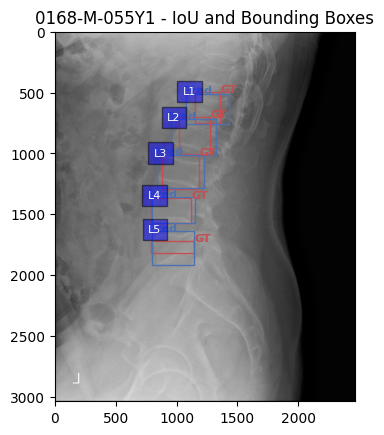

0173-F-079Y1의 클래스 L1에 대한 IOU: 0.66 (Confidence: 0.97)
0173-F-079Y1의 클래스 L4에 대한 IOU: 0.66 (Confidence: 0.96)
0173-F-079Y1의 클래스 L5에 대한 IOU: 0.18 (Confidence: 0.95)
0173-F-079Y1의 클래스 L3에 대한 IOU: 0.74 (Confidence: 0.95)
0173-F-079Y1의 클래스 L2에 대한 IOU: 0.56 (Confidence: 0.94)


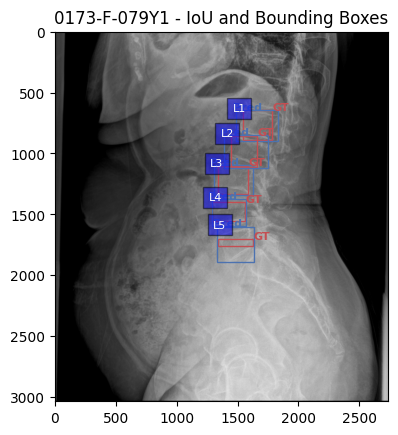

0174-M-063Y1의 클래스 L1에 대한 IOU: 0.55 (Confidence: 0.96)
0174-M-063Y1의 클래스 L4에 대한 IOU: 0.65 (Confidence: 0.95)
0174-M-063Y1의 클래스 L5에 대한 IOU: 0.11 (Confidence: 0.94)
0174-M-063Y1의 클래스 L3에 대한 IOU: 0.74 (Confidence: 0.94)
0174-M-063Y1의 클래스 L2에 대한 IOU: 0.60 (Confidence: 0.91)


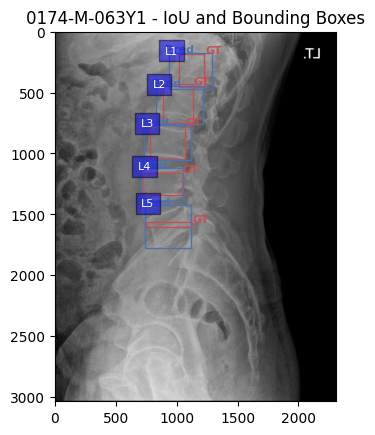

0175-M-053Y1의 클래스 L2에 대한 IOU: 0.56 (Confidence: 0.96)
0175-M-053Y1의 클래스 L1에 대한 IOU: 0.55 (Confidence: 0.96)
0175-M-053Y1의 클래스 L5에 대한 IOU: 0.18 (Confidence: 0.95)
0175-M-053Y1의 클래스 L4에 대한 IOU: 0.73 (Confidence: 0.95)
0175-M-053Y1의 클래스 L3에 대한 IOU: 0.70 (Confidence: 0.94)


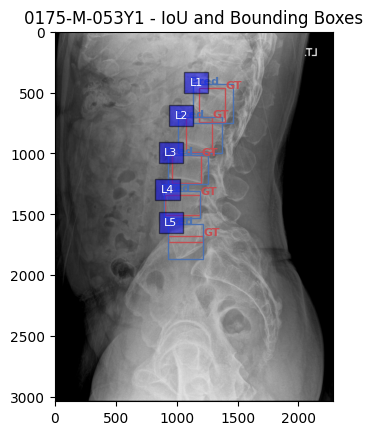

0180-M-082Y1의 클래스 L5에 대한 IOU: 0.39 (Confidence: 0.96)
0180-M-082Y1의 클래스 L4에 대한 IOU: 0.74 (Confidence: 0.96)
0180-M-082Y1의 클래스 L1에 대한 IOU: 0.78 (Confidence: 0.96)
0180-M-082Y1의 클래스 L2에 대한 IOU: 0.75 (Confidence: 0.96)
0180-M-082Y1의 클래스 L3에 대한 IOU: 0.83 (Confidence: 0.93)


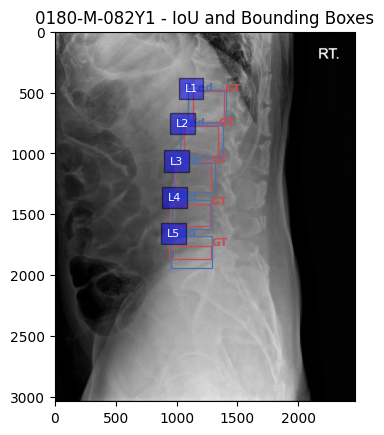

0183-F-080Y1의 클래스 L5에 대한 IOU: 0.42 (Confidence: 0.94)
0183-F-080Y1의 클래스 L2에 대한 IOU: 0.66 (Confidence: 0.93)
0183-F-080Y1의 클래스 L4에 대한 IOU: 0.85 (Confidence: 0.93)
0183-F-080Y1의 클래스 L1에 대한 IOU: 0.83 (Confidence: 0.93)
0183-F-080Y1의 클래스 L3에 대한 IOU: 0.80 (Confidence: 0.92)


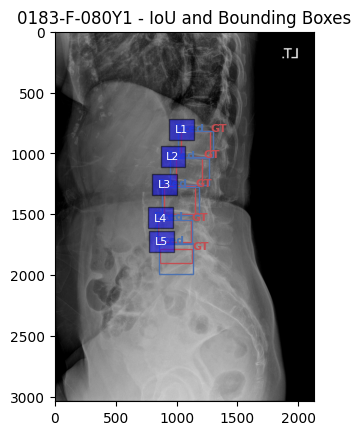

0185-F-073Y1의 클래스 L5에 대한 IOU: 0.10 (Confidence: 0.96)
0185-F-073Y1의 클래스 L1에 대한 IOU: 0.60 (Confidence: 0.96)
0185-F-073Y1의 클래스 L4에 대한 IOU: 0.39 (Confidence: 0.95)
0185-F-073Y1의 클래스 L3에 대한 IOU: 0.80 (Confidence: 0.91)
0185-F-073Y1의 클래스 L2에 대한 IOU: 0.71 (Confidence: 0.90)


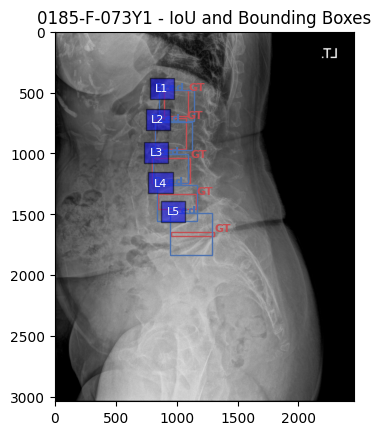

0188-F-066Y1의 클래스 L2에 대한 IOU: 0.57 (Confidence: 0.97)
0188-F-066Y1의 클래스 L4에 대한 IOU: 0.57 (Confidence: 0.96)
0188-F-066Y1의 클래스 L3에 대한 IOU: 0.71 (Confidence: 0.96)
0188-F-066Y1의 클래스 L1에 대한 IOU: 0.51 (Confidence: 0.95)
0188-F-066Y1의 클래스 L5에 대한 IOU: 0.21 (Confidence: 0.95)


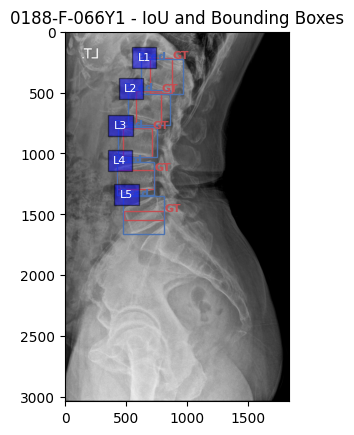

0189-M-068Y1의 클래스 L4에 대한 IOU: 0.72 (Confidence: 0.95)
0189-M-068Y1의 클래스 L2에 대한 IOU: 0.54 (Confidence: 0.95)
0189-M-068Y1의 클래스 L5에 대한 IOU: 0.64 (Confidence: 0.94)
0189-M-068Y1의 클래스 L1에 대한 IOU: 0.60 (Confidence: 0.94)
0189-M-068Y1의 클래스 L3에 대한 IOU: 0.55 (Confidence: 0.93)


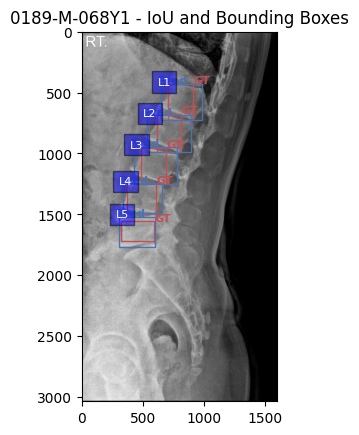

0195-F-064Y1의 클래스 L2에 대한 IOU: 0.63 (Confidence: 0.97)
0195-F-064Y1의 클래스 L5에 대한 IOU: 0.33 (Confidence: 0.96)
0195-F-064Y1의 클래스 L1에 대한 IOU: 0.52 (Confidence: 0.96)
0195-F-064Y1의 클래스 L4에 대한 IOU: 0.61 (Confidence: 0.95)
0195-F-064Y1의 클래스 L3에 대한 IOU: 0.75 (Confidence: 0.92)


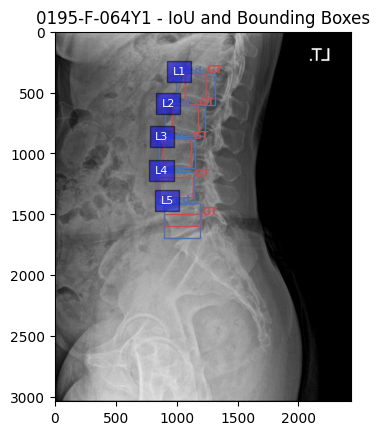

0196-F-051Y1의 클래스 L3에 대한 IOU: 0.78 (Confidence: 0.96)
0196-F-051Y1의 클래스 L4에 대한 IOU: 0.44 (Confidence: 0.96)
0196-F-051Y1의 클래스 L1에 대한 IOU: 0.60 (Confidence: 0.96)
0196-F-051Y1의 클래스 L5에 대한 IOU: 0.11 (Confidence: 0.95)
0196-F-051Y1의 클래스 L2에 대한 IOU: 0.69 (Confidence: 0.95)


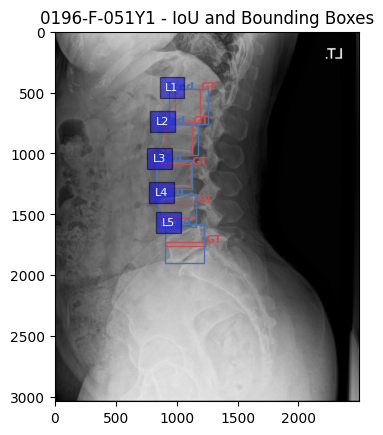

0197-F-077Y1의 클래스 L4에 대한 IOU: 0.48 (Confidence: 0.96)
0197-F-077Y1의 클래스 L5에 대한 IOU: 0.04 (Confidence: 0.94)
0197-F-077Y1의 클래스 L2에 대한 IOU: 0.53 (Confidence: 0.91)
0197-F-077Y1의 클래스 L3에 대한 IOU: 0.81 (Confidence: 0.90)
0197-F-077Y1의 클래스 L1에 대한 IOU: 0.62 (Confidence: 0.87)


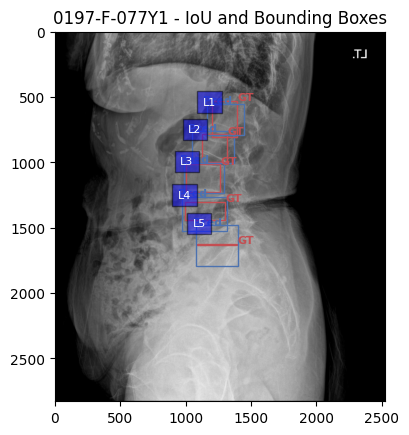

0202-F-068Y1의 클래스 L1에 대한 IOU: 0.55 (Confidence: 0.96)
0202-F-068Y1의 클래스 L4에 대한 IOU: 0.69 (Confidence: 0.96)
0202-F-068Y1의 클래스 L5에 대한 IOU: 0.28 (Confidence: 0.95)
0202-F-068Y1의 클래스 L2에 대한 IOU: 0.57 (Confidence: 0.94)
0202-F-068Y1의 클래스 L3에 대한 IOU: 0.80 (Confidence: 0.93)


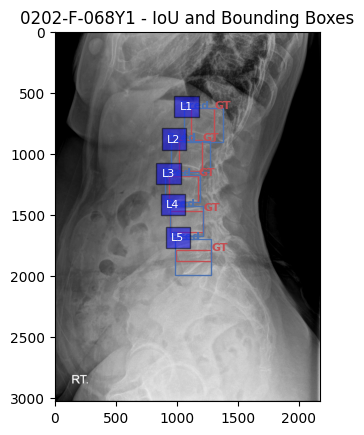

0205-M-063Y1의 클래스 L4에 대한 IOU: 0.61 (Confidence: 0.95)
0205-M-063Y1의 클래스 L1에 대한 IOU: 0.86 (Confidence: 0.95)
0205-M-063Y1의 클래스 L2에 대한 IOU: 0.78 (Confidence: 0.94)
0205-M-063Y1의 클래스 L5에 대한 IOU: 0.26 (Confidence: 0.93)
0205-M-063Y1의 클래스 L3에 대한 IOU: 0.81 (Confidence: 0.93)


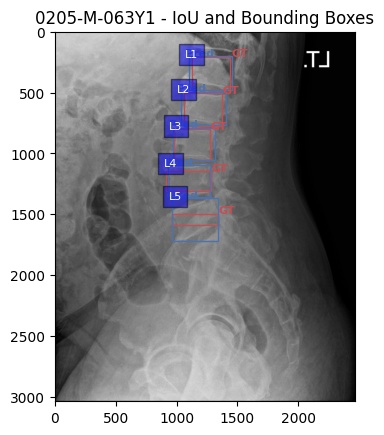

0206-F-070Y1의 클래스 L4에 대한 IOU: 0.79 (Confidence: 0.96)
0206-F-070Y1의 클래스 L5에 대한 IOU: 0.16 (Confidence: 0.94)
0206-F-070Y1의 클래스 L1에 대한 IOU: 0.42 (Confidence: 0.93)
0206-F-070Y1의 클래스 L3에 대한 IOU: 0.62 (Confidence: 0.93)
0206-F-070Y1의 클래스 L2에 대한 IOU: 0.38 (Confidence: 0.93)


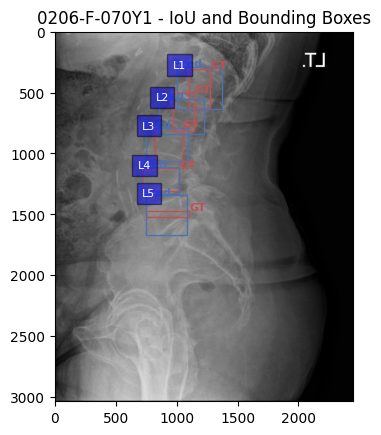

0209-M-072Y1의 클래스 L1에 대한 IOU: 0.45 (Confidence: 0.96)
0209-M-072Y1의 클래스 L4에 대한 IOU: 0.65 (Confidence: 0.95)
0209-M-072Y1의 클래스 L3에 대한 IOU: 0.69 (Confidence: 0.94)
0209-M-072Y1의 클래스 L2에 대한 IOU: 0.56 (Confidence: 0.94)
0209-M-072Y1의 클래스 L5에 대한 IOU: 0.18 (Confidence: 0.94)


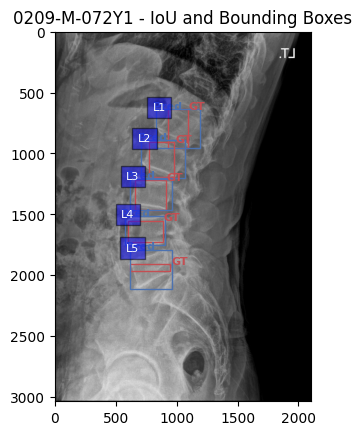

0211-F-055Y1의 클래스 L2에 대한 IOU: 0.56 (Confidence: 0.96)
0211-F-055Y1의 클래스 L1에 대한 IOU: 0.58 (Confidence: 0.96)
0211-F-055Y1의 클래스 L3에 대한 IOU: 0.62 (Confidence: 0.96)
0211-F-055Y1의 클래스 L5에 대한 IOU: 0.38 (Confidence: 0.95)
0211-F-055Y1의 클래스 L4에 대한 IOU: 0.80 (Confidence: 0.94)


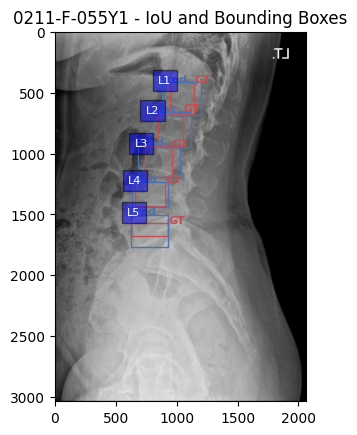

0214-F-072Y1의 클래스 L4에 대한 IOU: 0.80 (Confidence: 0.96)
0214-F-072Y1의 클래스 L5에 대한 IOU: 0.41 (Confidence: 0.95)
0214-F-072Y1의 클래스 L1에 대한 IOU: 0.51 (Confidence: 0.95)
0214-F-072Y1의 클래스 L2에 대한 IOU: 0.54 (Confidence: 0.93)
0214-F-072Y1의 클래스 L3에 대한 IOU: 0.79 (Confidence: 0.93)


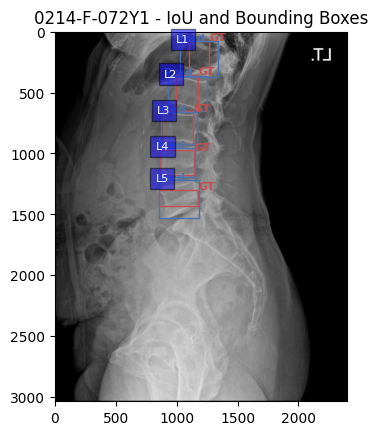

0220-F-069Y1의 클래스 L5에 대한 IOU: 0.31 (Confidence: 0.94)
0220-F-069Y1의 클래스 L4에 대한 IOU: 0.61 (Confidence: 0.94)
0220-F-069Y1의 클래스 L3에 대한 IOU: 0.77 (Confidence: 0.93)
0220-F-069Y1의 클래스 L1에 대한 IOU: 0.00 (Confidence: 0.86)
0220-F-069Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.86)
0220-F-069Y1의 클래스 L2에 대한 IOU: 0.00 (Confidence: 0.82)


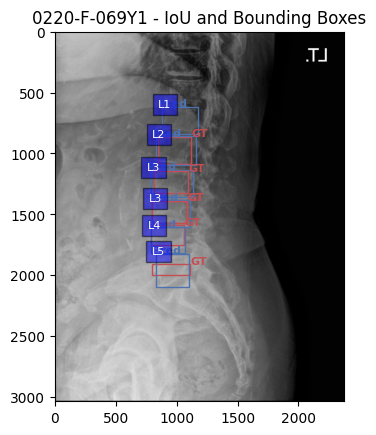

0223-F-063Y1의 클래스 L1에 대한 IOU: 0.58 (Confidence: 0.98)
0223-F-063Y1의 클래스 L4에 대한 IOU: 0.31 (Confidence: 0.96)
0223-F-063Y1의 클래스 L5에 대한 IOU: 0.23 (Confidence: 0.95)
0223-F-063Y1의 클래스 L3에 대한 IOU: 0.71 (Confidence: 0.94)
0223-F-063Y1의 클래스 L2에 대한 IOU: 0.44 (Confidence: 0.90)


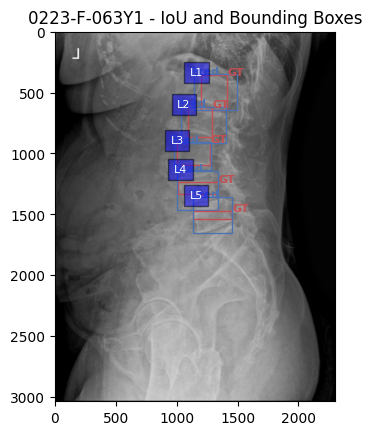

0225-M-086Y1의 클래스 L4에 대한 IOU: 0.24 (Confidence: 0.96)
0225-M-086Y1의 클래스 L1에 대한 IOU: 0.80 (Confidence: 0.96)
0225-M-086Y1의 클래스 L3에 대한 IOU: 0.48 (Confidence: 0.95)
0225-M-086Y1의 클래스 L5에 대한 IOU: 0.17 (Confidence: 0.94)
0225-M-086Y1의 클래스 L2에 대한 IOU: 0.84 (Confidence: 0.91)


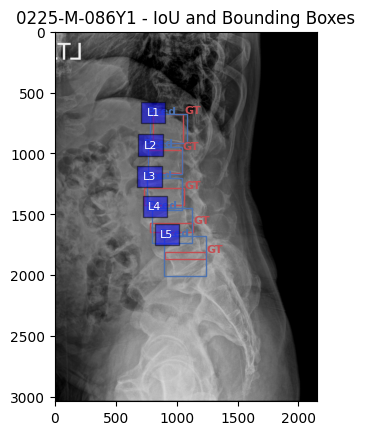

0226-M-060Y1의 클래스 L1에 대한 IOU: 0.63 (Confidence: 0.97)
0226-M-060Y1의 클래스 L4에 대한 IOU: 0.85 (Confidence: 0.96)
0226-M-060Y1의 클래스 L2에 대한 IOU: 0.58 (Confidence: 0.96)
0226-M-060Y1의 클래스 L3에 대한 IOU: 0.74 (Confidence: 0.94)
0226-M-060Y1의 클래스 L5에 대한 IOU: 0.36 (Confidence: 0.94)


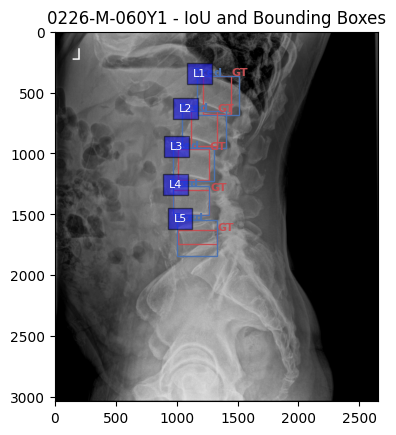

0228-F-057Y1의 클래스 L2에 대한 IOU: 0.51 (Confidence: 0.97)
0228-F-057Y1의 클래스 L4에 대한 IOU: 0.62 (Confidence: 0.97)
0228-F-057Y1의 클래스 L1에 대한 IOU: 0.44 (Confidence: 0.97)
0228-F-057Y1의 클래스 L3에 대한 IOU: 0.78 (Confidence: 0.96)
0228-F-057Y1의 클래스 L5에 대한 IOU: 0.23 (Confidence: 0.94)


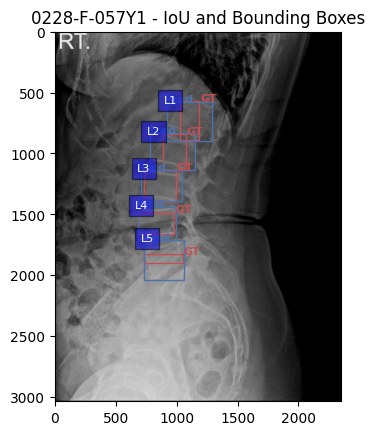

0229-F-078Y1의 클래스 L4에 대한 IOU: 0.12 (Confidence: 0.97)
0229-F-078Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.96)
0229-F-078Y1의 클래스 L3에 대한 IOU: 0.60 (Confidence: 0.84)
0229-F-078Y1의 클래스 L2에 대한 IOU: 0.03 (Confidence: 0.76)
0229-F-078Y1의 클래스 L3에 대한 IOU: 0.00 (Confidence: 0.68)
0229-F-078Y1의 클래스 L1에 대한 IOU: 0.02 (Confidence: 0.67)


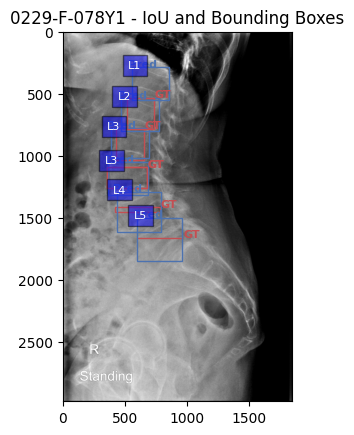

0238-F-067Y1의 클래스 L1에 대한 IOU: 0.50 (Confidence: 0.96)
0238-F-067Y1의 클래스 L2에 대한 IOU: 0.59 (Confidence: 0.95)
0238-F-067Y1의 클래스 L5에 대한 IOU: 0.50 (Confidence: 0.94)
0238-F-067Y1의 클래스 L4에 대한 IOU: 0.70 (Confidence: 0.94)
0238-F-067Y1의 클래스 L3에 대한 IOU: 0.63 (Confidence: 0.91)


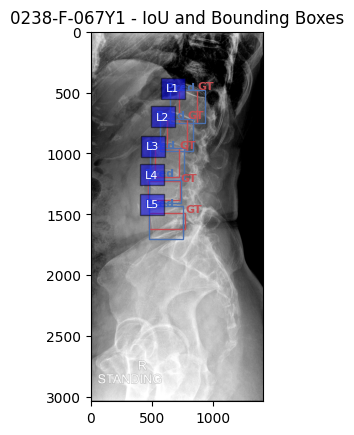

0247-F-063Y1의 클래스 L5에 대한 IOU: 0.52 (Confidence: 0.99)
0247-F-063Y1의 클래스 L2에 대한 IOU: 0.70 (Confidence: 0.96)
0247-F-063Y1의 클래스 L4에 대한 IOU: 0.87 (Confidence: 0.93)
0247-F-063Y1의 클래스 L3에 대한 IOU: 0.74 (Confidence: 0.91)


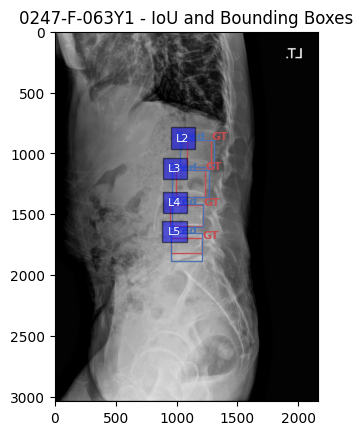

0248-F-058Y1의 클래스 L4에 대한 IOU: 0.82 (Confidence: 0.96)
0248-F-058Y1의 클래스 L1에 대한 IOU: 0.60 (Confidence: 0.96)
0248-F-058Y1의 클래스 L5에 대한 IOU: 0.53 (Confidence: 0.94)
0248-F-058Y1의 클래스 L3에 대한 IOU: 0.64 (Confidence: 0.94)
0248-F-058Y1의 클래스 L2에 대한 IOU: 0.57 (Confidence: 0.93)


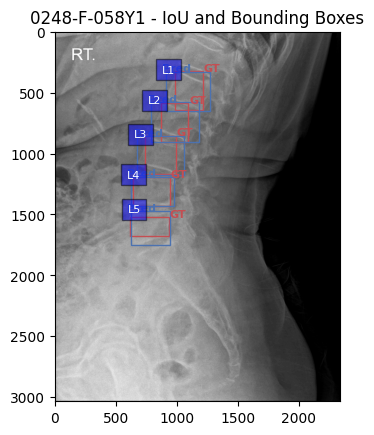

0255-F-053Y1의 클래스 L3에 대한 IOU: 0.83 (Confidence: 0.97)
0255-F-053Y1의 클래스 L4에 대한 IOU: 0.63 (Confidence: 0.96)
0255-F-053Y1의 클래스 L5에 대한 IOU: 0.37 (Confidence: 0.95)
0255-F-053Y1의 클래스 L2에 대한 IOU: 0.69 (Confidence: 0.94)
0255-F-053Y1의 클래스 L1에 대한 IOU: 0.04 (Confidence: 0.86)
0255-F-053Y1의 클래스 L2에 대한 IOU: 0.02 (Confidence: 0.79)
0255-F-053Y1의 클래스 L1에 대한 IOU: 0.65 (Confidence: 0.79)


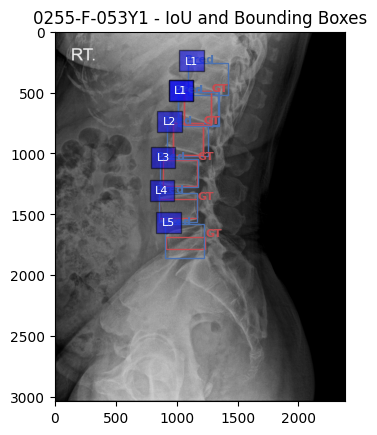

0272-M-035Y1의 클래스 L1에 대한 IOU: 0.69 (Confidence: 0.96)
0272-M-035Y1의 클래스 L3에 대한 IOU: 0.84 (Confidence: 0.95)
0272-M-035Y1의 클래스 L4에 대한 IOU: 0.42 (Confidence: 0.95)
0272-M-035Y1의 클래스 L5에 대한 IOU: 0.00 (Confidence: 0.94)
0272-M-035Y1의 클래스 L2에 대한 IOU: 0.80 (Confidence: 0.92)


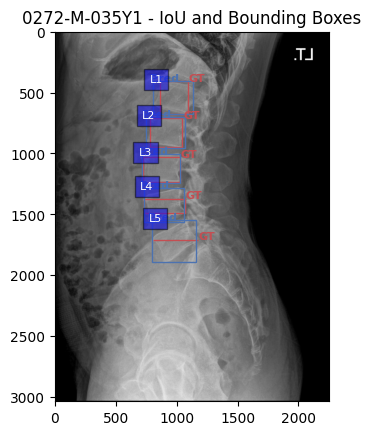

0279-M-043Y1의 클래스 L2에 대한 IOU: 0.55 (Confidence: 0.95)
0279-M-043Y1의 클래스 L1에 대한 IOU: 0.51 (Confidence: 0.95)
0279-M-043Y1의 클래스 L5에 대한 IOU: 0.36 (Confidence: 0.95)
0279-M-043Y1의 클래스 L3에 대한 IOU: 0.68 (Confidence: 0.95)
0279-M-043Y1의 클래스 L4에 대한 IOU: 0.77 (Confidence: 0.95)


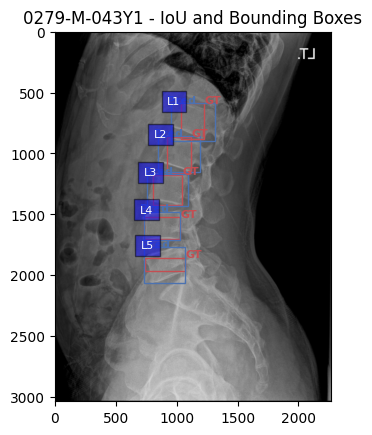

0379-M-040Y1의 클래스 L4에 대한 IOU: 0.85 (Confidence: 0.95)
0379-M-040Y1의 클래스 L1에 대한 IOU: 0.50 (Confidence: 0.94)
0379-M-040Y1의 클래스 L5에 대한 IOU: 0.60 (Confidence: 0.94)
0379-M-040Y1의 클래스 L3에 대한 IOU: 0.63 (Confidence: 0.93)
0379-M-040Y1의 클래스 L2에 대한 IOU: 0.41 (Confidence: 0.92)


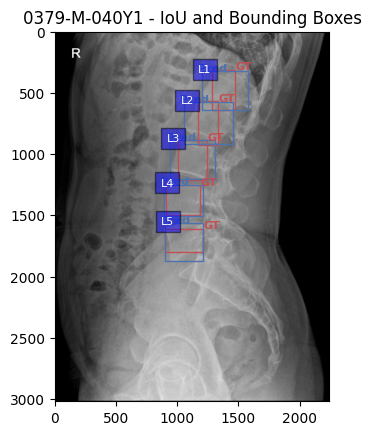

0391-M-046Y1의 클래스 L4에 대한 IOU: 0.84 (Confidence: 0.94)
0391-M-046Y1의 클래스 L2에 대한 IOU: 0.65 (Confidence: 0.94)
0391-M-046Y1의 클래스 L5에 대한 IOU: 0.41 (Confidence: 0.94)
0391-M-046Y1의 클래스 L3에 대한 IOU: 0.71 (Confidence: 0.94)
0391-M-046Y1의 클래스 L1에 대한 IOU: 0.75 (Confidence: 0.91)


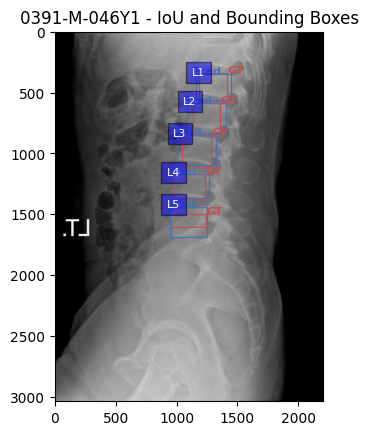

In [ ]:

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# 클래스 이름 정의
class_labels = {0: 'L1', 1: 'L2', 2: 'L3', 3: 'L4', 4: 'L5'}

iou_threshold = 0.6  # 신뢰도 임계값 (confidence score)

for result in results:
    preds = result.boxes.xyxy.cpu().numpy()  # 예측된 바운딩 박스 좌표
    pred_classes_batch = result.boxes.cls.cpu().numpy()  # 예측된 클래스
    confidences_batch = result.boxes.conf.cpu().numpy()  # 예측된 confidence score
    image_path = result.path
    image_name = os.path.basename(image_path)
    image_name_no_ext = os.path.splitext(image_name)[0]

    # 이미지를 로드
    img = Image.open(image_path)

    gt_row = la_df[la_df['filename'] == image_name_no_ext]
    if not gt_row.empty:
        gt_boxes = {}
        for i in range(1, 6):  # 각 클래스의 실제 바운딩 박스 정보 가져오기
            gt_box = [
                gt_row[f'L{i}a_1c'].values[0],
                gt_row[f'L{i}a_1r'].values[0],
                gt_row[f'L{i}a_2c'].values[0],
                gt_row[f'L{i}a_2r'].values[0]
            ]
            gt_boxes[i - 1] = gt_box

        # 이미지 시각화 준비
        fig, ax = plt.subplots(1)
        ax.imshow(img, cmap='gray')  # 이미지를 흑백으로 표시

        # 예측된 바운딩 박스와 ground truth 바운딩 박스를 그려줌
        for pred_box, pred_class, conf in zip(preds, pred_classes_batch, confidences_batch):
            if conf >= iou_threshold:  # 신뢰도 임계값 0.6 이상인 경우만 처리
                if pred_class in gt_boxes:
                    gt_box = gt_boxes[pred_class]
                    iou_value = calculate_iou(gt_box, pred_box)

                    # Ground truth 박스 그리기 (빨간색) 및 'GT' 레이블 추가
                    gt_rect = patches.Rectangle((gt_box[0], gt_box[1]), gt_box[2] - gt_box[0], gt_box[3] - gt_box[1],
                                                linewidth=1, edgecolor='r', facecolor='none')  # 선 굵기를 1로 줄임
                    ax.add_patch(gt_rect)
                    ax.text(gt_box[2] + 5, gt_box[1], 'GT', color='r', fontsize=8, fontweight='bold')  # GT 글씨를 박스 우측으로 이동

                    # 예측 박스 그리기 (파란색) 및 'Pred' 레이블 추가
                    pred_rect = patches.Rectangle((pred_box[0], pred_box[1]), pred_box[2] - pred_box[0], pred_box[3] - pred_box[1],
                                                  linewidth=1, edgecolor='b', facecolor='none')  # 선 굵기를 1로 줄임
                    ax.add_patch(pred_rect)
                    ax.text(pred_box[0] - 30, pred_box[1], 'Pred', color='b', fontsize=8, fontweight='bold')  # Pred 글씨를 박스 좌측으로 이동

                    # 클래스 이름 추가 (예: L1, L2 등)
                    class_label = class_labels.get(int(pred_class), 'Unknown')
                    ax.text(pred_box[0] - 30, pred_box[1] + 10, class_label, color='white', fontsize=8, bbox=dict(facecolor='blue', alpha=0.5))

                    # IoU 값을 출력
                    print(f"{image_name_no_ext}의 클래스 {class_label}에 대한 IOU: {iou_value:.2f} (Confidence: {conf:.2f})")

        # 이미지 출력
        plt.title(f"{image_name_no_ext} - IoU and Bounding Boxes")
        plt.show()

In [ ]:
# 우선 데이터 저장할 딕셔너리 초기화
iou_dict = {}

# 각 클래스별로 IoU 값을 저장
for image_name, pred_class, iou_value in zip(image_names, pred_classes, iou_values):
    if image_name not in iou_dict:
        # 이미지 이름이 처음 등장하면 해당 이미지의 클래스별 iou를 빈 값으로 초기화
        iou_dict[image_name] = {'L1': np.nan, 'L2': np.nan, 'L3': np.nan, 'L4': np.nan, 'L5': np.nan}

    # 예측된 클래스에 따라 해당 클래스의 IoU 값 업데이트
    iou_dict[image_name][f'L{int(pred_class) + 1}'] = max(iou_dict[image_name].get(f'L{int(pred_class) + 1}', np.nan), iou_value)

# 딕셔너리를 DataFrame으로 변환
df = pd.DataFrame.from_dict(iou_dict, orient='index').reset_index()

# 'index' 열을 'image_name'으로 변경
df.rename(columns={'index': 'image_name'}, inplace=True)

# CSV 파일로 저장
df.to_csv('/content/drive/MyDrive/IOU_YOLO+RCNN/iou_la.csv', index=False)

print("CSV 파일로 저장되었습니다.")

CSV 파일로 저장되었습니다.


In [ ]:
# 블록 2: IOU 값의 히스토그램 시각화
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(iou_values, bins=20, edgecolor='black', alpha=0.7)
plt.title('IOU Value Distribution')
plt.xlabel('IOU Value')
plt.ylabel('Frequency')
plt.axvline(x=0.6, color='red', linestyle='--', label='Threshold = 0.6')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# 블록 3: 0.6보다 낮은 IOU 값 찾기
low_iou_results = [(image_name, pred_class, iou_value)
                   for (image_name, pred_class, iou_value)
                   in zip(image_names, pred_classes, iou_values)
                   if iou_value < 0.4]

# 낮은 IOU 값을 가진 결과 출력
if low_iou_results:
    print("IOU 값이 0.4보다 낮은 결과:")
    for image_name, pred_class, iou_value in low_iou_results:
        print(f"이미지: {image_name}, 클래스: {pred_class}, IOU: {iou_value}")
else:
    print("모든 IOU 값이 0.4 이상입니다.")

# YOLOv5 모델링


### Bounding Box 계산

In [ ]:
image_width, image_height = image.size
print(f"이미지 크기: {image_width}x{image_height}")

In [ ]:
bounding_boxes = []

# CSV 파일에서 좌표 데이터 불러오기 (5번째 열 제거)
df = pd.read_csv(csv_path, sep=',', header=None).iloc[:, :4]  # 처음 4열만 사용

for i in range(0, len(df), 2):  # 두 행씩 묶어서 처리
    if i+1 < len(df):  # 다음 행이 존재할 경우에만 처리
        # (1, 2, 12, 11)
        x1, y1 = df.iloc[i, 0], df.iloc[i, 1]  # 첫 번째 행의 (A, B)
        x2, y2 = df.iloc[i, 2], df.iloc[i, 3]  # 첫 번째 행의 (C, D)
        x3, y3 = df.iloc[i+1, 2], df.iloc[i+1, 3]  # 두 번째 행의 (C, D)
        x4, y4 = df.iloc[i+1, 0], df.iloc[i+1, 1]  # 두 번째 행의 (A, B)

        # Bounding Box 계산: 좌측 상단과 너비, 높이 계산
        x_min = min(x1, x2, x3, x4)
        y_min = min(y1, y2, y3, y4)
        x_max = max(x1, x2, x3, x4)
        y_max = max(y1, y2, y3, y4)

        # 중심 좌표와 너비, 높이 계산
        x_center = (x_min + x_max) / 2 / image_width
        y_center = (y_min + y_max) / 2 / image_height
        width = (x_max - x_min) / image_width
        height = (y_max - y_min) / image_height

        # YOLOv5 형식으로 저장: class_id, x_center, y_center, width, height
        bounding_boxes.append((x_center, y_center, width, height))

In [ ]:
import matplotlib.patches as patches

# 이미지 시각화
fig, ax = plt.subplots(1)
ax.imshow(image)

# Bounding Box 그리기 (이미지 크기로 다시 복원하여 좌표 계산)
for bbox in bounding_boxes:
    x_center, y_center, width, height = bbox
    # 상대 좌표를 이미지 크기로 변환
    x_center *= image_width
    y_center *= image_height
    width *= image_width
    height *= image_height

    # YOLO 형식에서 좌측 상단 좌표 계산
    x_min = x_center - (width / 2)
    y_min = y_center - (height / 2)

    # Bounding Box 그리기
    rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor='yellow', facecolor='none')
    ax.add_patch(rect)

# 결과 출력
plt.show()

In [ ]:
!pip install pandas openpyxl
import pandas as pd

file_name = os.path.join(extract_folder, 'BUU-LSPINE_400_report.xlsx')

df = pd.read_excel(file_name)

# 데이터 확인
print(df.head())
